In [1]:
rm(list=ls())
setwd("/hpc/group/pbenfeylab/CheWei/")

In [2]:
libs <- c("here", "dplyr", "tradeSeq", "SingleCellExperiment", "slingshot",
           "condiments", "scater", "RColorBrewer", "pheatmap", "cowplot",
          "tidyr","condimentsPaper","Seurat")
suppressMessages(
  suppressWarnings(sapply(libs, require, character.only = TRUE))
)

here                dplyr             tradeSeq 
                TRUE                 TRUE                 TRUE 
SingleCellExperiment            slingshot           condiments 
                TRUE                 TRUE                 TRUE 
              scater         RColorBrewer             pheatmap 
                TRUE                 TRUE                 TRUE 
             cowplot                tidyr      condimentsPaper 
                TRUE                 TRUE                FALSE 
              Seurat 
                TRUE

In [3]:
suppressPackageStartupMessages({
  library(slingshot); library(SingleCellExperiment)
  library(RColorBrewer); library(scales)
  library(viridis); library(UpSetR)
  library(pheatmap); library(msigdbr)
  library(fgsea); library(knitr)
  library(ggplot2); library(gridExtra)
  library(tradeSeq);library(Seurat)
  library(tidyverse);library(condiments)
  library(patchwork);library(ComplexHeatmap)
  library(circlize);library(WGCNA)  
  library(tricycle);library(GeneOverlap)
  library(gprofiler2);library(ggrepel)
})

In [4]:
sessionInfo()

R version 4.2.2 (2022-10-31)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: AlmaLinux 9.4 (Seafoam Ocelot)

Matrix products: default
BLAS/LAPACK: /hpc/group/pbenfeylab/ch416/miniconda3/envs/seu4/lib/libopenblasp-r0.3.21.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] grid      stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] ggrepel_0.9.4               gprofiler2_0.2.2           
 [3] GeneOverlap_1.34.0          tricycle_1.6.0             
 [5] WGCNA_1.72-1                fastcluster_1.2.3          
 [7] dynamicTreeCut_1.63-1       circlize_0.4.15            
 [9] Comple

In [5]:
rc.integrated <- readRDS("./scRNA-seq/Integrated_Objects/rc.integrated_18S_WT_cell_cycle_seu4_all_genes_20230907.rds")

In [6]:
head(rc.integrated@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,nCount_spliced_RNA,nFeature_spliced_RNA,nCount_unspliced_RNA,nFeature_unspliced_RNA,percent.mt,percent.cp,nCount_SCT,...,endomito.anno.S,endomito.anno.cor.S,endomito.anno.pvalue.S,Signature_2C,Signature_4C,Signature_8C,Signature_16C,endo_mito_G2M_anno,Signature_Endo,Signature_G2M
,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,...,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
AAACCTGAGCGCCTCA_1,dc1,7170,2579,5764,2351,1406,651,0.11157601,0.06973501,10049,...,G2M,0.6678974,3.360576e-27,0.02082176,0.3498531,-0.1981609,-0.1434493,Mito,-0.4840441,-0.1089351
AAACCTGCAGGACGTA_1,dc1,15224,4203,13390,3889,1834,954,0.02627430,0.01970573,11521,...,Mito,0.8605169,6.590369e-60,0.26251932,-0.1161063,0.3857987,0.2374772,Endo,-0.4840441,-0.1089351
AAACCTGGTATCACCA_1,dc1,4748,1922,3756,1763,992,484,0.21061500,0.52653749,10035,...,Endo,0.7400842,5.846399e-36,0.25245732,0.2653288,-0.1146687,-0.3223895,Mito,-0.4840441,-0.1089351
AAACGGGCAATAGAGT_1,dc1,143210,9343,112840,8891,30370,3514,0.02304308,0.02304308,10392,...,Endo,0.6223682,7.766415e-23,-0.20722212,0.1255241,0.6417355,0.1286403,Mito,0.7140807,-0.1089351
AAACGGGCACTGTCGG_1,dc1,3075,1646,2574,1500,501,340,0.19512195,0.16260163,9378,...,Endo,0.8595862,1.212781e-59,-0.06071600,-0.1187295,-0.2608747,-0.1995916,Mito,-0.4840441,-0.1089351
AAACGGGGTCACCCAG_1,dc1,3112,1615,2681,1439,431,345,0.12853470,0.03213368,9214,...,Mito,0.8599539,9.535834e-60,-0.09531667,-0.2347054,-0.1495408,0.1486331,Mito,-0.4840441,-0.1089351


In [7]:
table(rc.integrated$orig.ident)


     dc1      dc2 sc_10_at    sc_11    sc_12   sc_157   sc_158   sc_159 
    2323     2052     2435     2532     1866     1210     1231     1173 
  sc_169   sc_170   sc_171    sc_20   sc_215   sc_221   sc_229   sc_235 
    2460     2282     3850     2096     6754     8986     3515     2090 
   sc_71     tnw1 
    4205     1411 

In [8]:
table(rc.integrated$celltype.anno.Li)


     Quiescent Center             Columella      Lateral Root Cap 
                  385                  3063                 27495 
         Atrichoblast           Trichoblast                Cortex 
                 8115                  6549                  2630 
           Endodermis                Phloem                 Xylem 
                 2777                    88                   173 
           Procambium  Xylem Pole Pericycle Phloem Pole Pericycle 
                   88                  1059                    49 

In [9]:
#keep_idx <- names(which((rc.integrated$sample=="sc_43") | (rc.integrated$sample=="sc_44") |(rc.integrated$sample=="sc_45")|(rc.integrated$sample=="sc_46")|(rc.integrated$sample=="sc_47")|(rc.integrated$sample=="sc_48")|(rc.integrated$sample=="sc_49")|(rc.integrated$sample=="sc_50")))
#rc.integrated <- subset(rc.integrated,cells=keep_idx)
#dat <- as.data.frame(matrix(NA,ncol(rc.integrated),ncol(sc_meta)))
#colnames(dat) <- colnames(sc_meta)
#for (i in names(table(rc.integrated$orig.ident))) {
# idx <- which(rc.integrated$orig.ident==i)
# dat[idx,]=sc_meta[which(sc_meta$sample==i),]
#}
#rownames(dat) <- colnames(rc.integrated)
wanted_cols <- c("orig.ident", "celltype.anno.Li", "tricyclePosition","tricycleCCStage")
rc.integrated@meta.data <- rc.integrated@meta.data[,wanted_cols]
colnames(rc.integrated@meta.data) <- c("sample","cell_type", "tricyclePosition","tricycleCCStage")
#rc.integrated@meta.data <- cbind(dat,rc.integrated@meta.data)

In [10]:
table(rc.integrated$sample)


     dc1      dc2 sc_10_at    sc_11    sc_12   sc_157   sc_158   sc_159 
    2323     2052     2435     2532     1866     1210     1231     1173 
  sc_169   sc_170   sc_171    sc_20   sc_215   sc_221   sc_229   sc_235 
    2460     2282     3850     2096     6754     8986     3515     2090 
   sc_71     tnw1 
    4205     1411 

In [11]:
table(rc.integrated$cell_type)


     Quiescent Center             Columella      Lateral Root Cap 
                  385                  3063                 27495 
         Atrichoblast           Trichoblast                Cortex 
                 8115                  6549                  2630 
           Endodermis                Phloem                 Xylem 
                 2777                    88                   173 
           Procambium  Xylem Pole Pericycle Phloem Pole Pericycle 
                   88                  1059                    49 

In [12]:
plot_anno <- function(rc.integrated){
order <- c("Quiescent Center", "Columella", "Lateral Root Cap", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem","Protophloem", "Xylem", "Procambium","Pericycle","Phloem Pole Pericycle", "Protoxylem", "Xylem Pole Pericycle")
palette <- c("#9400D3", "#5AB953", "#BFEF45", "#008080", "#21B6A8", "#82B6FF", "#0000FF","#E6194B", "#DD77EC", "#9A6324", "#FFE119", "#FF9900", "#FFD4E3", "#9A6324", "#DDAA6F")
rc.integrated$cell_type <- factor(rc.integrated$cell_type, levels = order[sort(match(unique(rc.integrated$cell_type),order))])
color <- palette[sort(match(unique(rc.integrated$cell_type),order))]
DimPlot(rc.integrated, reduction = "umap", group.by = "cell_type", cols=color, pt.size=0.2)}

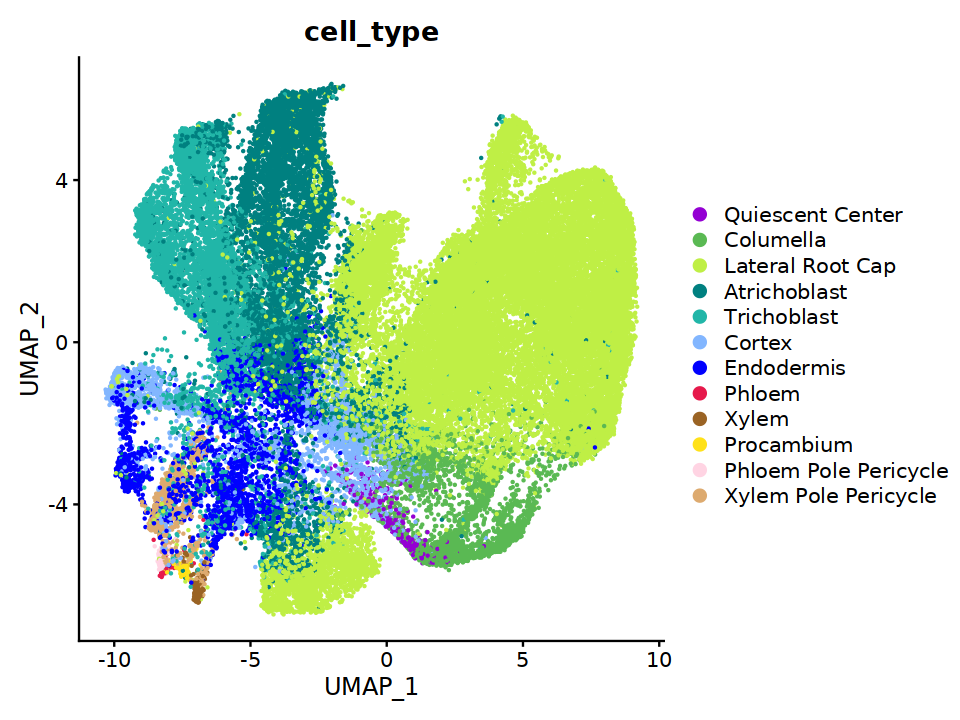

In [13]:
options(repr.plot.width=8, repr.plot.height=6)
plot_anno(rc.integrated)

## Inspect gene expression over tricycle position

In [14]:
pltctsg <- function(gene){
    
keygene.idx <- which(rownames(rc.integrated@assays$SCT@data) == gene)

fit.l <- fit_periodic_loess((rc.integrated$tricyclePosition*pi)[which(rc.integrated$cell_type=="Quiescent Center")],
                            rc.integrated@assays$SCT@data[keygene.idx,which(rc.integrated$cell_type=="Quiescent Center")],
                            plot = FALSE, span=0.3,
                       x_lab = "Cell cycle position \u03b8", y_lab = "log2(keygene)")
fit <- fit.l$pred.df

fit.l <- fit_periodic_loess((rc.integrated$tricyclePosition*pi)[which(rc.integrated$cell_type=="Columella")],
                            rc.integrated@assays$SCT@data[keygene.idx,which(rc.integrated$cell_type=="Columella")],
                            plot = FALSE, span=0.3,
                       x_lab = "Cell cycle position \u03b8", y_lab = "log2(keygene)")

fit <- rbind(fit, fit.l$pred.df)

fit.l <- fit_periodic_loess((rc.integrated$tricyclePosition*pi)[which(rc.integrated$cell_type=="Lateral Root Cap")],
                            rc.integrated@assays$SCT@data[keygene.idx,which(rc.integrated$cell_type=="Lateral Root Cap")],
                            plot = FALSE, span=0.3,
                       x_lab = "Cell cycle position \u03b8", y_lab = "log2(keygene)")

fit <- rbind(fit, fit.l$pred.df)

fit.l <- fit_periodic_loess((rc.integrated$tricyclePosition*pi)[which(rc.integrated$cell_type=="Atrichoblast")],
                            rc.integrated@assays$SCT@data[keygene.idx,which(rc.integrated$cell_type=="Atrichoblast")],
                            plot = FALSE, span=0.3,
                       x_lab = "Cell cycle position \u03b8", y_lab = "log2(keygene)")

fit <- rbind(fit, fit.l$pred.df)

fit.l <- fit_periodic_loess((rc.integrated$tricyclePosition*pi)[which(rc.integrated$cell_type=="Trichoblast")],
                            rc.integrated@assays$SCT@data[keygene.idx,which(rc.integrated$cell_type=="Trichoblast")],
                            plot = FALSE, span=0.3,
                       x_lab = "Cell cycle position \u03b8", y_lab = "log2(keygene)")

fit <- rbind(fit, fit.l$pred.df)

fit.l <- fit_periodic_loess((rc.integrated$tricyclePosition*pi)[which(rc.integrated$cell_type=="Cortex")],
                            rc.integrated@assays$SCT@data[keygene.idx,which(rc.integrated$cell_type=="Cortex")],
                            plot = FALSE, span=0.3,
                       x_lab = "Cell cycle position \u03b8", y_lab = "log2(keygene)")

fit <- rbind(fit, fit.l$pred.df)

fit.l <- fit_periodic_loess((rc.integrated$tricyclePosition*pi)[which(rc.integrated$cell_type=="Endodermis")],
                            rc.integrated@assays$SCT@data[keygene.idx,which(rc.integrated$cell_type=="Endodermis")],
                            plot = FALSE, span=0.3,
                       x_lab = "Cell cycle position \u03b8", y_lab = "log2(keygene)")

fit <- rbind(fit, fit.l$pred.df)
    
fit.l <- fit_periodic_loess((rc.integrated$tricyclePosition*pi)[which(rc.integrated$cell_type=="Phloem")],
                            rc.integrated@assays$SCT@data[keygene.idx,which(rc.integrated$cell_type=="Phloem")],
                            plot = FALSE, span=0.3,
                       x_lab = "Cell cycle position \u03b8", y_lab = "log2(keygene)")

fit <- rbind(fit, fit.l$pred.df)
    
fit.l <- fit_periodic_loess((rc.integrated$tricyclePosition*pi)[which(rc.integrated$cell_type=="Xylem")],
                            rc.integrated@assays$SCT@data[keygene.idx,which(rc.integrated$cell_type=="Xylem")],
                            plot = FALSE, span=0.3,
                       x_lab = "Cell cycle position \u03b8", y_lab = "log2(keygene)")

fit <- rbind(fit, fit.l$pred.df)
    
fit.l <- fit_periodic_loess((rc.integrated$tricyclePosition*pi)[which(rc.integrated$cell_type=="Procambium")],
                            rc.integrated@assays$SCT@data[keygene.idx,which(rc.integrated$cell_type=="Procambium")],
                            plot = FALSE, span=0.3,
                       x_lab = "Cell cycle position \u03b8", y_lab = "log2(keygene)")

fit <- rbind(fit, fit.l$pred.df)

fit.l <- fit_periodic_loess((rc.integrated$tricyclePosition*pi)[which(rc.integrated$cell_type=="Phloem Pole Pericycle")],
                            rc.integrated@assays$SCT@data[keygene.idx,which(rc.integrated$cell_type=="Phloem Pole Pericycle")],
                            plot = FALSE, span=0.3,
                       x_lab = "Cell cycle position \u03b8", y_lab = "log2(keygene)")

fit <- rbind(fit, fit.l$pred.df)

fit.l <- fit_periodic_loess((rc.integrated$tricyclePosition*pi)[which(rc.integrated$cell_type=="Xylem Pole Pericycle")],
                            rc.integrated@assays$SCT@data[keygene.idx,which(rc.integrated$cell_type=="Xylem Pole Pericycle")],
                            plot = FALSE, span=0.3,
                       x_lab = "Cell cycle position \u03b8", y_lab = "log2(keygene)")

fit <- rbind(fit, fit.l$pred.df)

fit$treatment <- factor(c(rep("Quiescent Center", 200),rep("Columella", 200),rep("LRC", 200) ,rep("Atrichoblast", 200),rep("Trichoblast", 200),rep("Cortex", 200),rep("Endodermis", 200),rep("Phloem", 200),rep("Xylem", 200),rep("Procambium", 200),rep("Phloem Pole Pericycle", 200),rep("Xylem Pole Pericycle", 200)),
                  levels=c("Quiescent Center", "Columella", "LRC", "Atrichoblast", "Trichoblast", "Cortex", "Endodermis", "Phloem", "Xylem", "Procambium","Pericycle","Phloem Pole Pericycle", "Xylem Pole Pericycle"))

options(repr.plot.width=8, repr.plot.height=6)
print(ggplot(fit, aes(x=x,y=y,color=treatment)) + geom_path(size = 1, alpha = 1)+ labs(x = "tricycle position θ", y = "smoothed expression", title = gene) + 
            scale_x_continuous(limits = c(0, 2 * pi), breaks = c(0, 
                pi/2, pi, 3 * pi/2, 2 * pi), labels = paste0(c(0, 
                0.5, 1, 1.5, 2), "π"), name = "tricycle position θ")+
    scale_color_manual(values = c("#9400D3", "#5AB953", "#BFEF45", "#008080", "#21B6A8", "#82B6FF", "#0000FF","#E6194B","#9A6324", "#FFE119", "#FFD4E3","#DDAA6F"))+
  theme_bw(base_size = 14)+
  theme(legend.title=element_blank()))
      #geom_vline(xintercept = 1*pi, linetype="dotted", 
      #          color = "red", size=1.5)+ geom_vline(xintercept = 1.55*pi, linetype="dotted", 
      #          color = "red", size=1.5)+ annotate("text", x = 0.5*pi, y =3.4 , label = "G1", size = 6)+ 
    #annotate("text", x = 1.27*pi, y =3.4 , label = "S", size = 6)+ annotate("text", x = 1.8*pi, y =3.4 , label = "G2M", size = 6))
}

In [15]:
pltsg <- function(gene){
    keygene.idx <- which(rownames(rc.integrated@assays$SCT@data) == gene)
    fit.l <- fit_periodic_loess(rc.integrated$tricyclePosition*pi,
                            rc.integrated@assays$SCT@data[keygene.idx,],
                            plot = FALSE, span=0.3,
                       x_lab = "Cell cycle position \u03b8", y_lab = "log2(keygene)")
    fit <- fit.l$pred.df
    options(repr.plot.width=8, repr.plot.height=6)
    print(ggplot(fit, aes(x=x,y=y)) + geom_path(size = 1, alpha = 1)+ labs(x = "θ", y = "smoothed gene expression", title = gene) + 
                scale_x_continuous(limits = c(0, 2 * pi), breaks = c(0, 
                    pi/2, pi, 3 * pi/2, 2 * pi), labels = paste0(c(0, 
                    0.5, 1, 1.5, 2), "π"), name = "θ")+
      #              scale_x_continuous(limits = c(0, 200), breaks = c(0, 
      #              50, 100, 150, 200), labels = paste0(c(0, 
      #              0.5, 1, 1.5, 2), "π"), name = "θ")+
      theme_bw(base_size = 14)+
      theme(legend.title=element_blank()))
} 

## Marker reported by Laura Lee

png 
  2

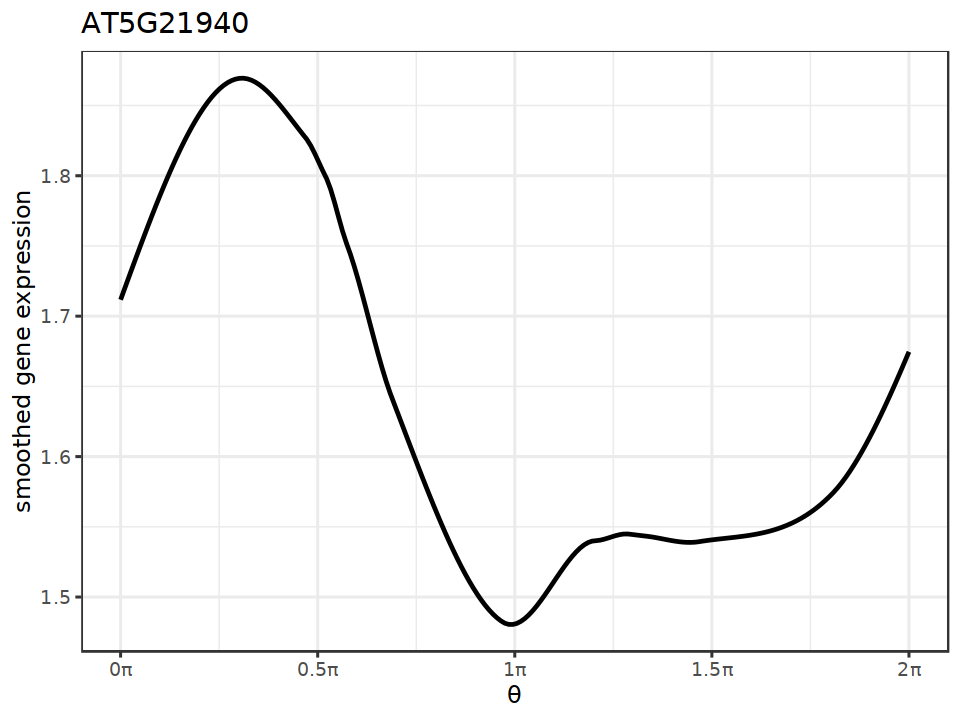

In [30]:
## G1 marker reported by Laura Lee
grDevices::cairo_pdf("Laura_G1_marker.pdf",width=8, height=6)
pltsg('AT5G21940')
dev.off()

pltsg('AT5G21940')

png 
  2

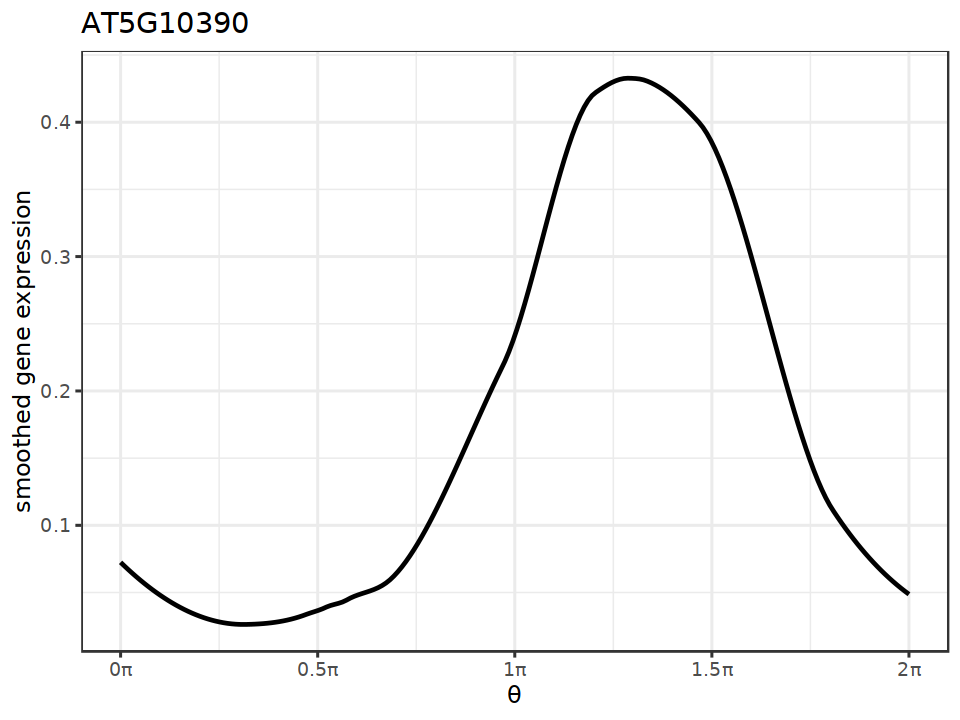

In [31]:
## S marker reported by Laura Lee
grDevices::cairo_pdf("Laura_S_marker.pdf",width=8, height=6)
pltsg('AT5G10390')
dev.off()

pltsg('AT5G10390')

png 
  2

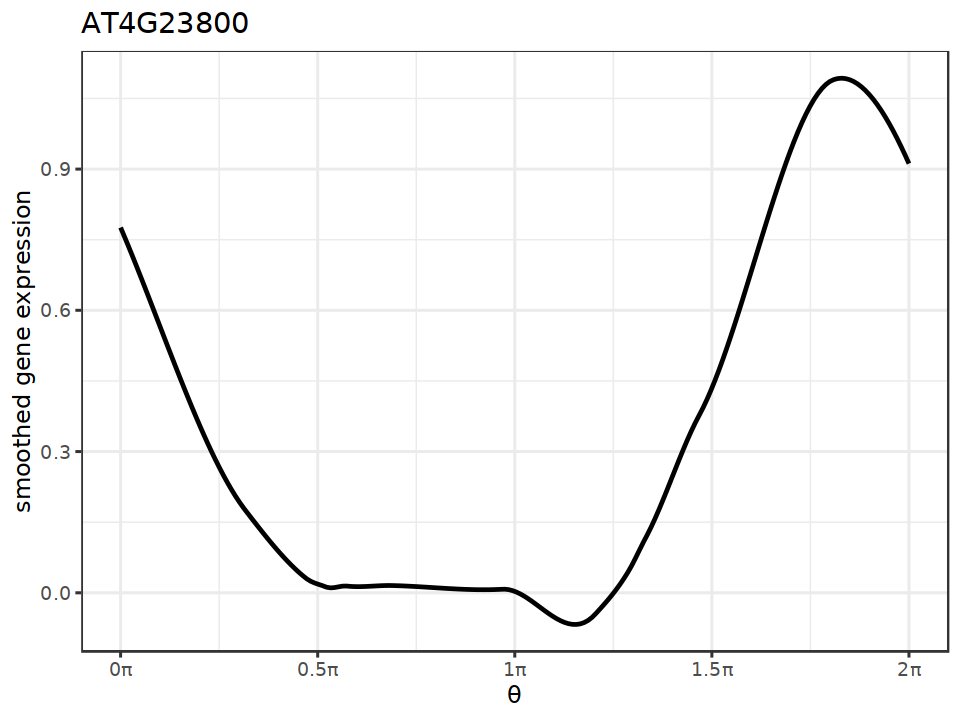

In [32]:
## G2M marker reported by Laura Lee
grDevices::cairo_pdf("Laura_G2M_marker.pdf",width=8, height=6)
pltsg('AT4G23800')
dev.off()

pltsg('AT4G23800')

## Marker reported in this study

png 
  2

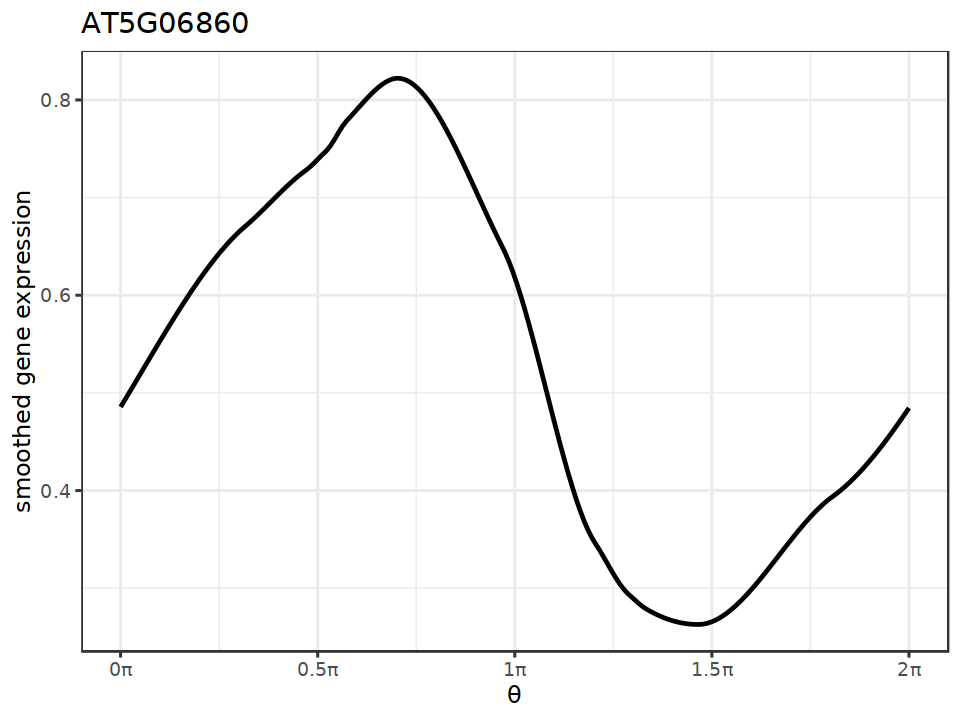

In [33]:
## G1 marker PGIP1-AT5G06860
grDevices::cairo_pdf("ThisStudy_G1_marker.pdf",width=8, height=6)
pltsg('AT5G06860')
dev.off()

pltsg('AT5G06860')

png 
  2

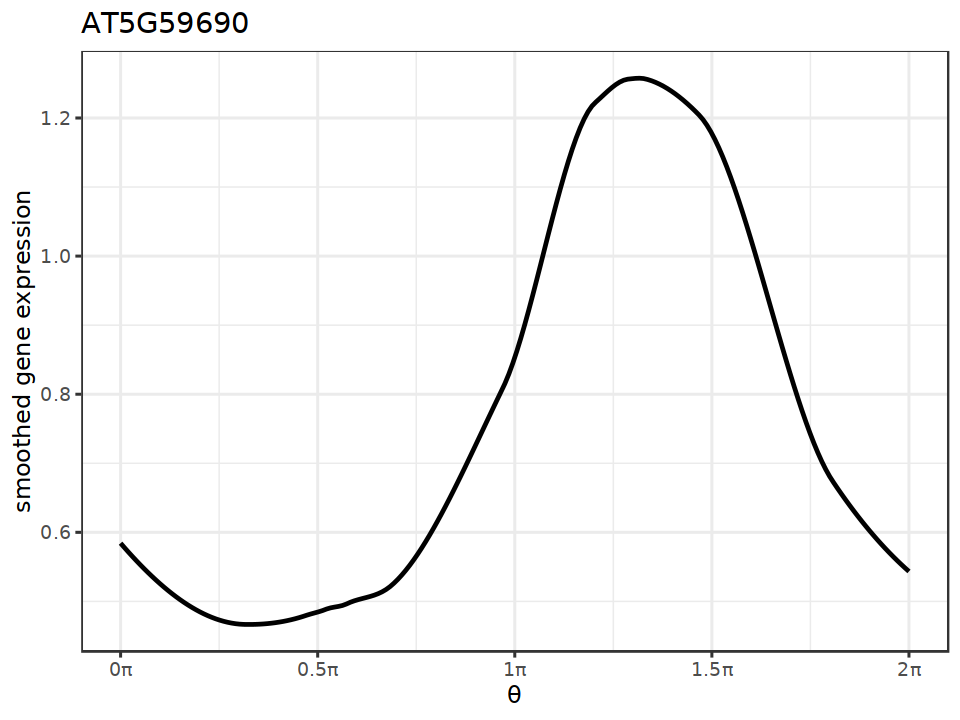

In [34]:
## S marker AT5G59690
grDevices::cairo_pdf("ThisStudy_S_marker.pdf",width=8, height=6)
pltsg('AT5G59690')
dev.off()

pltsg('AT5G59690')

png 
  2

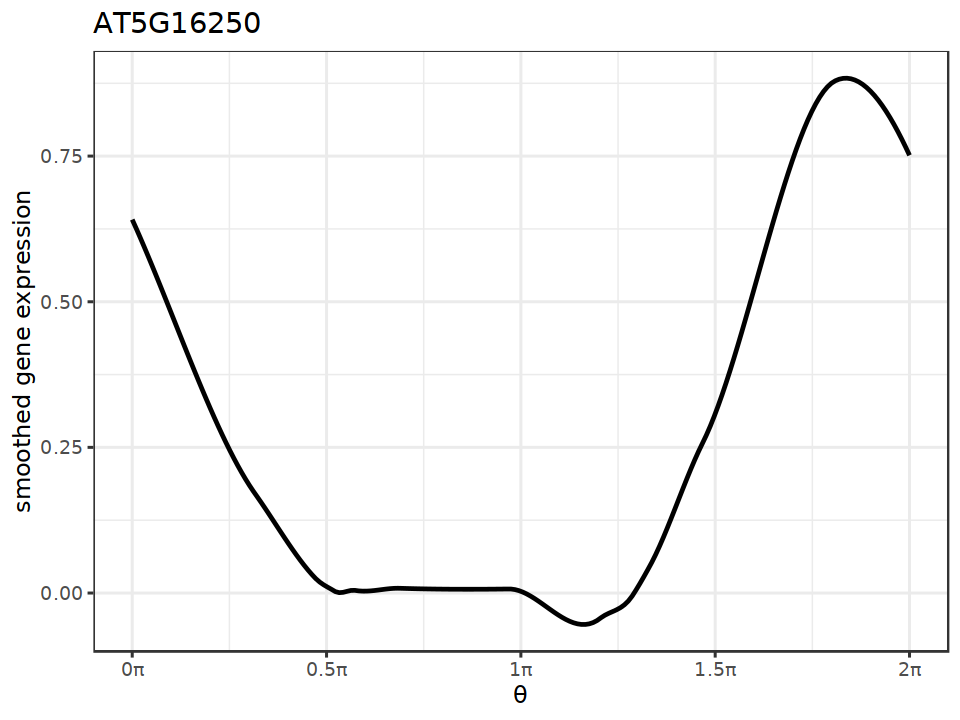

In [35]:
## G2M marker AT5G16250
grDevices::cairo_pdf("ThisStudy_G2M_marker.pdf",width=8, height=6)
pltsg('AT5G16250')
dev.off()

pltsg('AT5G16250')

## Genes of interest

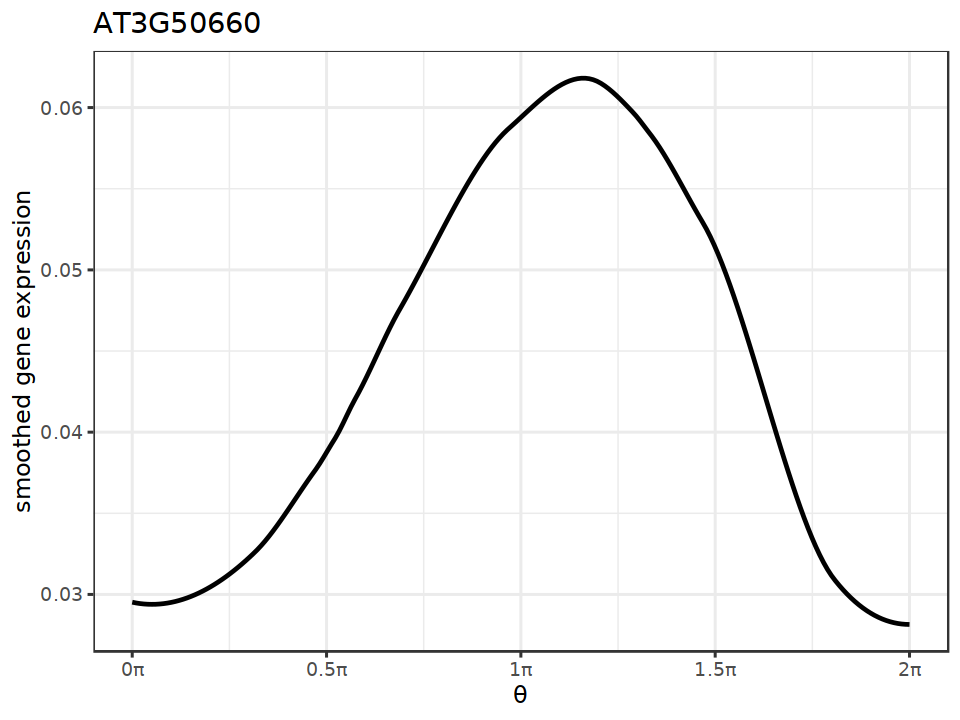

In [19]:
## DWF4 
pltsg('AT3G50660')

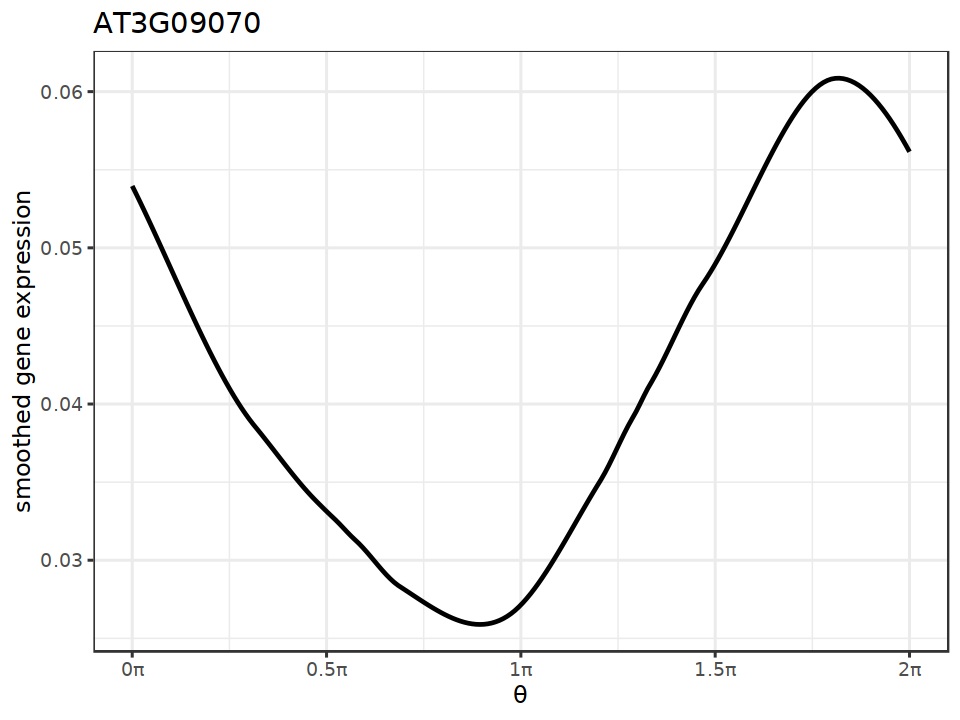

In [20]:
## OPS 
pltsg('AT3G09070')

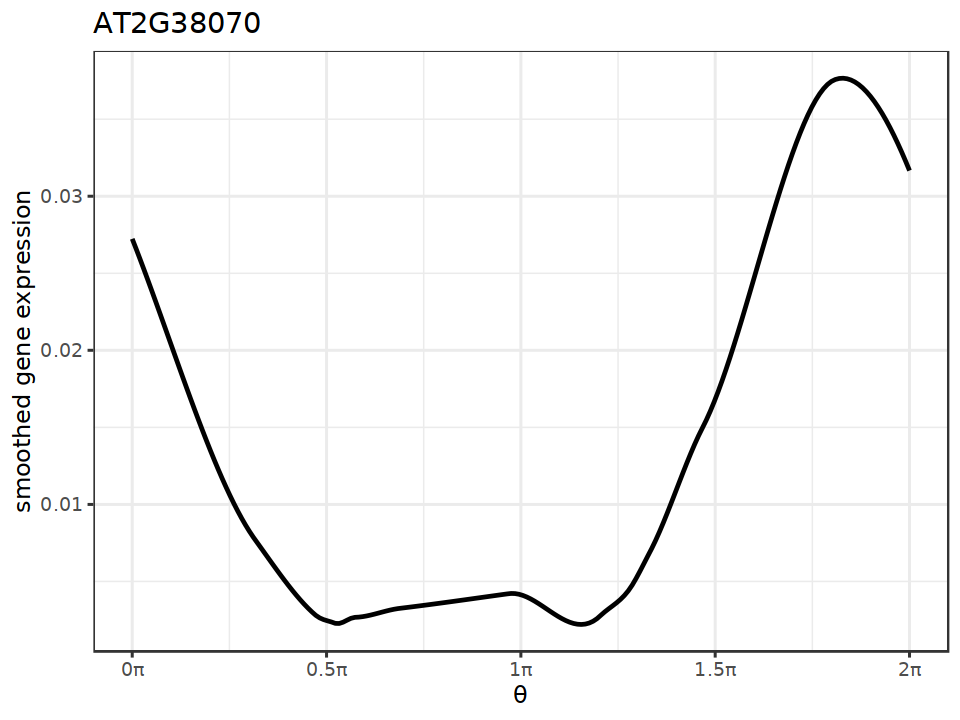

In [21]:
## OPL2 
pltsg('AT2G38070')

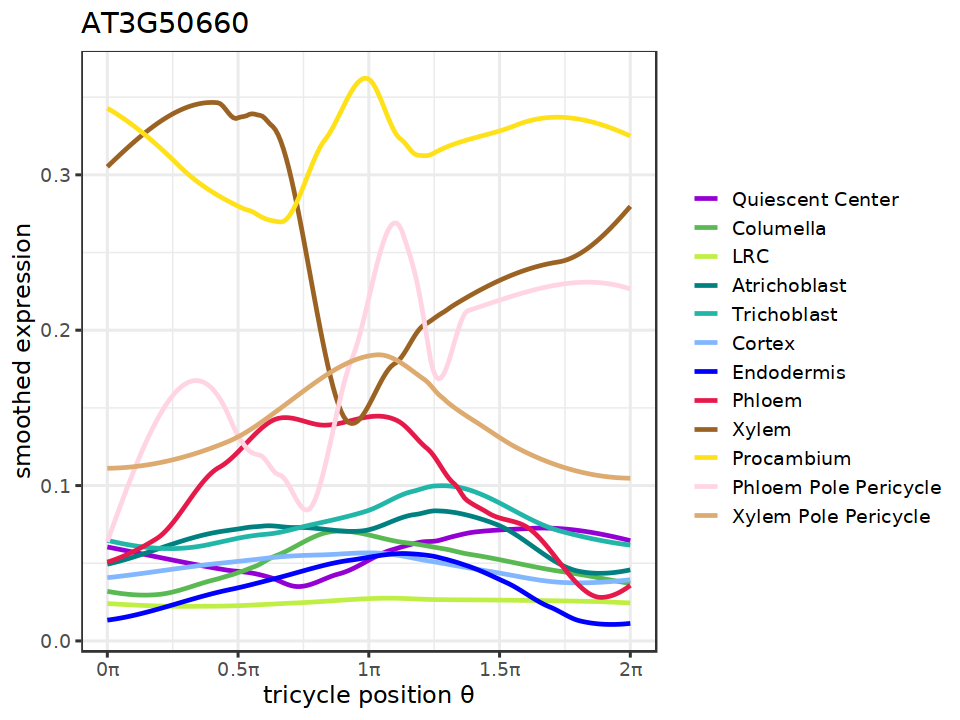

In [25]:
## DWF4 
pltctsg('AT3G50660')

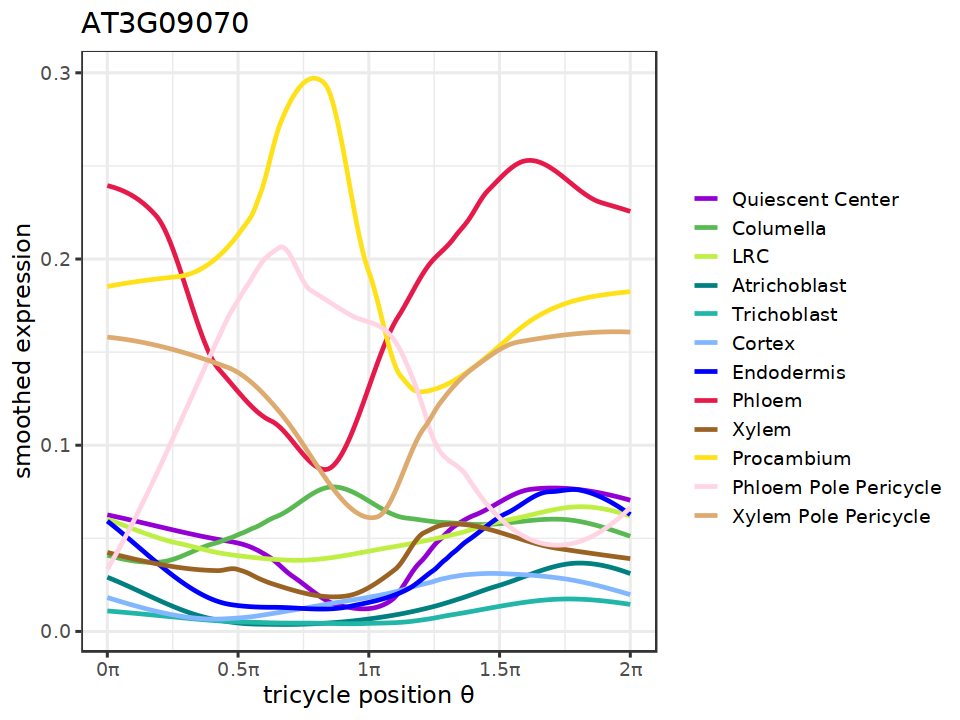

In [26]:
## OPS 
pltctsg('AT3G09070')

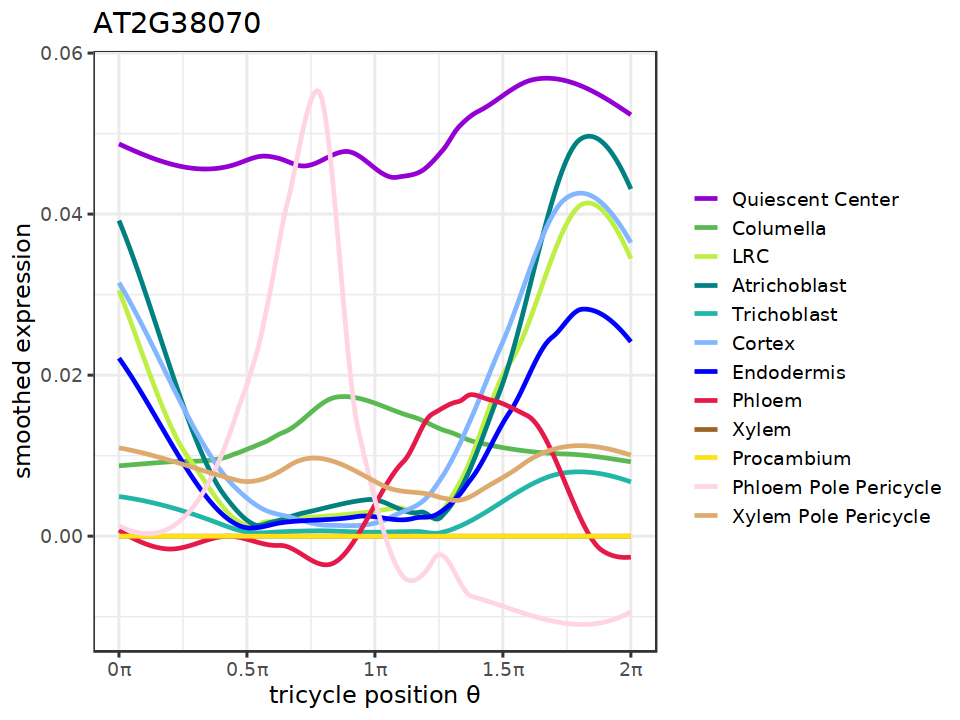

In [27]:
## OPL2 
pltctsg('AT2G38070')

## Load Core CC genes

In [16]:
core <- read.csv('./tradeseq/Core_CC_Genes.csv')

In [17]:
## Remove genes that were not captured by scRNA-seq
core <- core[core$GeneID %in% rownames(rc.integrated@assays$SCT@data),]

In [18]:
## Load Auxin and Cytokinin gene list
AL <- read.csv("./tradeseq/Auxin_gene_list.csv")
AL <- AL[AL$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
CL <- read.csv("./tradeseq/Cytokinin_gene_list.csv")
CL <- CL[CL$GeneID %in% rownames(rc.integrated@assays$SCT@data),]

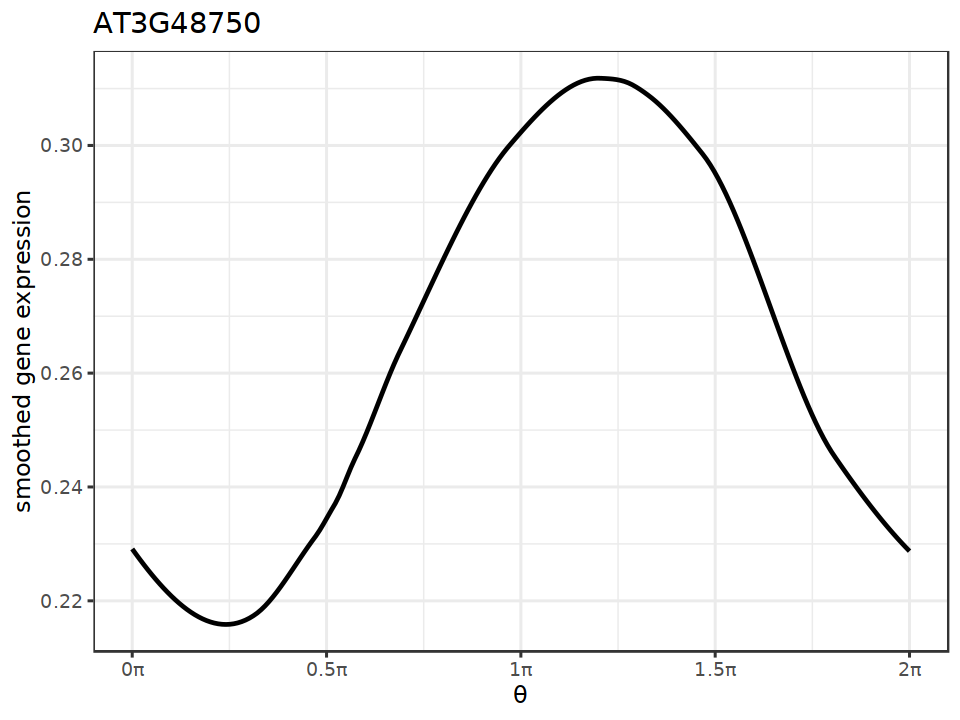

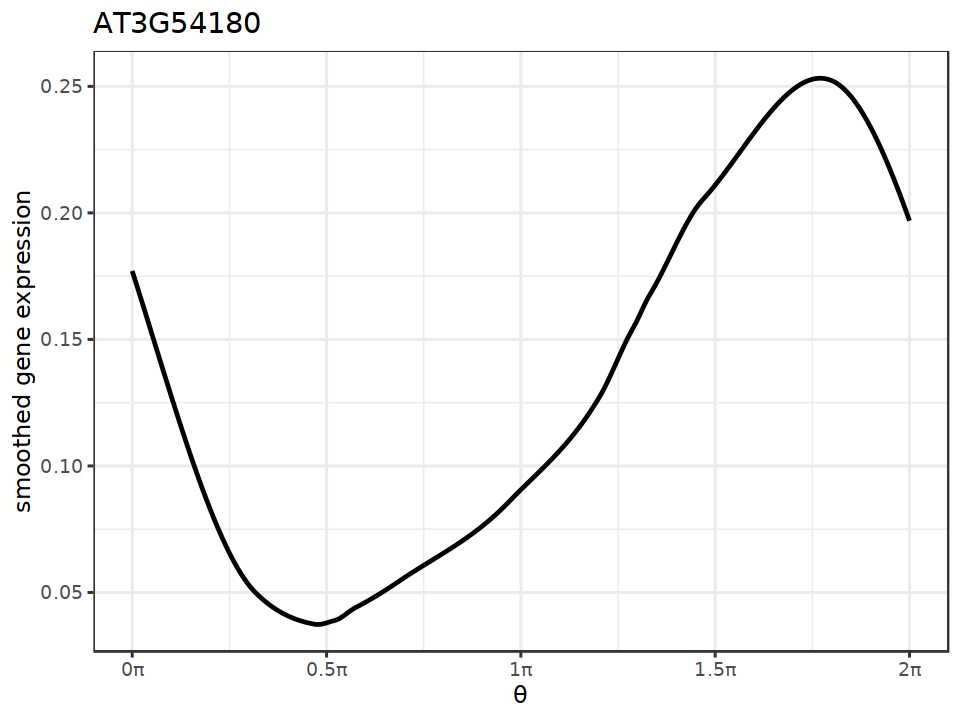

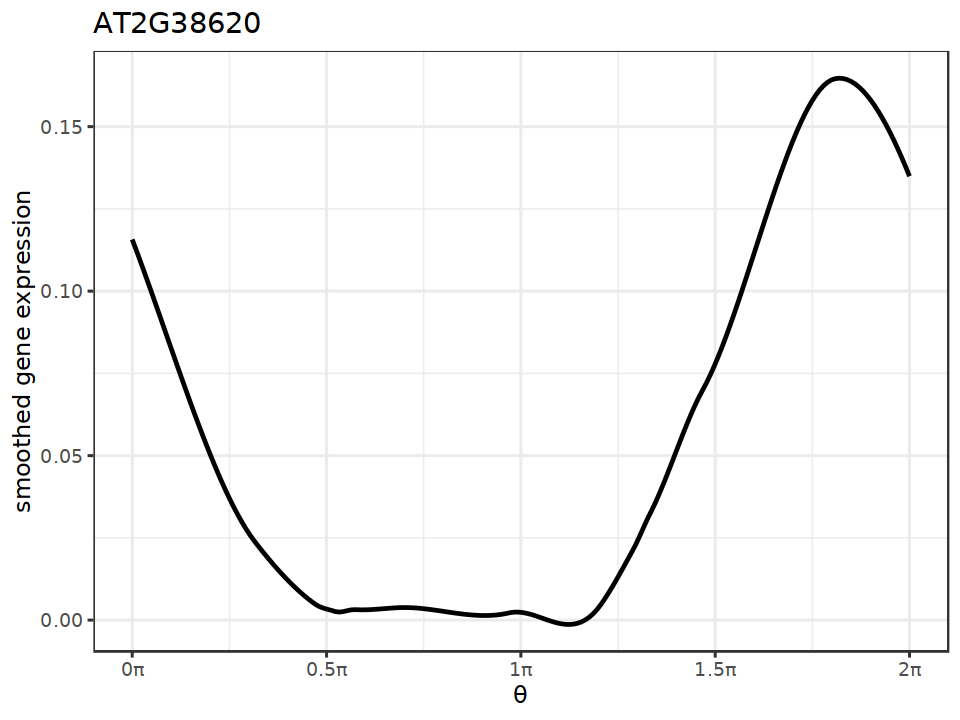

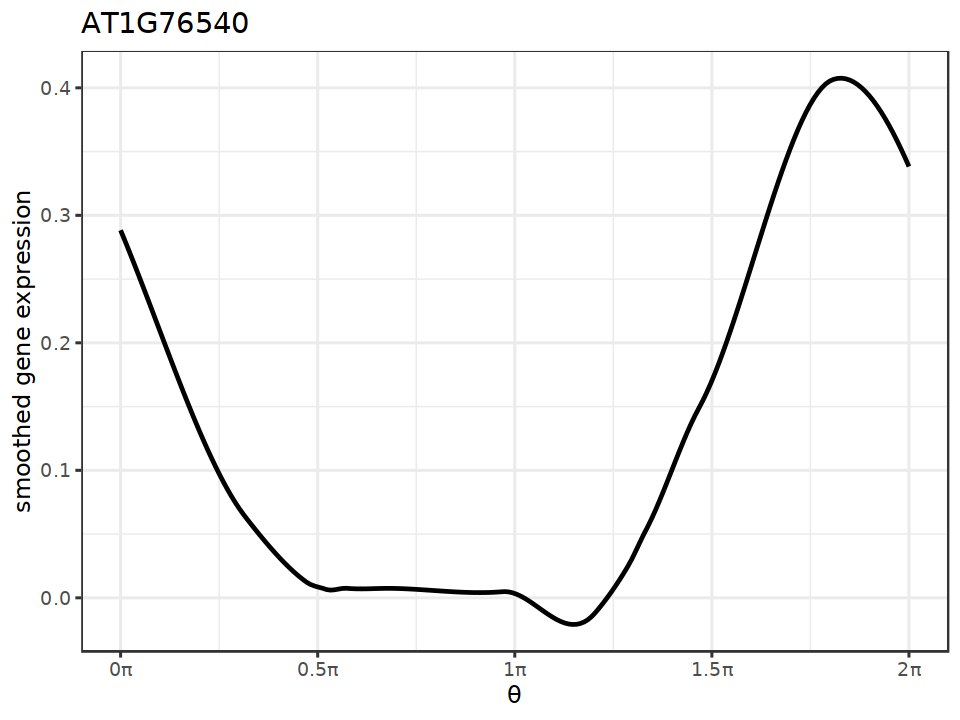

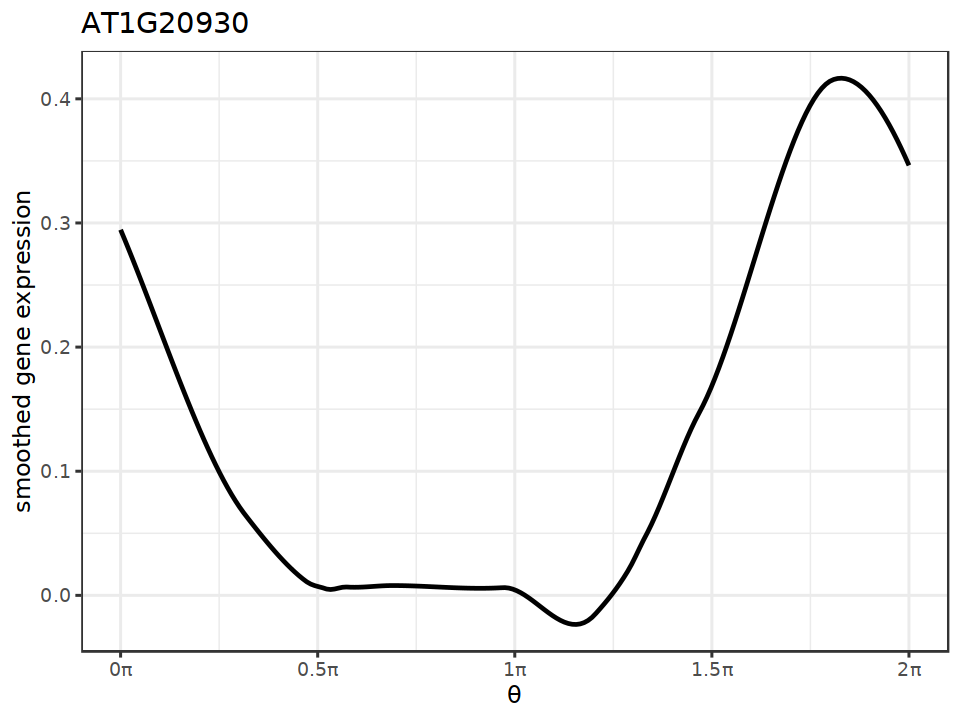

...

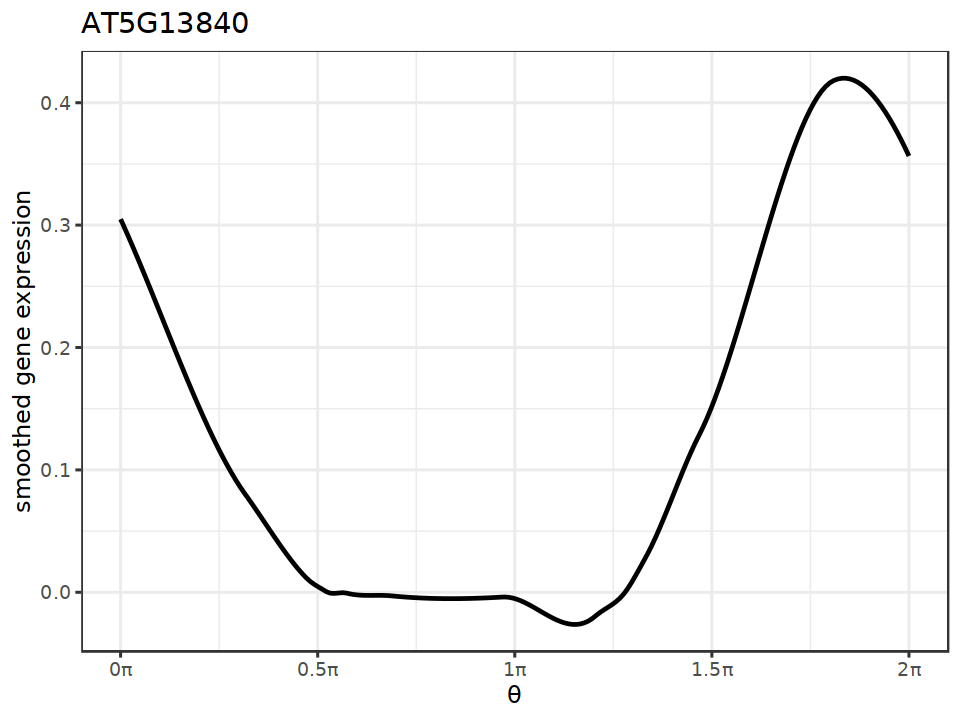

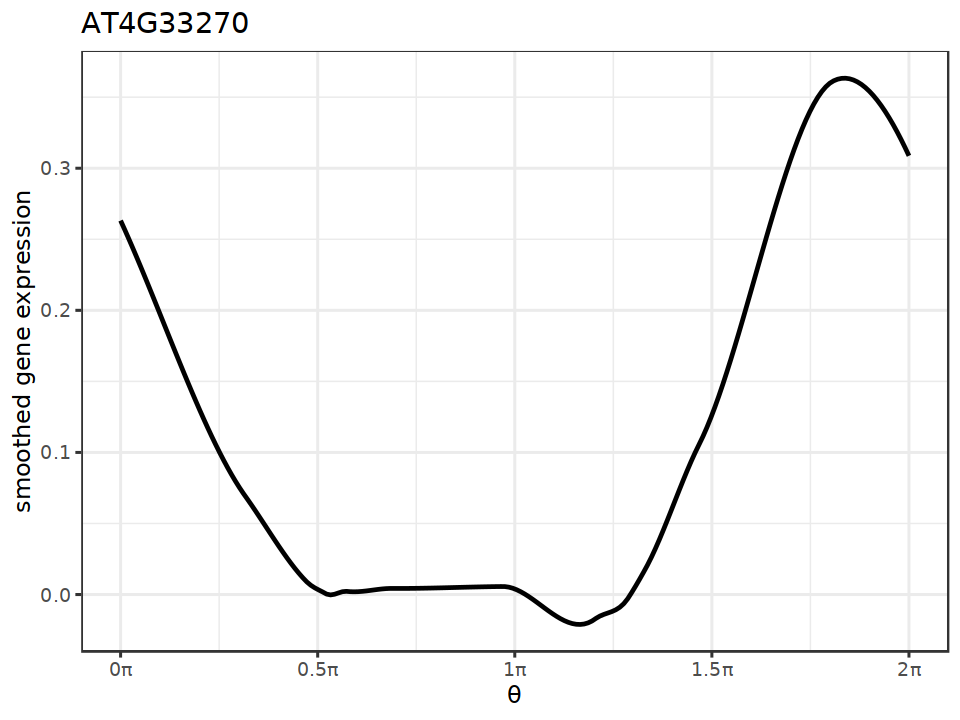

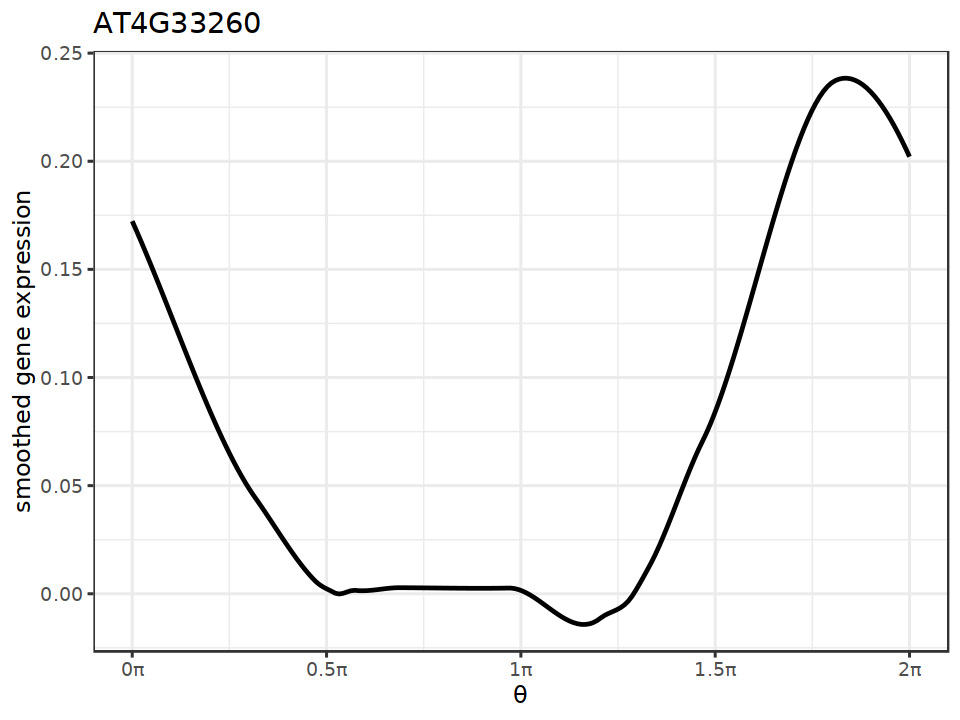

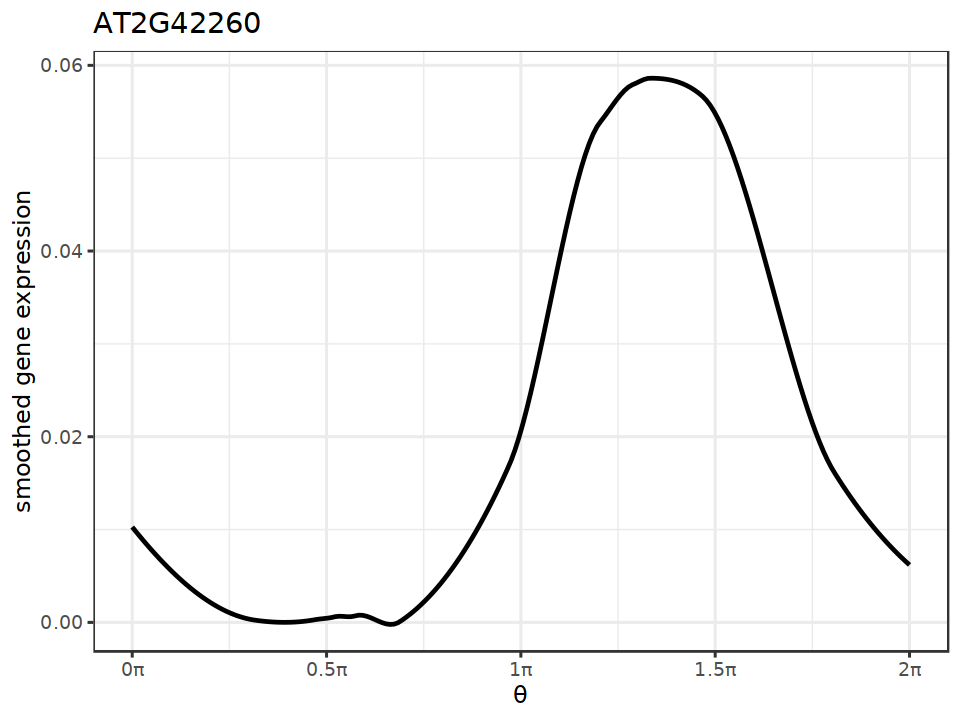

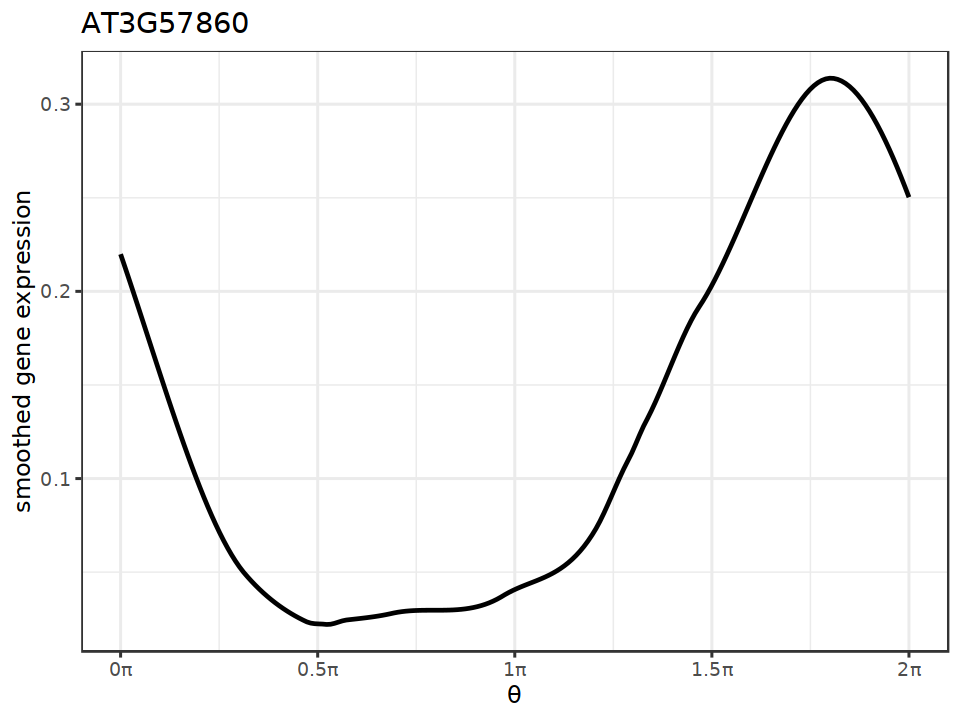

In [25]:
for (i in core$GeneID){
    pltsg(i)
}

In [18]:
summary(rc.integrated$tricyclePosition)

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
0.0001587 0.5355870 0.9693565 0.9651318 1.3160821 1.9997119 

In [99]:
## tricycle group 50
rc.integrated$tricycle_group <- rep("T0",ncol(rc.integrated))
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.0) & (rc.integrated$tricyclePosition <= 0.04)] <- "T1"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.04) & (rc.integrated$tricyclePosition <= 0.08)] <- "T2"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.08) & (rc.integrated$tricyclePosition <= 0.12)] <- "T3"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.12) & (rc.integrated$tricyclePosition <= 0.16)] <- "T4"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.16) & (rc.integrated$tricyclePosition <= 0.2)] <- "T5"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.2) & (rc.integrated$tricyclePosition <= 0.24)] <- "T6"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.24) & (rc.integrated$tricyclePosition <= 0.28)] <- "T7"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.28) & (rc.integrated$tricyclePosition <= 0.32)] <- "T8"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.32) & (rc.integrated$tricyclePosition <= 0.36)] <- "T9"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.36) & (rc.integrated$tricyclePosition <= 0.40)] <- "T10"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.40) & (rc.integrated$tricyclePosition <= 0.44)] <- "T11"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.44) & (rc.integrated$tricyclePosition <= 0.48)] <- "T12"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.48) & (rc.integrated$tricyclePosition <= 0.52)] <- "T13"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.52) & (rc.integrated$tricyclePosition <= 0.56)] <- "T14"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.56) & (rc.integrated$tricyclePosition <= 0.60)] <- "T15"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.60) & (rc.integrated$tricyclePosition <= 0.64)] <- "T16"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.64) & (rc.integrated$tricyclePosition <= 0.68)] <- "T17"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.68) & (rc.integrated$tricyclePosition <= 0.72)] <- "T18"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.72) & (rc.integrated$tricyclePosition <= 0.76)] <- "T19"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.76) & (rc.integrated$tricyclePosition <= 0.80)] <- "T20"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.80) & (rc.integrated$tricyclePosition <= 0.84)] <- "T21"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.84) & (rc.integrated$tricyclePosition <= 0.88)] <- "T22"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.88) & (rc.integrated$tricyclePosition <= 0.92)] <- "T23"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.92) & (rc.integrated$tricyclePosition <= 0.96)] <- "T24"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.96) & (rc.integrated$tricyclePosition <= 1.0)] <- "T25"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.0) & (rc.integrated$tricyclePosition <= 1.04)] <- "T26"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.04) & (rc.integrated$tricyclePosition <= 1.08)] <- "T27"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.08) & (rc.integrated$tricyclePosition <= 1.12)] <- "T28"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.12) & (rc.integrated$tricyclePosition <= 1.16)] <- "T29"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.16) & (rc.integrated$tricyclePosition <= 1.20)] <- "T30"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.20) & (rc.integrated$tricyclePosition <= 1.24)] <- "T31"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.24) & (rc.integrated$tricyclePosition <= 1.28)] <- "T32"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.28) & (rc.integrated$tricyclePosition <= 1.32)] <- "T33"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.32) & (rc.integrated$tricyclePosition <= 1.36)] <- "T34"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.36) & (rc.integrated$tricyclePosition <= 1.40)] <- "T35"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.40) & (rc.integrated$tricyclePosition <= 1.44)] <- "T36"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.44) & (rc.integrated$tricyclePosition <= 1.48)] <- "T37"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.48) & (rc.integrated$tricyclePosition <= 1.52)] <- "T38"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.52) & (rc.integrated$tricyclePosition <= 1.56)] <- "T39"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.56) & (rc.integrated$tricyclePosition <= 1.60)] <- "T40"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.60) & (rc.integrated$tricyclePosition <= 1.64)] <- "T41"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.64) & (rc.integrated$tricyclePosition <= 1.68)] <- "T42"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.68) & (rc.integrated$tricyclePosition <= 1.72)] <- "T43"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.72) & (rc.integrated$tricyclePosition <= 1.76)] <- "T44"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.76) & (rc.integrated$tricyclePosition <= 1.80)] <- "T45"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.80) & (rc.integrated$tricyclePosition <= 1.84)] <- "T46"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.84) & (rc.integrated$tricyclePosition <= 1.88)] <- "T47"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.88) & (rc.integrated$tricyclePosition <= 1.92)] <- "T48"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.92) & (rc.integrated$tricyclePosition <= 1.96)] <- "T49"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.96) & (rc.integrated$tricyclePosition <= 2.0)] <- "T50"

In [100]:
table(rc.integrated$tricycle_group)


  T1  T10  T11  T12  T13  T14  T15  T16  T17  T18  T19   T2  T20  T21  T22  T23 
 146  794 1707 2674 4156 3950 2668 1769 1268 1036  824  148  733  632  578  586 
 T24  T25  T26  T27  T28  T29   T3  T30  T31  T32  T33  T34  T35  T36  T37  T38 
 610  649  630  705  766  943  156 1217 1688 2620 4512 3113 1624  917  622  443 
 T39   T4  T40  T41  T42  T43  T44  T45  T46  T47  T48  T49   T5  T50   T6   T7 
 407  183  417  426  438  555  716 1130 1013  357  175  145  194  153  232  288 
  T8   T9 
 330  428 

In [102]:
rc.integrated

An object of class Seurat 
74352 features across 52471 samples within 3 assays 
Active assay: integrated (17479 features, 17479 variable features)
 2 other assays present: RNA, SCT
 3 dimensional reductions calculated: pca, umap, umap_2D

In [103]:
rc.re <- CreateSeuratObject(rc.integrated@assays$SCT@data)
rc.re$tricycle_group <- rc.integrated$tricycle_group
Idents(rc.re) <- rc.re$tricycle_group
Clust_Markers <- FindAllMarkers(rc.re, only.pos = TRUE)

Calculating cluster T12

Calculating cluster T13

Calculating cluster T19

Calculating cluster T14

Calculating cluster T21

Calculating cluster T44

Calculating cluster T26

Calculating cluster T40

Calculating cluster T47

Calculating cluster T8

Calculating cluster T43

Calculating cluster T18

Calculating cluster T17

Calculating cluster T32

Calculating cluster T16

Calculating cluster T25

Calculating cluster T11

Calculating cluster T29

Calculating cluster T15

Calculating cluster T28

Calculating cluster T45

Calculating cluster T31

Calculating cluster T33

Calculating cluster T41

Calculating cluster T23

Calculating cluster T48

Calculating cluster T38

Calculating cluster T30

Calculating cluster T10

Calculating cluster T46

Calculating cluster T24

Calculating cluster T34

Calculating cluster T36

Calculating cluster T27

Calculating cluster T22

Calculating cluster T39

Calculating cluster T35

Calculating cluster T6

Calculating cluster T20

Calculating cluster T5

Cal

In [104]:
write.csv(Clust_Markers, "./tradeseq/Proliferation_Domain_tricycle_group_50_DE_raw.csv")

In [105]:
Clust_Markers <- Clust_Markers %>% filter(p_val_adj <0.01) %>% arrange(p_val_adj)

In [106]:
write.csv(Clust_Markers, "./tradeseq/Proliferation_Domain_tricycle_group_50_DE.csv")

In [107]:
#Clust_Markers <- read.csv("./tradeseq/Proliferation_Domain_tricycle_group_50_DE.csv")
Clust_Markers <- read.csv("./tradeseq/Proliferation_Domain_tricycle_group_50_DE_raw.csv")

In [108]:
Clust_Markers$pct_diff <- Clust_Markers$pct.1-Clust_Markers$pct.2
Clust_Markers$pct_1_rank <- rank(Clust_Markers$pct.1)
Clust_Markers$pct_diff_rank <- rank(Clust_Markers$pct_diff)
Clust_Markers$avg_log2FC_rank <- rank(Clust_Markers$avg_log2FC)
Clust_Markers$score <- Clust_Markers$pct_diff_rank + Clust_Markers$avg_log2FC_rank 
Clust_Markers <- Clust_Markers %>% arrange(desc(score))

In [109]:
t1 <- Clust_Markers$gene[Clust_Markers$cluster=="T1"]
t2 <- Clust_Markers$gene[Clust_Markers$cluster=="T2"]
t3 <- Clust_Markers$gene[Clust_Markers$cluster=="T3"]
t4 <- Clust_Markers$gene[Clust_Markers$cluster=="T4"]
t5 <- Clust_Markers$gene[Clust_Markers$cluster=="T5"]
t6 <- Clust_Markers$gene[Clust_Markers$cluster=="T6"]
t7 <- Clust_Markers$gene[Clust_Markers$cluster=="T7"]
t8 <- Clust_Markers$gene[Clust_Markers$cluster=="T8"]
t9 <- Clust_Markers$gene[Clust_Markers$cluster=="T9"]
t10 <- Clust_Markers$gene[Clust_Markers$cluster=="T10"]
t11 <- Clust_Markers$gene[Clust_Markers$cluster=="T11"]
t12 <- Clust_Markers$gene[Clust_Markers$cluster=="T12"]
t13 <- Clust_Markers$gene[Clust_Markers$cluster=="T13"]
t14 <- Clust_Markers$gene[Clust_Markers$cluster=="T14"]
t15 <- Clust_Markers$gene[Clust_Markers$cluster=="T15"]
t16 <- Clust_Markers$gene[Clust_Markers$cluster=="T16"]
t17 <- Clust_Markers$gene[Clust_Markers$cluster=="T17"]
t18 <- Clust_Markers$gene[Clust_Markers$cluster=="T18"]
t19 <- Clust_Markers$gene[Clust_Markers$cluster=="T19"]
t20 <- Clust_Markers$gene[Clust_Markers$cluster=="T20"]
t21 <- Clust_Markers$gene[Clust_Markers$cluster=="T21"]
t22 <- Clust_Markers$gene[Clust_Markers$cluster=="T22"]
t23 <- Clust_Markers$gene[Clust_Markers$cluster=="T23"]
t24 <- Clust_Markers$gene[Clust_Markers$cluster=="T24"]
t25 <- Clust_Markers$gene[Clust_Markers$cluster=="T25"]
t26 <- Clust_Markers$gene[Clust_Markers$cluster=="T26"]
t27 <- Clust_Markers$gene[Clust_Markers$cluster=="T27"]
t28 <- Clust_Markers$gene[Clust_Markers$cluster=="T28"]
t29 <- Clust_Markers$gene[Clust_Markers$cluster=="T29"]
t30 <- Clust_Markers$gene[Clust_Markers$cluster=="T30"]
t31 <- Clust_Markers$gene[Clust_Markers$cluster=="T31"]
t32 <- Clust_Markers$gene[Clust_Markers$cluster=="T32"]
t33 <- Clust_Markers$gene[Clust_Markers$cluster=="T33"]
t34 <- Clust_Markers$gene[Clust_Markers$cluster=="T34"]
t35 <- Clust_Markers$gene[Clust_Markers$cluster=="T35"]
t36 <- Clust_Markers$gene[Clust_Markers$cluster=="T36"]
t37 <- Clust_Markers$gene[Clust_Markers$cluster=="T37"]
t38 <- Clust_Markers$gene[Clust_Markers$cluster=="T38"]
t39 <- Clust_Markers$gene[Clust_Markers$cluster=="T39"]
t40 <- Clust_Markers$gene[Clust_Markers$cluster=="T40"]
t41 <- Clust_Markers$gene[Clust_Markers$cluster=="T41"]
t42 <- Clust_Markers$gene[Clust_Markers$cluster=="T42"]
t43 <- Clust_Markers$gene[Clust_Markers$cluster=="T43"]
t44 <- Clust_Markers$gene[Clust_Markers$cluster=="T44"]
t45 <- Clust_Markers$gene[Clust_Markers$cluster=="T45"]
t46 <- Clust_Markers$gene[Clust_Markers$cluster=="T46"]
t47 <- Clust_Markers$gene[Clust_Markers$cluster=="T47"]
t48 <- Clust_Markers$gene[Clust_Markers$cluster=="T48"]
t49 <- Clust_Markers$gene[Clust_Markers$cluster=="T49"]
t50 <- Clust_Markers$gene[Clust_Markers$cluster=="T50"]

In [110]:
genes_to_plt <- c(t1,t2,t3,t4,t5,t6,t7,t8,t9,t10,t11,t12,t13,t14,t15,t16,t17,t18,t19,t20,t21,t22,t23,t24,t25,t26,t27,t28,t29,t30,t31,t32,t33,t34,t35,t36,t37,t38,t39,t40,t41,t42,t43,t44,t45,t46,t47,t48,t49,t50)
genes_to_plt <- unique(genes_to_plt)
length(genes_to_plt)

[1] 2950

In [111]:
## plot heatmap
# pseudobulk of each stage of 

  afm <- as.matrix(rc.integrated@assays$SCT@data)
  pooled <- matrix(nrow=nrow(afm), ncol = 0)

  for (i in c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10",
             "T11", "T12", "T13", "T14", "T15", "T16", "T17", "T18", "T19", "T20",
             "T21", "T22", "T23", "T24", "T25", "T26", "T27", "T28", "T29", "T30",
             "T31", "T32", "T33", "T34", "T35", "T36", "T37", "T38", "T39", "T40",
             "T41", "T42", "T43", "T44", "T45", "T46", "T47", "T48", "T49", "T50")) {
    m <- afm[,which(rc.integrated@meta.data$tricycle_group==i)]
    pooled <- cbind(pooled, rowSums(m)/ncol(m))
  }

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 10.2 GiB”


In [112]:
colnames(pooled) <- c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10",
             "T11", "T12", "T13", "T14", "T15", "T16", "T17", "T18", "T19", "T20",
             "T21", "T22", "T23", "T24", "T25", "T26", "T27", "T28", "T29", "T30",
             "T31", "T32", "T33", "T34", "T35", "T36", "T37", "T38", "T39", "T40",
             "T41", "T42", "T43", "T44", "T45", "T46", "T47", "T48", "T49", "T50")

sub_m <- pooled[genes_to_plt, c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10",
             "T11", "T12", "T13", "T14", "T15", "T16", "T17", "T18", "T19", "T20",
             "T21", "T22", "T23", "T24", "T25", "T26", "T27", "T28", "T29", "T30",
             "T31", "T32", "T33", "T34", "T35", "T36", "T37", "T38", "T39", "T40",
             "T41", "T42", "T43", "T44", "T45", "T46", "T47", "T48", "T49", "T50")]

# quantile normalize

mat = sub_m
mat2 = t(apply(mat, 1, function(x) {
    q10 = quantile(x, 0.1)
    q90 = quantile(x, 0.9)
    x[x < q10] = q10
    x[x > q90] = q90
    scale(x)
}))
colnames(mat2) = colnames(mat)

# side annotation with color to match umap

sa = rowAnnotation(foo = anno_block(gp = gpar(fill = "#f7e7b4"),
        labels = c("Proliferation Domain + Proximal Root Cap"), 
        labels_gp = gpar(col = "black", fontsize = 18)))
        
feature_names <- read_tsv("./Source_files/features.tsv.gz", col_names = c("gene", "Name", "Type")) %>%
  select(-Type) %>%
  distinct()

feature_names$Name <- gsub("-",";",feature_names$Name)

Rows: 32833 Columns: 3
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): gene, Name, Type

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [113]:
feature_names$Name[feature_names$gene %in% intersect(core$GeneID, genes_to_plt)]

[1] "AT1G03740" "SMR8"      "CYCA2;3"   "CYCB3;1"   "CYCB2;3"   "CDKB2;2"  
 [7] "CYCA1;1"   "CYCA3;2"   "CYCB2;4"   "CDKB2;1"   "SKP2B"     "CYCA2;4"  
[13] "CYCB1;2"   "MYB3R4"    "FZR3"      "CYCA3;1"   "KRP3"      "CDKG1"    
[19] "CYCD3;2"   "E2FF"      "CYCB1;3"   "CDKB1;1"   "FBL17"     "GIG1"     
[25] "CYCB2;1"   "CYCB1;4"   "CDKB1;2"   "CDC20;2"   "CDC20;1"   "CYCB2;2"  
[31] "CYCB1;1"

In [114]:
# genes to mark on side of heatmap

(mat_for_mark <- data.frame(mat2) %>% 
 rownames_to_column("gene") %>%
 left_join(feature_names) %>% 
 mutate(index=dplyr::row_number()) %>%
select(Name, index) %>%
filter(Name %in% feature_names$Name[feature_names$gene %in% intersect(core$GeneID, genes_to_plt)]))

Joining with `by = join_by(gene)`


Name,index
<chr>,<int>
CDKG1,355
SKP2B,867
AT1G03740,1243
SMR8,1248
CYCA3;2,1525
FBL17,1536
CYCA3;1,1691
KRP3,1886
GIG1,2495


`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.



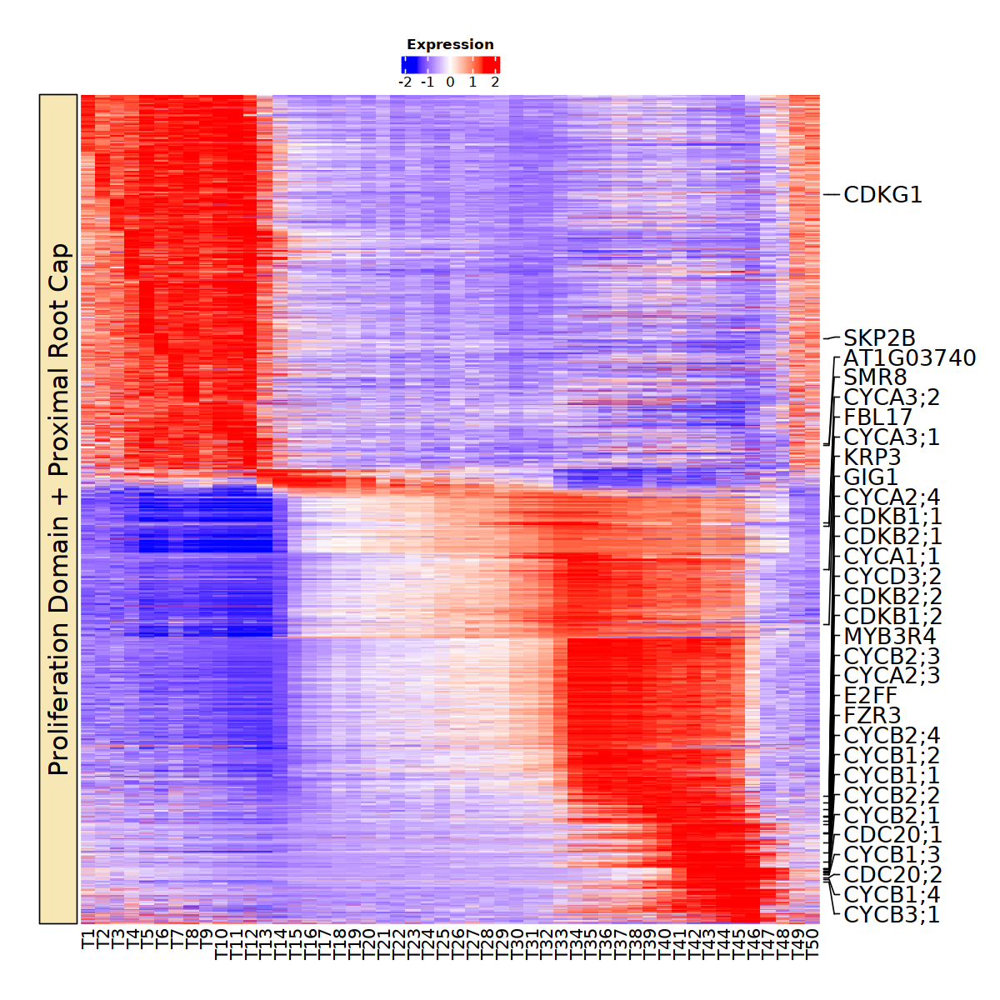

In [115]:
## Unique markers for each group
mark_anno = rowAnnotation(foo = anno_mark(at = mat_for_mark$index, labels = mat_for_mark$Name, labels_gp = gpar(col = "black", fontsize = 16)))

options(repr.plot.width=10, repr.plot.height=10)
hm <- Heatmap(mat2, 
        col = colorRamp2(c(-1.5, 0, 1.5), 
                         c('blue','white','red')), 
                show_column_names = T,
                cluster_columns = F,
                cluster_rows=F,
                show_row_names = F, 
                   left_annotation=sa,
                   right_annotation=mark_anno,
               heatmap_legend_param = list(title_position="topcenter", title = "Expression", direction="horizontal"))

draw(hm, padding = unit(c(10, 10, 10, 10), "mm"), heatmap_legend_side = "top")

In [116]:
## core genes
genes_to_plt <- c(t1,t2,t3,t4,t5,t6,t7,t8,t9,t10,t11,t12,t13,t14,t15,t16,t17,t18,t19,t20,t21,t22,t23,t24,t25,t26,t27,t28,t29,t30,t31,t32,t33,t34,t35,t36,t37,t38,t39,t40,t41,t42,t43,t44,t45,t46,t47,t48,t49,t50)
genes_to_plt <- c(genes_to_plt,core$GeneID)
genes_to_plt <- unique(genes_to_plt)

length(genes_to_plt)

[1] 3038

In [117]:
colnames(pooled) <- c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10",
             "T11", "T12", "T13", "T14", "T15", "T16", "T17", "T18", "T19", "T20",
             "T21", "T22", "T23", "T24", "T25", "T26", "T27", "T28", "T29", "T30",
             "T31", "T32", "T33", "T34", "T35", "T36", "T37", "T38", "T39", "T40",
             "T41", "T42", "T43", "T44", "T45", "T46", "T47", "T48", "T49", "T50")

sub_m <- pooled[genes_to_plt, c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10",
             "T11", "T12", "T13", "T14", "T15", "T16", "T17", "T18", "T19", "T20",
             "T21", "T22", "T23", "T24", "T25", "T26", "T27", "T28", "T29", "T30",
             "T31", "T32", "T33", "T34", "T35", "T36", "T37", "T38", "T39", "T40",
             "T41", "T42", "T43", "T44", "T45", "T46", "T47", "T48", "T49", "T50")]

# quantile normalize

mat = sub_m
mat2 = t(apply(mat, 1, function(x) {
    q10 = quantile(x, 0.1)
    q90 = quantile(x, 0.9)
    x[x < q10] = q10
    x[x > q90] = q90
    scale(x)
}))
colnames(mat2) = colnames(mat)

# side annotation with color to match umap

sa = rowAnnotation(foo = anno_block(gp = gpar(fill = "#f7e7b4"),
        labels = c("Proliferation Domain + Proximal Root Cap"), 
        labels_gp = gpar(col = "black", fontsize = 18)))
        
feature_names <- read_tsv("./Source_files/features.tsv.gz", col_names = c("gene", "Name", "Type")) %>%
  select(-Type) %>%
  distinct()

feature_names$Name <- gsub("-",";",feature_names$Name)

Rows: 32833 Columns: 3
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): gene, Name, Type

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [118]:
feature_names$Name[feature_names$gene %in% intersect(core$GeneID, genes_to_plt)]

[1] "WEE1"      "AT1G03740" "SMR5"      "SMR2"      "AT1G09600" "SMR8"     
  [7] "SDS"       "CYCA2;3"   "CYCB3;1"   "CDKD;3"    "IBS1"      "CYCB2;5"  
 [13] "CYCB2;3"   "CDKB2;2"   "SKP2A"     "CYCT1;3"   "AT1G33770" "CYCB1;5"  
 [19] "CYCA1;1"   "CYCA3;2"   "CYCA3;4"   "E2FC"      "KRP7"      "SMR9"     
 [25] "AT1G53050" "AT1G54610" "AT1G57700" "CDKD;2"    "AT1G67580" "CYCD1;1"  
 [31] "AT1G71530" "CDKD;1"    "AT1G74330" "CYCB2;4"   "CDKB2;1"   "SKP2B"    
 [37] "CYCA1;2"   "CYCA2;4"   "SMR4"      "MYB3R5"    "SMR3"      "DPA"      
 [43] "DPB"       "SIM"       "CYCB1;2"   "CYCU4;2"   "CDKC;1"    "CYCD4;2"  
 [49] "CYCA2;2"   "MYB3R4"    "FZR3"      "E2FD"      "E2FB"      "CYCA2;1"  
 [55] "CYCH;1"    "cdc2cAt"   "SMR6"      "CYCA3;1"   "AT5G44290" "AT5G45190"
 [61] "AT5G48630" "CYCC1;1"   "KRP3"      "AT5G50860" "CYCU4;3"   "CDKG1"    
 [67] "CDKE;1"    "CDKC;2"    "CYCD4;1"   "CYCD3;2"   "E2FF"      "AT3G05050"
 [73] "MYB3R;3"   "SMR1"      "CYCB1;3"   "RBR1"      "KRP6"      "KRP5"     
 [79] "SMR7"      "E2FE"      "CDKA;1"    "CYCD3;3"   "KRP2"      "CDKB1;1"  
 [85] "FBL17"     "GIG1"      "CYCU2;2"   "CYCU3;1"   "CYCJ18"    "CYCB2;1"  
 [91] "CYCD2;1"   "KRP1"      "CYCL1;1"   "CYCB1;4"   "SMR11"     "SMR10"    
 [97] "KRP4"      "E2F3"      "SMR12"     "CDKB1;2"   "PYM"       "CYCU4;1"  
[103] "CYCU2;1"   "MYB3R2"    "CYCD6;1"   "AT4G10010" "FZR1"      "CYCT1;2"  
[109] "CYCT1;4"   "FZR2"      "AT4G22940" "CDKF;1"    "PC;MYB1"   "CDC20;2"  
[115] "CDC20;1"   "CYCD3;1"   "CYCB2;2"   "CYCB1;1"   "CYCD5;1"

In [119]:
# genes to mark on side of heatmap

(mat_for_mark <- data.frame(mat2) %>% 
 rownames_to_column("gene") %>%
 left_join(feature_names) %>% 
 mutate(index=dplyr::row_number()) %>%
select(Name, index) %>%
filter(Name %in% feature_names$Name[feature_names$gene %in% intersect(core$GeneID, genes_to_plt)]))

Joining with `by = join_by(gene)`


Name,index
<chr>,<int>
CDKG1,355
SKP2B,867
AT1G03740,1243
SMR8,1248
KRP1,1393
CYCA3;2,1525
FBL17,1536
CYCA3;1,1691
KRP3,1886


`use_raster` is automatically set to TRUE for a matrix with more than
2000 rows. You can control `use_raster` argument by explicitly setting
TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.



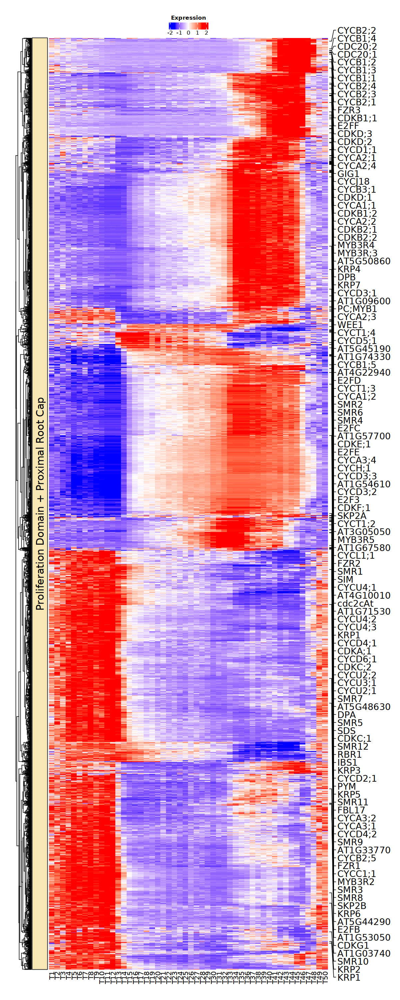

In [120]:
## Core CC genes
mark_anno = rowAnnotation(foo = anno_mark(at = mat_for_mark$index, labels = mat_for_mark$Name, labels_gp = gpar(col = "black", fontsize = 16)))

options(repr.plot.width=10, repr.plot.height=25)
hm <- Heatmap(mat2, 
        col = colorRamp2(c(-1.5, 0, 1.5), 
                         c('blue','white','red')), 
                show_column_names = T,
                cluster_columns = F,
                cluster_rows=T,
                show_row_names = F, 
                   left_annotation=sa,
                   right_annotation=mark_anno,
               heatmap_legend_param = list(title_position="topcenter", title = "Expression", direction="horizontal"))

draw(hm, padding = unit(c(10, 10, 10, 10), "mm"), heatmap_legend_side = "top")

## Auxin

In [22]:
Clust_Markers <- read.csv("./tradeseq/Proliferation_Domain_tricycle_group_50_DE_raw.csv")

In [37]:
genes_to_plt <- intersect(Clust_Markers$gene, AL$GeneID)

In [23]:
## tricycle group 50
rc.integrated$tricycle_group <- rep("T0",ncol(rc.integrated))
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.0) & (rc.integrated$tricyclePosition <= 0.04)] <- "T1"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.04) & (rc.integrated$tricyclePosition <= 0.08)] <- "T2"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.08) & (rc.integrated$tricyclePosition <= 0.12)] <- "T3"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.12) & (rc.integrated$tricyclePosition <= 0.16)] <- "T4"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.16) & (rc.integrated$tricyclePosition <= 0.2)] <- "T5"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.2) & (rc.integrated$tricyclePosition <= 0.24)] <- "T6"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.24) & (rc.integrated$tricyclePosition <= 0.28)] <- "T7"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.28) & (rc.integrated$tricyclePosition <= 0.32)] <- "T8"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.32) & (rc.integrated$tricyclePosition <= 0.36)] <- "T9"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.36) & (rc.integrated$tricyclePosition <= 0.40)] <- "T10"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.40) & (rc.integrated$tricyclePosition <= 0.44)] <- "T11"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.44) & (rc.integrated$tricyclePosition <= 0.48)] <- "T12"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.48) & (rc.integrated$tricyclePosition <= 0.52)] <- "T13"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.52) & (rc.integrated$tricyclePosition <= 0.56)] <- "T14"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.56) & (rc.integrated$tricyclePosition <= 0.60)] <- "T15"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.60) & (rc.integrated$tricyclePosition <= 0.64)] <- "T16"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.64) & (rc.integrated$tricyclePosition <= 0.68)] <- "T17"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.68) & (rc.integrated$tricyclePosition <= 0.72)] <- "T18"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.72) & (rc.integrated$tricyclePosition <= 0.76)] <- "T19"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.76) & (rc.integrated$tricyclePosition <= 0.80)] <- "T20"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.80) & (rc.integrated$tricyclePosition <= 0.84)] <- "T21"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.84) & (rc.integrated$tricyclePosition <= 0.88)] <- "T22"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.88) & (rc.integrated$tricyclePosition <= 0.92)] <- "T23"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.92) & (rc.integrated$tricyclePosition <= 0.96)] <- "T24"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.96) & (rc.integrated$tricyclePosition <= 1.0)] <- "T25"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.0) & (rc.integrated$tricyclePosition <= 1.04)] <- "T26"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.04) & (rc.integrated$tricyclePosition <= 1.08)] <- "T27"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.08) & (rc.integrated$tricyclePosition <= 1.12)] <- "T28"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.12) & (rc.integrated$tricyclePosition <= 1.16)] <- "T29"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.16) & (rc.integrated$tricyclePosition <= 1.20)] <- "T30"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.20) & (rc.integrated$tricyclePosition <= 1.24)] <- "T31"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.24) & (rc.integrated$tricyclePosition <= 1.28)] <- "T32"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.28) & (rc.integrated$tricyclePosition <= 1.32)] <- "T33"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.32) & (rc.integrated$tricyclePosition <= 1.36)] <- "T34"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.36) & (rc.integrated$tricyclePosition <= 1.40)] <- "T35"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.40) & (rc.integrated$tricyclePosition <= 1.44)] <- "T36"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.44) & (rc.integrated$tricyclePosition <= 1.48)] <- "T37"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.48) & (rc.integrated$tricyclePosition <= 1.52)] <- "T38"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.52) & (rc.integrated$tricyclePosition <= 1.56)] <- "T39"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.56) & (rc.integrated$tricyclePosition <= 1.60)] <- "T40"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.60) & (rc.integrated$tricyclePosition <= 1.64)] <- "T41"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.64) & (rc.integrated$tricyclePosition <= 1.68)] <- "T42"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.68) & (rc.integrated$tricyclePosition <= 1.72)] <- "T43"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.72) & (rc.integrated$tricyclePosition <= 1.76)] <- "T44"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.76) & (rc.integrated$tricyclePosition <= 1.80)] <- "T45"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.80) & (rc.integrated$tricyclePosition <= 1.84)] <- "T46"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.84) & (rc.integrated$tricyclePosition <= 1.88)] <- "T47"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.88) & (rc.integrated$tricyclePosition <= 1.92)] <- "T48"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.92) & (rc.integrated$tricyclePosition <= 1.96)] <- "T49"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.96) & (rc.integrated$tricyclePosition <= 2.0)] <- "T50"

In [24]:
## plot heatmap
# pseudobulk of each stage of 

  afm <- as.matrix(rc.integrated@assays$SCT@data)
  pooled <- matrix(nrow=nrow(afm), ncol = 0)

  for (i in c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10",
             "T11", "T12", "T13", "T14", "T15", "T16", "T17", "T18", "T19", "T20",
             "T21", "T22", "T23", "T24", "T25", "T26", "T27", "T28", "T29", "T30",
             "T31", "T32", "T33", "T34", "T35", "T36", "T37", "T38", "T39", "T40",
             "T41", "T42", "T43", "T44", "T45", "T46", "T47", "T48", "T49", "T50")) {
    m <- afm[,which(rc.integrated@meta.data$tricycle_group==i)]
    pooled <- cbind(pooled, rowSums(m)/ncol(m))
  }

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 10.2 GiB”


In [38]:
colnames(pooled) <- c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10",
             "T11", "T12", "T13", "T14", "T15", "T16", "T17", "T18", "T19", "T20",
             "T21", "T22", "T23", "T24", "T25", "T26", "T27", "T28", "T29", "T30",
             "T31", "T32", "T33", "T34", "T35", "T36", "T37", "T38", "T39", "T40",
             "T41", "T42", "T43", "T44", "T45", "T46", "T47", "T48", "T49", "T50")

sub_m <- pooled[genes_to_plt, c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10",
             "T11", "T12", "T13", "T14", "T15", "T16", "T17", "T18", "T19", "T20",
             "T21", "T22", "T23", "T24", "T25", "T26", "T27", "T28", "T29", "T30",
             "T31", "T32", "T33", "T34", "T35", "T36", "T37", "T38", "T39", "T40",
             "T41", "T42", "T43", "T44", "T45", "T46", "T47", "T48", "T49", "T50")]

# quantile normalize

mat = sub_m
mat2 = t(apply(mat, 1, function(x) {
    q10 = quantile(x, 0.1)
    q90 = quantile(x, 0.9)
    x[x < q10] = q10
    x[x > q90] = q90
    scale(x)
}))
colnames(mat2) = colnames(mat)

# side annotation with color to match umap

sa = rowAnnotation(foo = anno_block(gp = gpar(fill = "#f7e7b4"),
        labels = c("Proliferation Domain + Proximal Root Cap"), 
        labels_gp = gpar(col = "black", fontsize = 18)))
        
feature_names <- read_tsv("./Source_files/features.tsv.gz", col_names = c("gene", "Name", "Type")) %>%
  select(-Type) %>%
  distinct()

feature_names$Name <- gsub("-",";",feature_names$Name)

Rows: 32833 Columns: 3
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): gene, Name, Type

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [39]:
# genes to mark on side of heatmap

(mat_for_mark <- data.frame(mat2) %>% 
 rownames_to_column("gene") %>%
 left_join(feature_names) %>% 
 mutate(index=dplyr::row_number()) %>%
select(Name, index) %>%
filter(Name %in% feature_names$Name[feature_names$gene %in% intersect(AL$GeneID, genes_to_plt)]))

Joining with `by = join_by(gene)`


Name,index
<chr>,<int>
IAA17,1
IAA7,2
ILL6,3
IAA16,4
ILR1,5
YUC8,6
AT5G53590,7
ILL4,8
ASA1,9


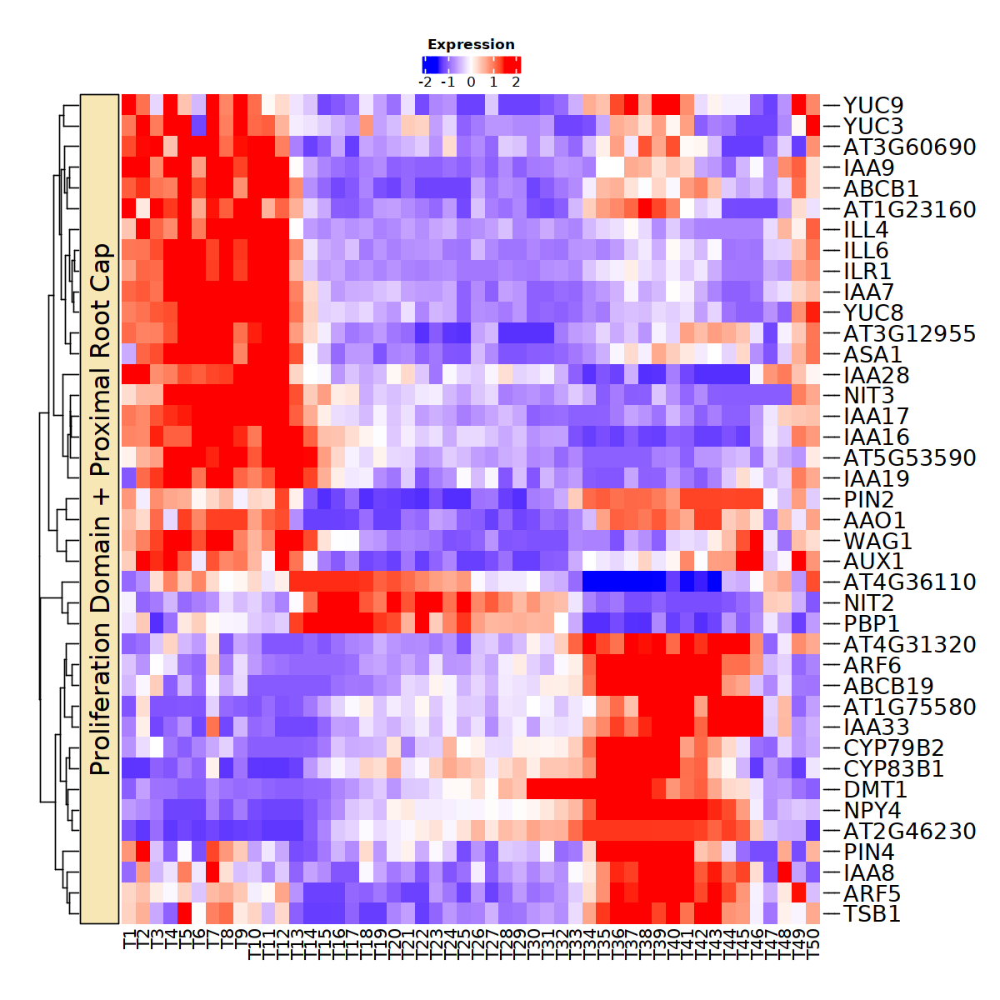

In [26]:
## Auxin genes
mark_anno = rowAnnotation(foo = anno_mark(at = mat_for_mark$index, labels = mat_for_mark$Name, labels_gp = gpar(col = "black", fontsize = 16)))

options(repr.plot.width=10, repr.plot.height=10)
hm <- Heatmap(mat2, 
        col = colorRamp2(c(-1.5, 0, 1.5), 
                         c('blue','white','red')), 
                show_column_names = T,
                cluster_columns = F,
                cluster_rows=T,
                show_row_names = F, 
                   left_annotation=sa,
                   right_annotation=mark_anno,
               heatmap_legend_param = list(title_position="topcenter", title = "Expression", direction="horizontal"))

draw(hm, padding = unit(c(10, 10, 10, 10), "mm"), heatmap_legend_side = "top")

In [52]:
AL$cell_cycle_association <- rep("No",nrow(AL))
AL$cell_cycle_association[AL$GeneID %in% genes_to_plt]="Yes"

In [55]:
head(AL) 

,GeneID,GeneName,Functions,Pathways,cell_cycle_association
,<chr>,<chr>,<chr>,<chr>,<chr>
1,AT5G05730,WEI2/ASA1 (ANTHRANILATE SYNTHASE ALPHA SUBUNIT 1),Auxin metabolism,Tryptophan pathway,Yes
2,AT2G29690,ATHANSYNAB__ASA2 (ANTHRANILATE SYNTHASE 2); anthranilate synthase,Auxin metabolism,Tryptophan pathway,No
3,AT1G25220,WEI7/ASB1 (ANTHRANILATE SYNTHASE BETA SUBUNIT 1),Auxin metabolism,Tryptophan pathway,No
4,AT5G17990,TRP1 (tryptophan biosynthesis 1),Auxin metabolism,Tryptophan pathway,No
5,AT5G05590,PAI2 (PHOSPHORIBOSYLANTHRANILATE ISOMERASE 2),Auxin metabolism,Tryptophan pathway,No
6,AT1G29410,PAI3 (phosphoribosylanthranilate isomerase 3); phosphoribosylanthranilate isomerase,Auxin metabolism,Tryptophan pathway,No


In [56]:
write.csv(AL, "./tradeseq/Auxin_genes_cell_cycle.csv")

### Auxin responsive genes

In [36]:
AR <- read.csv("./tradeseq/Auxin_responsive_genes.csv")
AR <- AR[AR$GeneID %in% rownames(rc.integrated@assays$SCT@data),]

In [37]:
AR_up <- AR %>% filter(Regulation == "Up")
AR_up <- AR_up$GeneID
AR_down <- AR %>% filter(Regulation == "Down")
AR_down <- AR_down$GeneID

In [136]:
genes_to_plt <- intersect(Clust_Markers$gene, AR_up)

In [137]:
colnames(pooled) <- c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10",
             "T11", "T12", "T13", "T14", "T15", "T16", "T17", "T18", "T19", "T20",
             "T21", "T22", "T23", "T24", "T25", "T26", "T27", "T28", "T29", "T30",
             "T31", "T32", "T33", "T34", "T35", "T36", "T37", "T38", "T39", "T40",
             "T41", "T42", "T43", "T44", "T45", "T46", "T47", "T48", "T49", "T50")

sub_m <- pooled[genes_to_plt, c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10",
             "T11", "T12", "T13", "T14", "T15", "T16", "T17", "T18", "T19", "T20",
             "T21", "T22", "T23", "T24", "T25", "T26", "T27", "T28", "T29", "T30",
             "T31", "T32", "T33", "T34", "T35", "T36", "T37", "T38", "T39", "T40",
             "T41", "T42", "T43", "T44", "T45", "T46", "T47", "T48", "T49", "T50")]

# quantile normalize

mat = sub_m
mat2 = t(apply(mat, 1, function(x) {
    q10 = quantile(x, 0.1)
    q90 = quantile(x, 0.9)
    x[x < q10] = q10
    x[x > q90] = q90
    scale(x)
}))
colnames(mat2) = colnames(mat)

# side annotation with color to match umap

sa = rowAnnotation(foo = anno_block(gp = gpar(fill = "#f7e7b4"),
        labels = c("Proliferation Domain + Proximal Root Cap"), 
        labels_gp = gpar(col = "black", fontsize = 18)))
        
feature_names <- read_tsv("./Source_files/features.tsv.gz", col_names = c("gene", "Name", "Type")) %>%
  select(-Type) %>%
  distinct()

feature_names$Name <- gsub("-",";",feature_names$Name)

Rows: 32833 Columns: 3
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): gene, Name, Type

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [138]:
# genes to mark on side of heatmap

mat_for_mark <- data.frame(mat2) %>% 
 rownames_to_column("gene") %>%
 left_join(feature_names) %>% 
 mutate(index=dplyr::row_number()) %>%
select(Name, index) %>%
filter(Name %in% feature_names$Name[feature_names$gene %in% intersect(AR_up, genes_to_plt)])

Joining with `by = join_by(gene)`


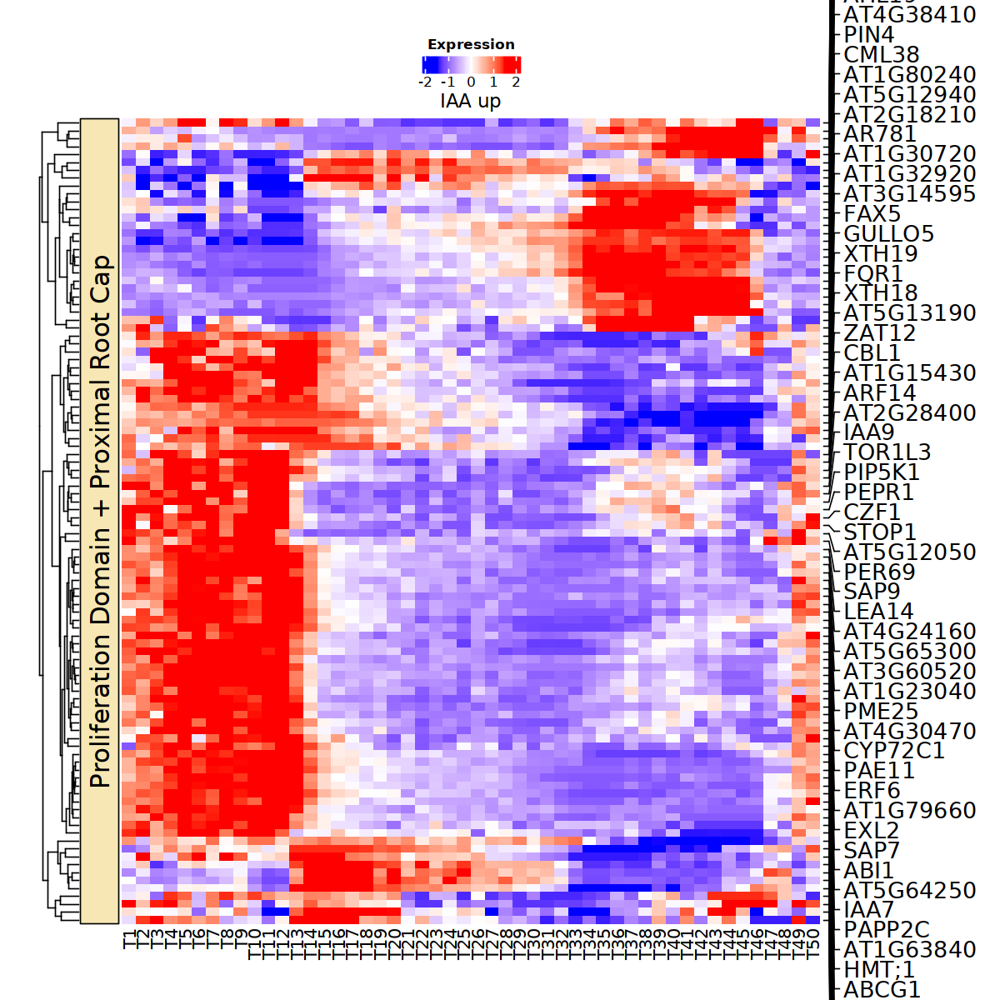

In [139]:
## Auxin_up
mark_anno = rowAnnotation(foo = anno_mark(at = mat_for_mark$index, labels = mat_for_mark$Name, labels_gp = gpar(col = "black", fontsize = 16)))

options(repr.plot.width=10, repr.plot.height=10)
hm <- Heatmap(mat2, 
        col = colorRamp2(c(-1.5, 0, 1.5), 
                         c('blue','white','red')), 
                show_column_names = T,
                cluster_columns = F,
                cluster_rows=T,
                column_title="IAA up",
                show_row_names = F, 
                   left_annotation=sa,
                   right_annotation=mark_anno,
               heatmap_legend_param = list(title_position="topcenter", title = "Expression", direction="horizontal"))

draw(hm, padding = unit(c(10, 10, 10, 10), "mm"), heatmap_legend_side = "top")

In [140]:
AR$cell_cycle_association <- rep("No",nrow(AR))
AR$cell_cycle_association[AR$GeneID %in% genes_to_plt]="Yes"

In [141]:
genes_to_plt <- intersect(Clust_Markers$gene, AR_down)

In [142]:
colnames(pooled) <- c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10",
             "T11", "T12", "T13", "T14", "T15", "T16", "T17", "T18", "T19", "T20",
             "T21", "T22", "T23", "T24", "T25", "T26", "T27", "T28", "T29", "T30",
             "T31", "T32", "T33", "T34", "T35", "T36", "T37", "T38", "T39", "T40",
             "T41", "T42", "T43", "T44", "T45", "T46", "T47", "T48", "T49", "T50")

sub_m <- pooled[genes_to_plt, c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10",
             "T11", "T12", "T13", "T14", "T15", "T16", "T17", "T18", "T19", "T20",
             "T21", "T22", "T23", "T24", "T25", "T26", "T27", "T28", "T29", "T30",
             "T31", "T32", "T33", "T34", "T35", "T36", "T37", "T38", "T39", "T40",
             "T41", "T42", "T43", "T44", "T45", "T46", "T47", "T48", "T49", "T50")]

# quantile normalize

mat = sub_m
mat2 = t(apply(mat, 1, function(x) {
    q10 = quantile(x, 0.1)
    q90 = quantile(x, 0.9)
    x[x < q10] = q10
    x[x > q90] = q90
    scale(x)
}))
colnames(mat2) = colnames(mat)

# side annotation with color to match umap

sa = rowAnnotation(foo = anno_block(gp = gpar(fill = "#f7e7b4"),
        labels = c("Proliferation Domain + Proximal Root Cap"), 
        labels_gp = gpar(col = "black", fontsize = 18)))
        
feature_names <- read_tsv("./Source_files/features.tsv.gz", col_names = c("gene", "Name", "Type")) %>%
  select(-Type) %>%
  distinct()

feature_names$Name <- gsub("-",";",feature_names$Name)

Rows: 32833 Columns: 3
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): gene, Name, Type

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [143]:
# genes to mark on side of heatmap

mat_for_mark <- data.frame(mat2) %>% 
 rownames_to_column("gene") %>%
 left_join(feature_names) %>% 
 mutate(index=dplyr::row_number()) %>%
select(Name, index) %>%
filter(Name %in% feature_names$Name[feature_names$gene %in% intersect(AR_down, genes_to_plt)])

Joining with `by = join_by(gene)`


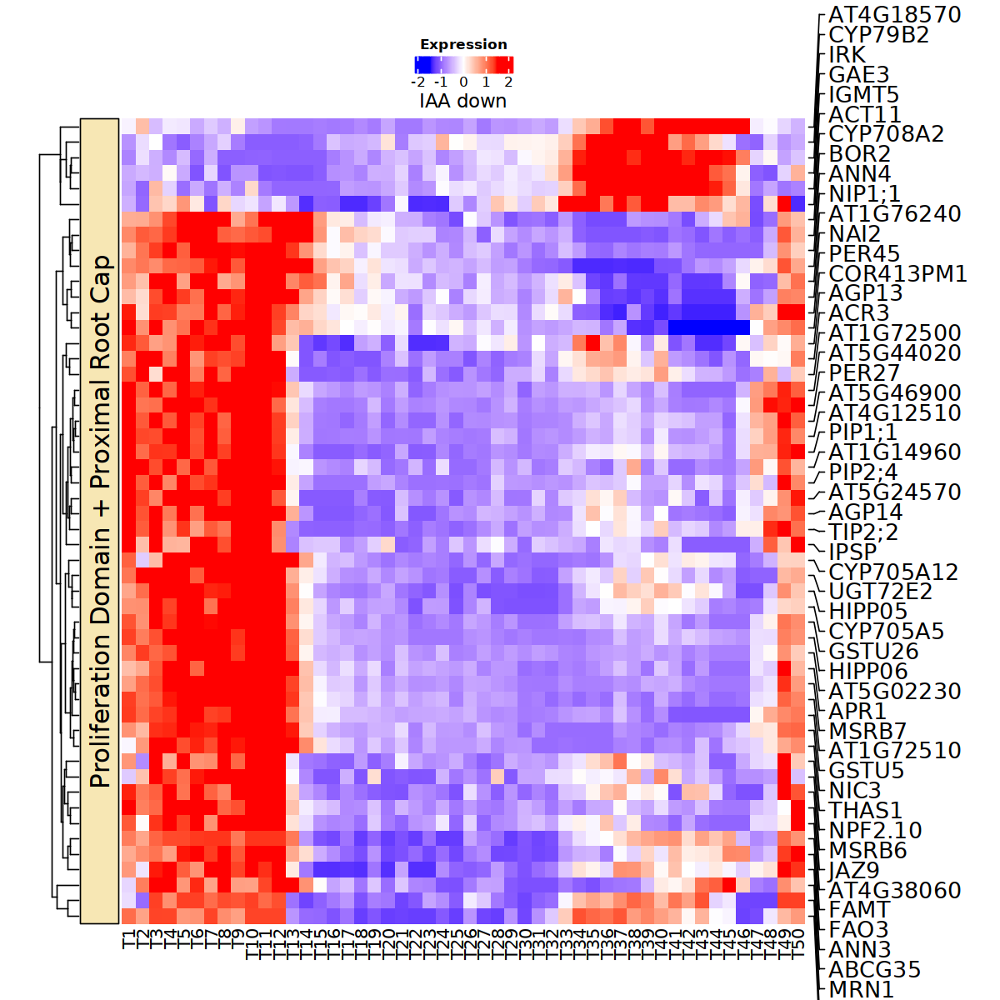

In [144]:
## Auxin_down
mark_anno = rowAnnotation(foo = anno_mark(at = mat_for_mark$index, labels = mat_for_mark$Name, labels_gp = gpar(col = "black", fontsize = 16)))

options(repr.plot.width=10, repr.plot.height=10)
hm <- Heatmap(mat2, 
        col = colorRamp2(c(-1.5, 0, 1.5), 
                         c('blue','white','red')), 
                show_column_names = T,
                cluster_columns = F,
                cluster_rows=T,
                column_title="IAA down",
                show_row_names = F, 
                   left_annotation=sa,
                   right_annotation=mark_anno,
               heatmap_legend_param = list(title_position="topcenter", title = "Expression", direction="horizontal"))

draw(hm, padding = unit(c(10, 10, 10, 10), "mm"), heatmap_legend_side = "top")

In [145]:
AR$cell_cycle_association[AR$GeneID %in% genes_to_plt]="Yes"

In [146]:
write.csv(AR, "./tradeseq/Auxin_responsive_genes_cell_cycle.csv")

## Cytokinin

In [63]:
genes_to_plt <- intersect(Clust_Markers$gene, CL$GeneID)

In [64]:
genes_to_plt

[1] "AT5G06300" "AT3G16857" "AT5G03300" "AT3G09820" "AT1G19770"

In [65]:
colnames(pooled) <- c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10",
             "T11", "T12", "T13", "T14", "T15", "T16", "T17", "T18", "T19", "T20",
             "T21", "T22", "T23", "T24", "T25", "T26", "T27", "T28", "T29", "T30",
             "T31", "T32", "T33", "T34", "T35", "T36", "T37", "T38", "T39", "T40",
             "T41", "T42", "T43", "T44", "T45", "T46", "T47", "T48", "T49", "T50")

sub_m <- pooled[genes_to_plt, c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10",
             "T11", "T12", "T13", "T14", "T15", "T16", "T17", "T18", "T19", "T20",
             "T21", "T22", "T23", "T24", "T25", "T26", "T27", "T28", "T29", "T30",
             "T31", "T32", "T33", "T34", "T35", "T36", "T37", "T38", "T39", "T40",
             "T41", "T42", "T43", "T44", "T45", "T46", "T47", "T48", "T49", "T50")]

# quantile normalize

mat = sub_m
mat2 = t(apply(mat, 1, function(x) {
    q10 = quantile(x, 0.1)
    q90 = quantile(x, 0.9)
    x[x < q10] = q10
    x[x > q90] = q90
    scale(x)
}))
colnames(mat2) = colnames(mat)

# side annotation with color to match umap

sa = rowAnnotation(foo = anno_block(gp = gpar(fill = "#f7e7b4"),
        labels = c("Proliferation Domain + Proximal Root Cap"), 
        labels_gp = gpar(col = "black", fontsize = 18)))
        
feature_names <- read_tsv("./Source_files/features.tsv.gz", col_names = c("gene", "Name", "Type")) %>%
  select(-Type) %>%
  distinct()

feature_names$Name <- gsub("-",";",feature_names$Name)

Rows: 32833 Columns: 3
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): gene, Name, Type

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [66]:
# genes to mark on side of heatmap

(mat_for_mark <- data.frame(mat2) %>% 
 rownames_to_column("gene") %>%
 left_join(feature_names) %>% 
 mutate(index=dplyr::row_number()) %>%
select(Name, index) %>%
filter(Name %in% feature_names$Name[feature_names$gene %in% intersect(CL$GeneID, genes_to_plt)]))

Joining with `by = join_by(gene)`


Name,index
<chr>,<int>
LOG7,1
ARR1,2
ADK2,3
ADK1,4
PUP14,5


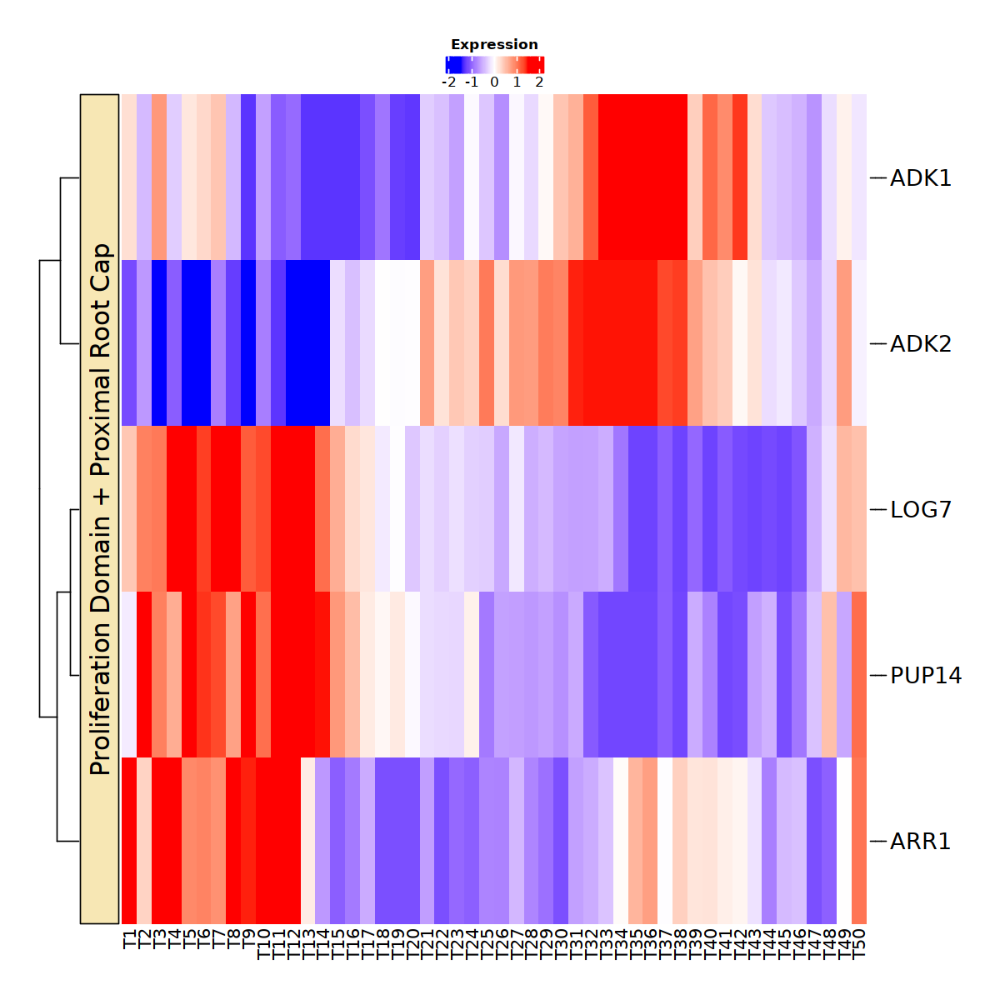

In [67]:
## CK genes
mark_anno = rowAnnotation(foo = anno_mark(at = mat_for_mark$index, labels = mat_for_mark$Name, labels_gp = gpar(col = "black", fontsize = 16)))

options(repr.plot.width=10, repr.plot.height=10)
hm <- Heatmap(mat2, 
        col = colorRamp2(c(-1.5, 0, 1.5), 
                         c('blue','white','red')), 
                show_column_names = T,
                cluster_columns = F,
                cluster_rows=T,
                show_row_names = F, 
                   left_annotation=sa,
                   right_annotation=mark_anno,
               heatmap_legend_param = list(title_position="topcenter", title = "Expression", direction="horizontal"))

draw(hm, padding = unit(c(10, 10, 10, 10), "mm"), heatmap_legend_side = "top")

In [68]:
CL$cell_cycle_association <- rep("No",nrow(CL))
CL$cell_cycle_association[CL$GeneID %in% genes_to_plt]="Yes"

In [69]:
write.csv(CL, "./tradeseq/Cytokinin_genes_cell_cycle.csv")

### Cytokinin repsonsive genes

In [20]:
#CR <- read.csv("./tradeseq/Cytokinin_responsive_genes.csv")
CR <- read.csv("./tradeseq/CK_response_genes_bert.csv")
CR <- CR[CR$GeneID %in% rownames(rc.integrated@assays$SCT@data),]

In [21]:
CR_up <- CR %>% filter(Regulation == "Up")
CR_up <- CR_up$GeneID
CR_down <- CR %>% filter(Regulation == "Down")
CR_down <- CR_down$GeneID

In [25]:
genes_to_plt <- intersect(Clust_Markers$gene, CR_up)

In [26]:
colnames(pooled) <- c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10",
             "T11", "T12", "T13", "T14", "T15", "T16", "T17", "T18", "T19", "T20",
             "T21", "T22", "T23", "T24", "T25", "T26", "T27", "T28", "T29", "T30",
             "T31", "T32", "T33", "T34", "T35", "T36", "T37", "T38", "T39", "T40",
             "T41", "T42", "T43", "T44", "T45", "T46", "T47", "T48", "T49", "T50")

sub_m <- pooled[genes_to_plt, c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10",
             "T11", "T12", "T13", "T14", "T15", "T16", "T17", "T18", "T19", "T20",
             "T21", "T22", "T23", "T24", "T25", "T26", "T27", "T28", "T29", "T30",
             "T31", "T32", "T33", "T34", "T35", "T36", "T37", "T38", "T39", "T40",
             "T41", "T42", "T43", "T44", "T45", "T46", "T47", "T48", "T49", "T50")]

# quantile normalize

mat = sub_m
mat2 = t(apply(mat, 1, function(x) {
    q10 = quantile(x, 0.1)
    q90 = quantile(x, 0.9)
    x[x < q10] = q10
    x[x > q90] = q90
    scale(x)
}))
colnames(mat2) = colnames(mat)

# side annotation with color to match umap

sa = rowAnnotation(foo = anno_block(gp = gpar(fill = "#f7e7b4"),
        labels = c("Proliferation Domain + Proximal Root Cap"), 
        labels_gp = gpar(col = "black", fontsize = 18)))
        
feature_names <- read_tsv("./Source_files/features.tsv.gz", col_names = c("gene", "Name", "Type")) %>%
  select(-Type) %>%
  distinct()

feature_names$Name <- gsub("-",";",feature_names$Name)

Rows: 32833 Columns: 3
── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): gene, Name, Type

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [27]:
# genes to mark on side of heatmap

mat_for_mark <- data.frame(mat2) %>% 
 rownames_to_column("gene") %>%
 left_join(feature_names) %>% 
 mutate(index=dplyr::row_number()) %>%
select(Name, index) %>%
filter(Name %in% feature_names$Name[feature_names$gene %in% intersect(CR_up, genes_to_plt)])

Joining with `by = join_by(gene)`


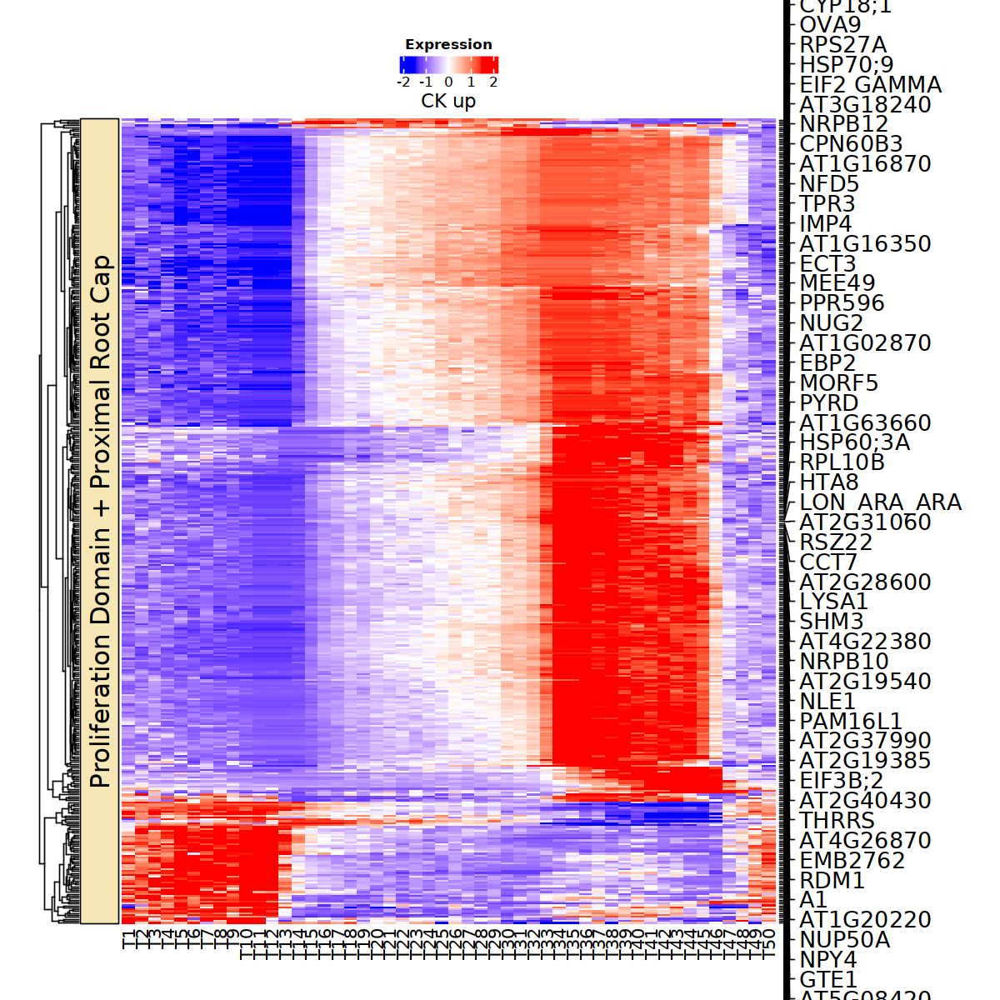

In [28]:
## CK_up
mark_anno = rowAnnotation(foo = anno_mark(at = mat_for_mark$index, labels = mat_for_mark$Name, labels_gp = gpar(col = "black", fontsize = 16)))

options(repr.plot.width=10, repr.plot.height=10)
hm <- Heatmap(mat2, 
        col = colorRamp2(c(-1.5, 0, 1.5), 
                         c('blue','white','red')), 
                show_column_names = T,
                cluster_columns = F,
                cluster_rows=T,
                column_title="CK up",
                show_row_names = F, 
                   left_annotation=sa,
                   right_annotation=mark_anno,
               heatmap_legend_param = list(title_position="topcenter", title = "Expression", direction="horizontal"))

draw(hm, padding = unit(c(10, 10, 10, 10), "mm"), heatmap_legend_side = "top")

In [29]:
CR$cell_cycle_association <- rep("No",nrow(CR))
CR$cell_cycle_association[CR$GeneID %in% genes_to_plt]="Yes"

In [30]:
genes_to_plt <- intersect(Clust_Markers$gene, CR_down)

In [31]:
colnames(pooled) <- c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10",
             "T11", "T12", "T13", "T14", "T15", "T16", "T17", "T18", "T19", "T20",
             "T21", "T22", "T23", "T24", "T25", "T26", "T27", "T28", "T29", "T30",
             "T31", "T32", "T33", "T34", "T35", "T36", "T37", "T38", "T39", "T40",
             "T41", "T42", "T43", "T44", "T45", "T46", "T47", "T48", "T49", "T50")

sub_m <- pooled[genes_to_plt, c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10",
             "T11", "T12", "T13", "T14", "T15", "T16", "T17", "T18", "T19", "T20",
             "T21", "T22", "T23", "T24", "T25", "T26", "T27", "T28", "T29", "T30",
             "T31", "T32", "T33", "T34", "T35", "T36", "T37", "T38", "T39", "T40",
             "T41", "T42", "T43", "T44", "T45", "T46", "T47", "T48", "T49", "T50")]

# quantile normalize

mat = sub_m
mat2 = t(apply(mat, 1, function(x) {
    q10 = quantile(x, 0.1)
    q90 = quantile(x, 0.9)
    x[x < q10] = q10
    x[x > q90] = q90
    scale(x)
}))
colnames(mat2) = colnames(mat)

# side annotation with color to match umap

sa = rowAnnotation(foo = anno_block(gp = gpar(fill = "#f7e7b4"),
        labels = c("Proliferation Domain + Proximal Root Cap"), 
        labels_gp = gpar(col = "black", fontsize = 18)))
        
feature_names <- read_tsv("./Source_files/features.tsv.gz", col_names = c("gene", "Name", "Type")) %>%
  select(-Type) %>%
  distinct()

feature_names$Name <- gsub("-",";",feature_names$Name)

Rows: 32833 Columns: 3
── Column specification ─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): gene, Name, Type

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [32]:
# genes to mark on side of heatmap

mat_for_mark <- data.frame(mat2) %>% 
 rownames_to_column("gene") %>%
 left_join(feature_names) %>% 
 mutate(index=dplyr::row_number()) %>%
select(Name, index) %>%
filter(Name %in% feature_names$Name[feature_names$gene %in% intersect(CR_down, genes_to_plt)])

Joining with `by = join_by(gene)`


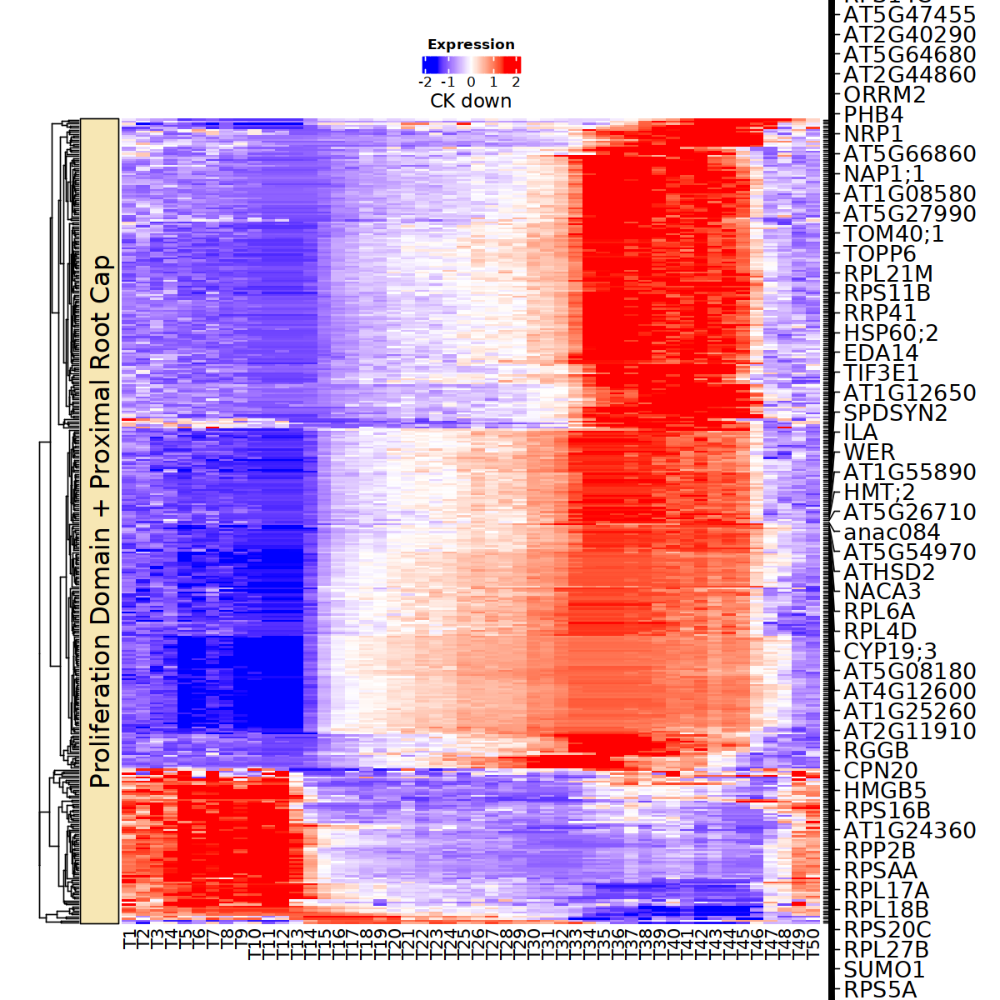

In [33]:
## CK_down
mark_anno = rowAnnotation(foo = anno_mark(at = mat_for_mark$index, labels = mat_for_mark$Name, labels_gp = gpar(col = "black", fontsize = 16)))

options(repr.plot.width=10, repr.plot.height=10)
hm <- Heatmap(mat2, 
        col = colorRamp2(c(-1.5, 0, 1.5), 
                         c('blue','white','red')), 
                show_column_names = T,
                cluster_columns = F,
                cluster_rows=T,
                column_title="CK down",
                show_row_names = F, 
                   left_annotation=sa,
                   right_annotation=mark_anno,
               heatmap_legend_param = list(title_position="topcenter", title = "Expression", direction="horizontal"))

draw(hm, padding = unit(c(10, 10, 10, 10), "mm"), heatmap_legend_side = "top")

In [34]:
CR$cell_cycle_association[CR$GeneID %in% genes_to_plt]="Yes"

In [35]:
write.csv(CR, "./tradeseq/CK_response_genes_bert_cell_cycle.csv")

## tricycle group 10

In [26]:
rc.integrated$tricycle_group <- rep("T0",ncol(rc.integrated))
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.0) & (rc.integrated$tricyclePosition <= 0.2)] <- "T1"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.2) & (rc.integrated$tricyclePosition <= 0.4)] <- "T2"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.4) & (rc.integrated$tricyclePosition <= 0.6)] <- "T3"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.6) & (rc.integrated$tricyclePosition <= 0.8)] <- "T4"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 0.8) & (rc.integrated$tricyclePosition <= 1.0)] <- "T5"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.0) & (rc.integrated$tricyclePosition <= 1.2)] <- "T6"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.2) & (rc.integrated$tricyclePosition <= 1.4)] <- "T7"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.4) & (rc.integrated$tricyclePosition <= 1.6)] <- "T8"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.6) & (rc.integrated$tricyclePosition <= 1.8)] <- "T9"
rc.integrated$tricycle_group[(rc.integrated$tricyclePosition > 1.8) & (rc.integrated$tricyclePosition <= 2.0)] <- "T10"

In [27]:
table(rc.integrated$tricycle_group)


   T1   T10    T2    T3    T4    T5    T6    T7    T8    T9 
  827  1843  2072 15155  5630  3055  4261 13557  2806  3265 

In [53]:
rc.re <- CreateSeuratObject(rc.integrated@assays$SCT@data)
rc.re$tricycle_group <- rc.integrated$tricycle_group
Idents(rc.re) <- rc.re$tricycle_group
Clust_Markers <- FindAllMarkers(rc.re, only.pos = TRUE)

Calculating cluster T3

Calculating cluster T4

Calculating cluster T5

Calculating cluster T9

Calculating cluster T6

Calculating cluster T8

Calculating cluster T10

Calculating cluster T2

Calculating cluster T7

Calculating cluster T1



In [58]:
table(Clust_Markers$cluster)


 T3  T4  T5  T9  T6  T8 T10  T2  T7  T1 
600  22   4 669  12 678 225 698 744 379 

In [59]:
temp <- Clust_Markers %>% filter(p_val_adj <0.01) %>% arrange(p_val_adj)

In [60]:
table(temp$cluster)


 T3  T4  T5  T9  T6  T8 T10  T2  T7  T1 
599  21   4 669  12 677 224 696 741 363 

In [61]:
Clust_Markers <- Clust_Markers %>% filter(p_val_adj <0.01) %>% arrange(p_val_adj)

In [62]:
write.csv(Clust_Markers, "./tradeseq/Proliferation_Domain_tricycle_group_10_DE.csv")

In [497]:
Clust_Markers <- read.csv("./tradeseq/Proliferation_Domain_tricycle_group_10_DE.csv")

In [498]:
Phase_Markers <- read.csv("./tradeseq/tricycle_markers_CC_Proliferation_domain_only_FindMarkers_18S_WT_cell_cycle_seu4_245_genes_Goldy_Zhang_AMIGO_20230911_cwh_RS.csv")

In [499]:
Modules <- read.csv("./tradeseq/All_genes_All_celltypes_tricycle_module_membership.csv")

In [500]:
head(Clust_Markers)

,X,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,AT1G52060,0,1.800354,0.519,0.314,0,T3,AT1G52060
2,AT1G52050,0,1.746516,0.518,0.306,0,T3,AT1G52050
3,AT1G52070,0,1.583873,0.699,0.500,0,T3,AT1G52070
4,AT5G54370,0,1.498317,0.623,0.444,0,T3,AT5G54370
5,AT5G60530,0,1.391631,0.621,0.420,0,T3,AT5G60530
6,AT4G15160,0,1.342413,0.640,0.503,0,T3,AT4G15160


In [501]:
table(Clust_Markers$cluster)


 T1 T10  T2  T3  T4  T5  T6  T7  T8  T9 
363 224 696 599  21   4  12 741 677 669 

In [502]:
head(Phase_Markers)

,X,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene,Name,Laura_CC_phase,Zhang_2021_CC_phase,BES1_BZR1_target,Ref_245_gene,marker,Che_Wei_Picks,cloning
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<chr>,<chr>,<chr>
1,13,0.00e+00,0.9648551,0.362,0.205,0.00e+00,G1/G0,AT5G06860,PGIP1,NA,NA,FALSE,FALSE,,G1,TN
2,85,0.00e+00,0.6023157,0.553,0.387,0.00e+00,G1/G0,AT5G10695,AT5G10695,NA,NA,FALSE,FALSE,,G1,
3,96,0.00e+00,0.5690786,0.298,0.156,0.00e+00,G1/G0,AT1G17860,KTI2,NA,NA,FALSE,FALSE,,G1,RS
4,342,1.42e-267,0.5664160,0.188,0.086,3.71e-263,G1/G0,AT1G05560,UGT1,NA,NA,FALSE,FALSE,,G1,
5,288,8.19e-297,0.5080337,0.241,0.124,2.13e-292,G1/G0,AT3G12510,AT3G12510,NA,NA,FALSE,FALSE,,G1,
6,399,1.62e-236,0.3748879,0.185,0.089,4.23e-232,G1/G0,AT2G22880,AT2G22880,NA,NA,FALSE,FALSE,,G1,RS


In [503]:
head(Modules)

,X,rowname,kME_G1.M1,kME_G1.M2,kME_G1S.M3,kME_S.M4,kME_SG2M.M5,kME_G2M.M6,kME_G1SG2M.M7,gene_id,colors,module,BES_up,BES_down,MYB3R4
,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,1,AT1G01010,-0.5842969,-0.9459480,-0.4683457,0.50939309,0.9276447,0.4751209,0.6210018,AT1G01010,turquoise,SG2M-M5,No,No,No
2,2,AT1G01020,-0.8454519,-0.9864521,-0.6614017,0.40946451,0.9972257,0.6192816,0.4193987,AT1G01020,turquoise,SG2M-M5,No,No,No
3,3,AT1G01030,-0.9083475,-0.8248669,-0.8892514,0.03187881,0.8994131,0.8290249,0.3173202,AT1G01030,turquoise,SG2M-M5,No,No,No
4,4,AT1G01040,-0.8350844,-0.9753506,-0.6944880,0.36050876,0.9991437,0.6584731,0.4502847,AT1G01040,turquoise,SG2M-M5,No,No,No
5,5,AT1G01050,0.7545767,0.7485590,0.9673472,0.16731384,-0.8550865,-0.9474326,-0.5339975,AT1G01050,blue,G1S-M3,No,No,No
6,6,AT1G01060,-0.7359682,-0.9172160,-0.8025657,0.16062016,0.9740109,0.7963047,0.6282028,AT1G01060,turquoise,SG2M-M5,No,No,No


In [504]:
Clust_Markers <- Clust_Markers[Clust_Markers$gene %in% Phase_Markers$gene,]
Clust_Markers <- Clust_Markers[Clust_Markers$gene %in% Modules$gene_id,]

In [505]:
to_remove <- names(table(Clust_Markers$gene))[which(table(Clust_Markers$gene)!=1)]

In [506]:
Clust_Markers <- Clust_Markers %>% filter(! gene %in% to_remove)

In [507]:
table(Clust_Markers$cluster)


T10  T2  T3  T4  T7  T8  T9 
 32 102 147   7 237  90  99 

In [508]:
Clust_Markers$pct_diff <- Clust_Markers$pct.1-Clust_Markers$pct.2
Clust_Markers$pct_1_rank <- rank(Clust_Markers$pct.1)
Clust_Markers$pct_diff_rank <- rank(Clust_Markers$pct_diff)
Clust_Markers$avg_log2FC_rank <- rank(Clust_Markers$avg_log2FC)
Clust_Markers$score <- Clust_Markers$pct_diff_rank + Clust_Markers$avg_log2FC_rank 
Clust_Markers <- Clust_Markers %>% group_by(cluster) %>% arrange(desc(score)) %>% top_n(237, score)
Clust_Markers$cluster <- factor(Clust_Markers$cluster, levels=c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10"))
Clust_Markers <- Clust_Markers %>% arrange(desc(score)) %>% arrange(cluster) 

In [509]:
## plot heatmap
# pseudobulk of each stage of 

  afm <- as.matrix(rc.integrated@assays$SCT@data)
  pooled <- matrix(nrow=nrow(afm), ncol = 0)

  for (i in c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10")) {
    m <- afm[,which(rc.integrated@meta.data$tricycle_group==i)]
    pooled <- cbind(pooled, rowSums(m)/ncol(m))
  }

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 10.2 GiB”


In [510]:
genes_to_plt <- Clust_Markers$gene

In [511]:
colnames(pooled) <- c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10")

sub_m <- pooled[genes_to_plt, c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10")]
head(sub_m)

,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10
AT3G16240,1.1458288,1.3009391,1.0345738,0.8315629,0.7947481,0.8077572,0.8001073,0.8091706,0.6822776,0.9316971
AT1G76070,0.4145230,0.5044791,0.3664637,0.2457308,0.2389784,0.2515240,0.2330476,0.2527381,0.2092858,0.2602494
AT3G11340,0.4233606,0.5009625,0.3734165,0.2558223,0.2552443,0.2598062,0.2662955,0.2605980,0.2480621,0.2943547
AT3G44860,0.5058851,0.6142119,0.4627136,0.3663031,0.3697610,0.3736248,0.4067678,0.4108123,0.3160601,0.3784849
AT2G18700,0.4264229,0.4832576,0.3904383,0.2300249,0.2281183,0.2366261,0.2439612,0.3029671,0.2983308,0.2619819
AT3G30390,0.4586379,0.5094511,0.4038311,0.2967372,0.2771303,0.2915560,0.2729374,0.2761653,0.2447532,0.2939349


In [512]:
# quantile normalize

mat = sub_m
mat2 = t(apply(mat, 1, function(x) {
    q10 = quantile(x, 0.1)
    q90 = quantile(x, 0.9)
    x[x < q10] = q10
    x[x > q90] = q90
    scale(x)
}))
colnames(mat2) = colnames(mat)

In [513]:
# side annotation with color to match umap

sa = rowAnnotation(foo = anno_block(gp = gpar(fill = "#f7e7b4"),
        labels = c("Proliferation Domain + Proximal Root Cap"), 
        labels_gp = gpar(col = "black", fontsize = 18)))
        
feature_names <- read_tsv("./Source_files/features.tsv.gz", col_names = c("gene", "Name", "Type")) %>%
  select(-Type) %>%
  distinct()

Rows: 32833 Columns: 3
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): gene, Name, Type

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [514]:
feature_names$Name <- gsub("-",";",feature_names$Name) 

In [515]:
core$GeneName[core$GeneID %in% intersect(core$GeneID, Clust_Markers$gene)]

[1] "CDKB1;1" "CYCA2;3" "CYCA2;4" "CYCA3;2" "CYCB3;1" "SMR8"    "FBL17"

In [516]:
feature_names$Name[feature_names$gene %in% intersect(core$GeneID, Clust_Markers$gene)]

[1] "SMR8"    "CYCA2;3" "CYCB3;1" "CYCA3;2" "CYCA2;4" "CDKB1;1" "FBL17"

In [517]:
# genes to mark on side of heatmap

(mat_for_mark <- data.frame(mat2) %>% 
 rownames_to_column("gene") %>%
 left_join(feature_names) %>% 
 mutate(index=dplyr::row_number()) %>%
select(Name, index) %>%
filter(Name %in% feature_names$Name[feature_names$gene %in% intersect(core$GeneID, Clust_Markers$gene)]))

Joining with `by = join_by(gene)`


Name,index
<chr>,<int>
SMR8,217
CYCA3;2,277
FBL17,287
CYCA2;4,588
CDKB1;1,594
CYCA2;3,624
CYCB3;1,653


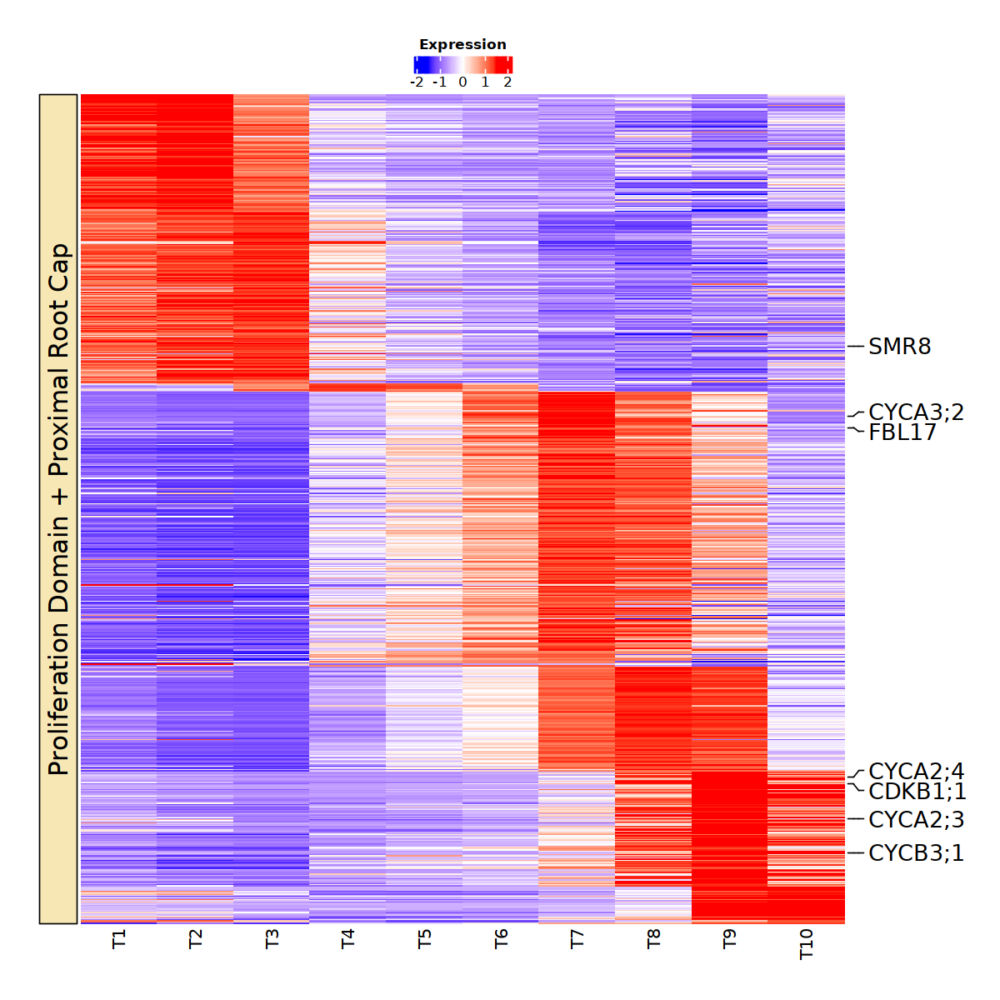

In [518]:
## Unique markers for each group
mark_anno = rowAnnotation(foo = anno_mark(at = mat_for_mark$index, labels = mat_for_mark$Name, labels_gp = gpar(col = "black", fontsize = 16)))

options(repr.plot.width=10, repr.plot.height=10)
hm <- Heatmap(mat2, 
        col = colorRamp2(c(-1.5, 0, 1.5), 
                         c('blue','white','red')), 
                show_column_names = T,
                cluster_columns = F,
                cluster_rows=F,
                show_row_names = F, 
                   left_annotation=sa,
                   right_annotation=mark_anno,
               heatmap_legend_param = list(title_position="topcenter", title = "Expression", direction="horizontal"))

draw(hm, padding = unit(c(10, 10, 10, 10), "mm"), heatmap_legend_side = "top")

In [519]:
Clust_Markers <- read.csv("./tradeseq/Proliferation_Domain_tricycle_group_10_DE.csv")
Phase_Markers <- read.csv("./tradeseq/tricycle_markers_CC_Proliferation_domain_only_FindMarkers_18S_WT_cell_cycle_seu4_245_genes_Goldy_Zhang_AMIGO_20230911_cwh_RS.csv")
Modules <- read.csv("./tradeseq/All_genes_All_celltypes_tricycle_module_membership.csv")
Clust_Markers <- Clust_Markers[Clust_Markers$gene %in% Phase_Markers$gene,]
Clust_Markers <- Clust_Markers[Clust_Markers$gene %in% Modules$gene_id,]

In [520]:
Clust_Markers$pct_diff <- Clust_Markers$pct.1-Clust_Markers$pct.2
Clust_Markers$pct_1_rank <- rank(Clust_Markers$pct.1)
Clust_Markers$pct_diff_rank <- rank(Clust_Markers$pct_diff)
Clust_Markers$avg_log2FC_rank <- rank(Clust_Markers$avg_log2FC)
Clust_Markers$score <- Clust_Markers$pct_diff_rank + Clust_Markers$avg_log2FC_rank 
Clust_Markers <- Clust_Markers %>% arrange(desc(score))

In [521]:
t1 <- intersect(Clust_Markers$gene[Clust_Markers$cluster=="T1"],Phase_Markers$gene[Phase_Markers$cluster=="G1/G0"])
t2 <- intersect(Clust_Markers$gene[Clust_Markers$cluster=="T2"],Phase_Markers$gene[Phase_Markers$cluster=="G1/G0"])
t3 <- intersect(Clust_Markers$gene[Clust_Markers$cluster=="T3"],Phase_Markers$gene[Phase_Markers$cluster=="G1/G0"])
t4 <- intersect(Clust_Markers$gene[Clust_Markers$cluster=="T4"],Phase_Markers$gene[Phase_Markers$cluster=="G1/G0"])
t5 <- intersect(Clust_Markers$gene[Clust_Markers$cluster=="T5"],Phase_Markers$gene[Phase_Markers$cluster=="G1/G0"])
t6 <- intersect(Clust_Markers$gene[Clust_Markers$cluster=="T6"],Phase_Markers$gene[Phase_Markers$cluster=="S"])
t7 <- intersect(Clust_Markers$gene[Clust_Markers$cluster=="T7"],Phase_Markers$gene[Phase_Markers$cluster=="S"])
t8 <- intersect(Clust_Markers$gene[Clust_Markers$cluster=="T8"],Phase_Markers$gene[Phase_Markers$cluster=="S"])
t9 <- intersect(Clust_Markers$gene[Clust_Markers$cluster=="T9"],Phase_Markers$gene[Phase_Markers$cluster=="G2M"])
t10 <- intersect(Clust_Markers$gene[Clust_Markers$cluster=="T10"],Phase_Markers$gene[Phase_Markers$cluster=="G2M"])

In [522]:
genes_to_plt <- c(t1,t2,t3,t4,t5,t6,t7,t8,t9,t10)
genes_to_plt <- genes_to_plt[!duplicated(genes_to_plt)]
length(genes_to_plt)

[1] 1912

In [523]:
colnames(pooled) <- c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10")

sub_m <- pooled[genes_to_plt, c("T1", "T2", "T3", "T4", "T5", "T6", "T7", "T8", "T9", "T10")]

# quantile normalize

mat = sub_m
mat2 = t(apply(mat, 1, function(x) {
    q10 = quantile(x, 0.1)
    q90 = quantile(x, 0.9)
    x[x < q10] = q10
    x[x > q90] = q90
    scale(x)
}))
colnames(mat2) = colnames(mat)

# side annotation with color to match umap

sa = rowAnnotation(foo = anno_block(gp = gpar(fill = "#f7e7b4"),
        labels = c("Proliferation Domain + Proximal Root Cap"), 
        labels_gp = gpar(col = "black", fontsize = 18)))
        
feature_names <- read_tsv("./Source_files/features.tsv.gz", col_names = c("gene", "Name", "Type")) %>%
  select(-Type) %>%
  distinct()

feature_names$Name <- gsub("-",";",feature_names$Name)

Rows: 32833 Columns: 3
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (3): gene, Name, Type

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [524]:
feature_names$Name[feature_names$gene %in% intersect(core$GeneID, genes_to_plt)]

[1] "SMR8"    "CYCA2;3" "CYCB3;1" "CYCB2;3" "CDKB2;2" "CYCA1;1" "CYCA3;2"
 [8] "CYCB2;4" "CDKB2;1" "CYCA2;4" "CYCB1;2" "MYB3R4"  "FZR3"    "CDKG1"  
[15] "CYCB1;3" "CDKB1;1" "FBL17"   "GIG1"    "CYCB2;1" "CYCB1;4" "CDKB1;2"
[22] "CDC20;2" "CDC20;1" "CYCB2;2" "CYCB1;1"

In [525]:
# genes to mark on side of heatmap

(mat_for_mark <- data.frame(mat2) %>% 
 rownames_to_column("gene") %>%
 left_join(feature_names) %>% 
 mutate(index=dplyr::row_number()) %>%
select(Name, index) %>%
filter(Name %in% feature_names$Name[feature_names$gene %in% intersect(core$GeneID, genes_to_plt)]))

Joining with `by = join_by(gene)`


Name,index
<chr>,<int>
CDKG1,102
SMR8,674
CYCA3;2,762
FBL17,854
CDKB2;1,1604
CDKB2;2,1605
CYCB2;3,1611
CYCA1;1,1613
FZR3,1623


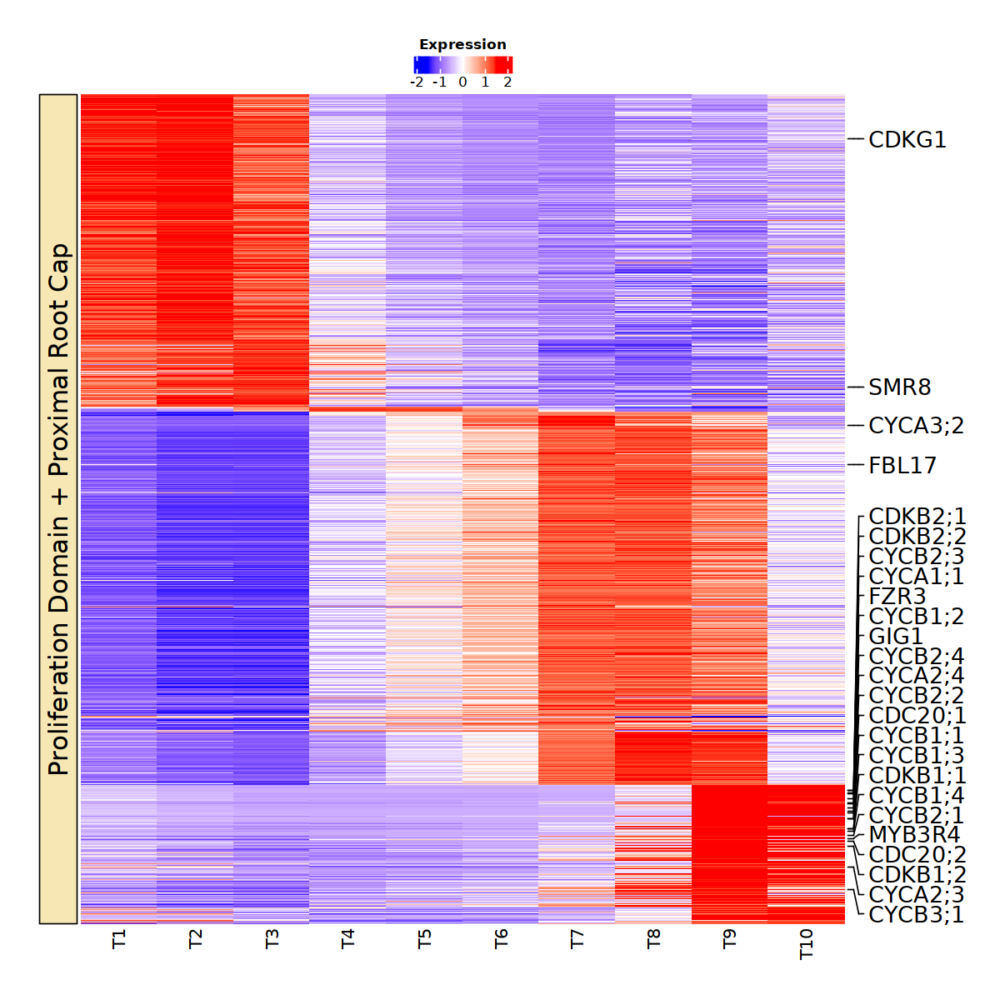

In [526]:
## Unique markers for each group
mark_anno = rowAnnotation(foo = anno_mark(at = mat_for_mark$index, labels = mat_for_mark$Name, labels_gp = gpar(col = "black", fontsize = 16)))

options(repr.plot.width=10, repr.plot.height=10)
hm <- Heatmap(mat2, 
        col = colorRamp2(c(-1.5, 0, 1.5), 
                         c('blue','white','red')), 
                show_column_names = T,
                cluster_columns = F,
                cluster_rows=F,
                show_row_names = F, 
                   left_annotation=sa,
                   right_annotation=mark_anno,
               heatmap_legend_param = list(title_position="topcenter", title = "Expression", direction="horizontal"))

draw(hm, padding = unit(c(10, 10, 10, 10), "mm"), heatmap_legend_side = "top")

In [78]:
core_dyn_name <- feature_names$Name[feature_names$gene %in% intersect(core$GeneID, genes_to_plt)]

In [79]:
core_dyn_gene <- feature_names$gene[feature_names$gene %in% intersect(core$GeneID, genes_to_plt)]

## Load gene lists

In [19]:
DefaultAssay(rc.integrated) <- "SCT"

In [20]:
nrow(rc.integrated)

[1] 26058

In [21]:
GL <- read.csv("./tradeseq/BES1_BZR1_2X_ChIP_targets.csv")
GL <- intersect(GL$GeneID,rownames(rc.integrated))
GL2 <- read.csv("./tradeseq/BES1_BZR1_target_BL2hr_vs_BRZ.csv")
GL2up <- GL2 %>% filter(BL2hr_vs_BRZ=="BES1_Target_BL_up")
GL2up <- intersect(GL2up$GeneID, rownames(rc.integrated))
GL2down <- GL2 %>% filter(BL2hr_vs_BRZ=="BES1_Target_BL_down")
GL2down <- intersect(GL2down$GeneID, rownames(rc.integrated))
GL2mixed <- GL2 %>% filter(BL2hr_vs_BRZ=="BES1_Target_BL_mixed")
GL2mixed <- intersect(GL2mixed$GeneID, rownames(rc.integrated))
GL3 <- read.csv("./tradeseq/MYB3R4_Targets.csv")
GL3 <- intersect(GL3$GeneID, rownames(rc.integrated))

In [22]:
DE <- read.csv("./tradeseq/v4_BL2hr_v_BRZ_cell_time_EdgeR_q0.05_FC1.5_r_v_4_20220112.csv", row.names = 1)
DE <- DE %>% filter(cluster_id == "Proliferation Domain_Atrichoblast")
head(DE)

,gene,cluster_id,sc_2.cpm,sc_43.cpm,sc_50.cpm,sc_5.cpm,sc_46.cpm,sc_49.cpm,sc_2.frq,sc_43.frq,...,F,p_val,p_adj.loc,p_adj.glb,contrast,Name,TF_Name,Description,up_dn_label,clust_up_dn
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,AT3G50660,Proliferation Domain_Atrichoblast,66.5,53.90,58.10,3.04,1.22,1.31,0.7780,0.6530,...,603,1.14e-26,2.56e-22,7.02e-21,BL-BRZ,CYP90B1,NA,NA,Down,Proliferation Domain_Atrichoblast_Down
2,AT4G36780,Proliferation Domain_Atrichoblast,227.0,167.00,196.00,17.90,12.50,12.70,0.9490,0.8930,...,551,6.89e-26,7.70e-22,4.22e-20,BL-BRZ,BEH2,BEH2,BES1/BZR1 homolog 2,Down,Proliferation Domain_Atrichoblast_Down
3,AT4G01630,Proliferation Domain_Atrichoblast,12.0,6.87,11.50,209.00,142.00,142.00,0.2530,0.1480,...,508,3.38e-25,2.52e-21,2.07e-19,BL-BRZ,EXPA17,NA,NA,Up,Proliferation Domain_Atrichoblast_Up
4,AT2G43890,Proliferation Domain_Atrichoblast,2.4,1.77,2.28,110.00,31.40,41.30,0.0606,0.0473,...,454,2.98e-24,1.67e-20,1.83e-18,BL-BRZ,AT2G43890,NA,NA,Up,Proliferation Domain_Atrichoblast_Up
5,AT4G16780,Proliferation Domain_Atrichoblast,54.0,57.00,56.20,3.99,4.29,5.76,0.6870,0.7080,...,406,2.55e-23,1.14e-19,1.56e-17,BL-BRZ,HAT4,HB-2,homeobox protein 2,Down,Proliferation Domain_Atrichoblast_Down
6,AT1G07985,Proliferation Domain_Atrichoblast,162.0,176.00,228.00,23.00,21.80,16.40,0.8990,0.7460,...,363,2.25e-22,8.40e-19,1.38e-16,BL-BRZ,AT1G07985,NA,NA,Down,Proliferation Domain_Atrichoblast_Down


## Prepare data for WCGNA

In [23]:
rc.integrated <- subset(rc.integrated, cells=colnames(rc.integrated)[which(rc.integrated$cell_type=="Atrichoblast")])

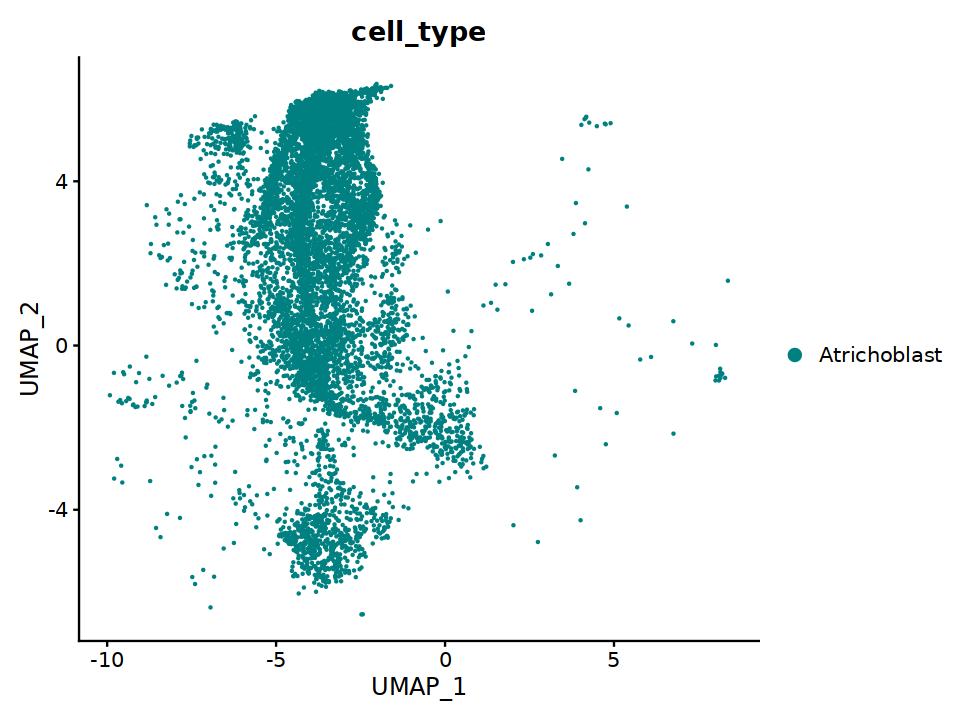

In [24]:
options(repr.plot.width=8, repr.plot.height=6)
plot_anno(rc.integrated)

In [25]:
rc.integrated

An object of class Seurat 
74352 features across 8115 samples within 3 assays 
Active assay: SCT (26058 features, 0 variable features)
 2 other assays present: RNA, integrated
 3 dimensional reductions calculated: pca, umap, umap_2D

In [26]:
table(rc.integrated$sample)


     dc1      dc2 sc_10_at    sc_11    sc_12   sc_157   sc_158   sc_159 
     468      427      314      402      231      108      112      195 
  sc_169   sc_170   sc_171    sc_20   sc_215   sc_221   sc_229   sc_235 
     128      188      253      374     1403     2067      312      158 
   sc_71     tnw1 
     736      239 

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


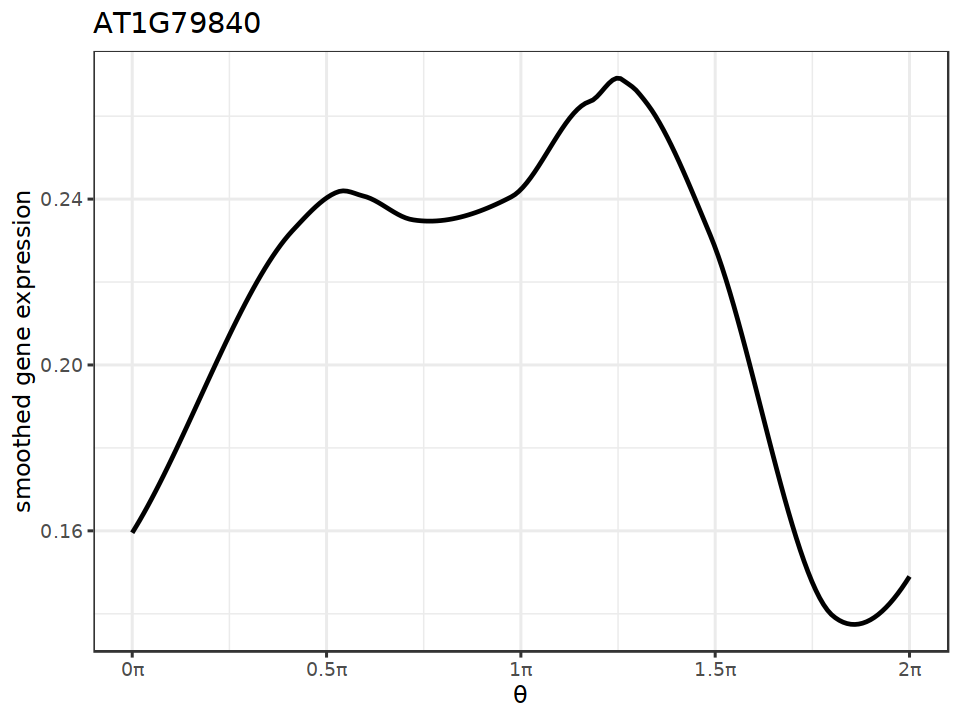

In [21]:
## Atrichoblast only
## GL2 
pltsg('AT1G79840')

png 
  2

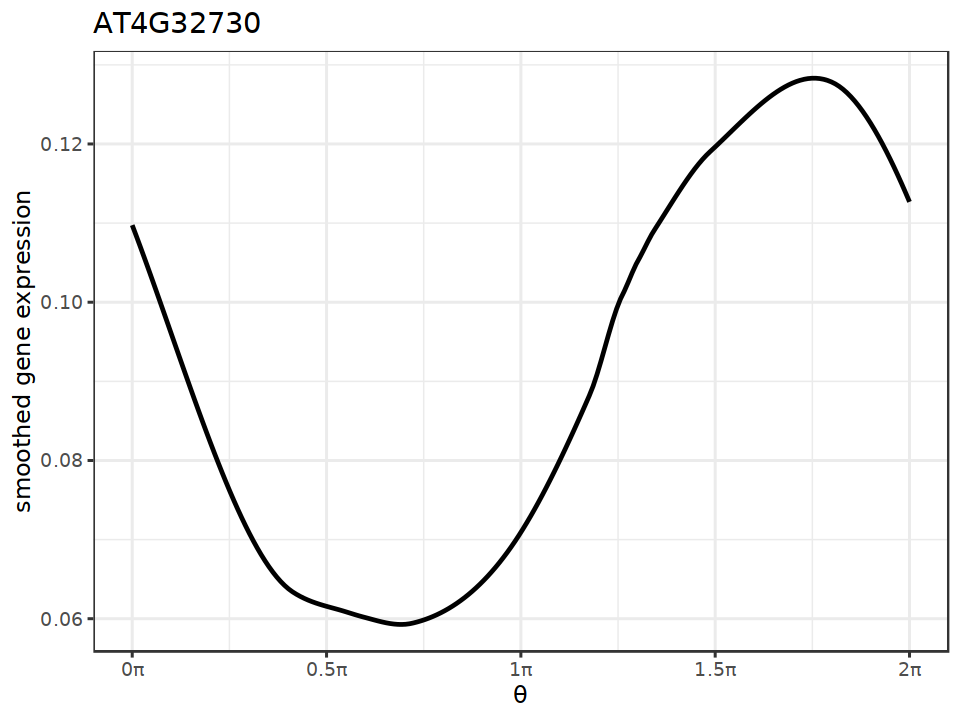

In [99]:
grDevices::cairo_pdf("Atrichoblast_MYB3R1.pdf",width=8, height=6)
pltsg('AT4G32730')
dev.off()

pltsg('AT4G32730')

png 
  2

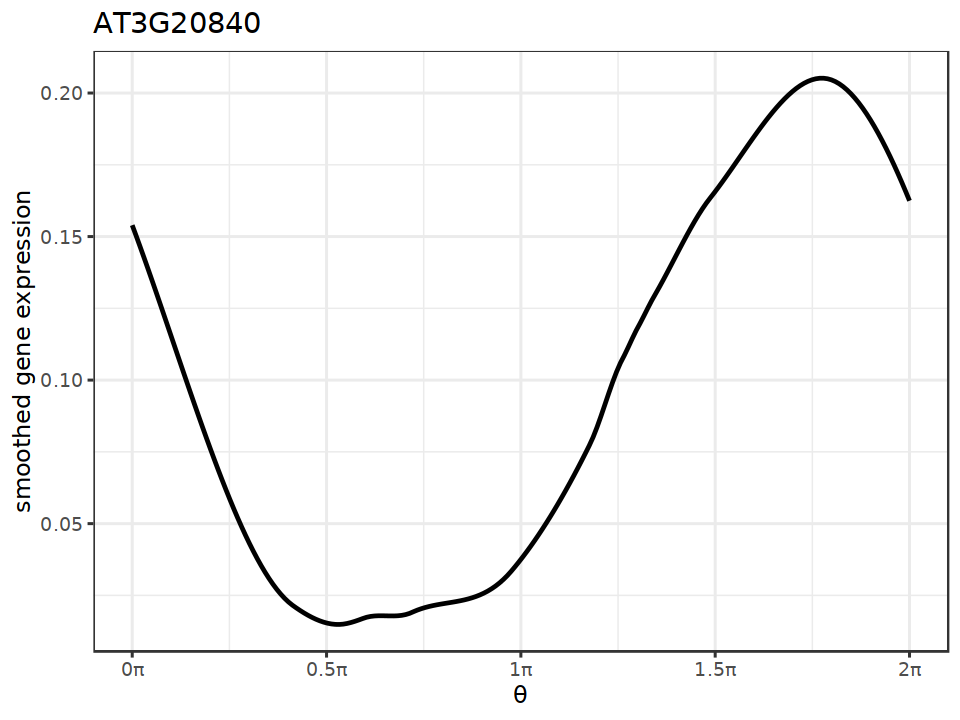

In [100]:
grDevices::cairo_pdf("Atrichoblast_PLT1.pdf",width=8, height=6)
pltsg('AT3G20840')
dev.off()

pltsg('AT3G20840')

png 
  2

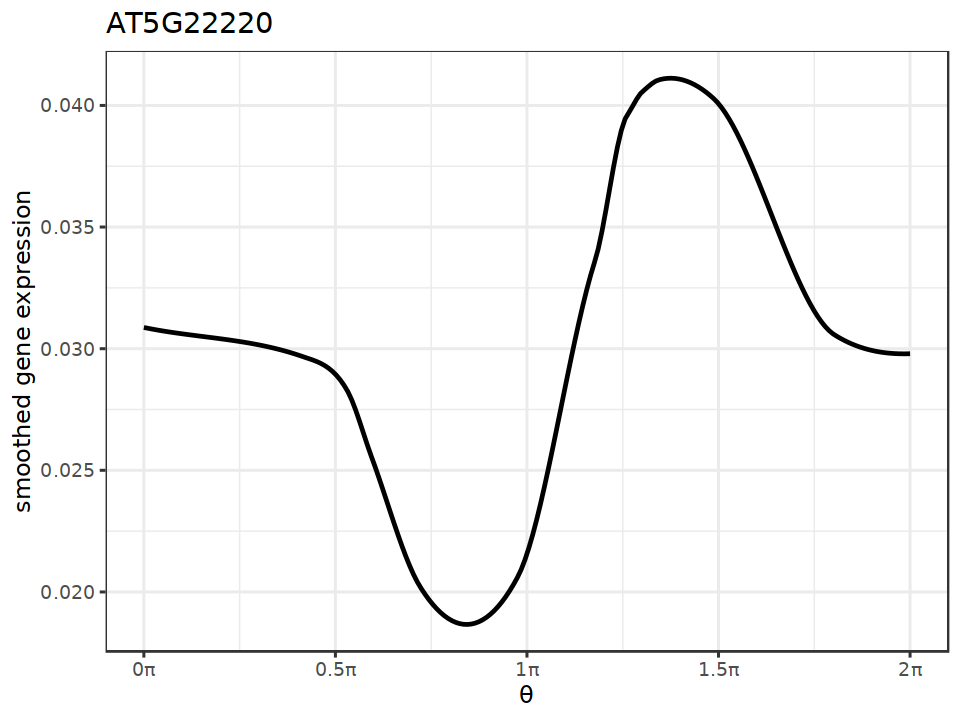

In [101]:
grDevices::cairo_pdf("Atrichoblast_E2Fb.pdf",width=8, height=6)
pltsg('AT5G22220')
dev.off()

pltsg('AT5G22220')

png 
  2

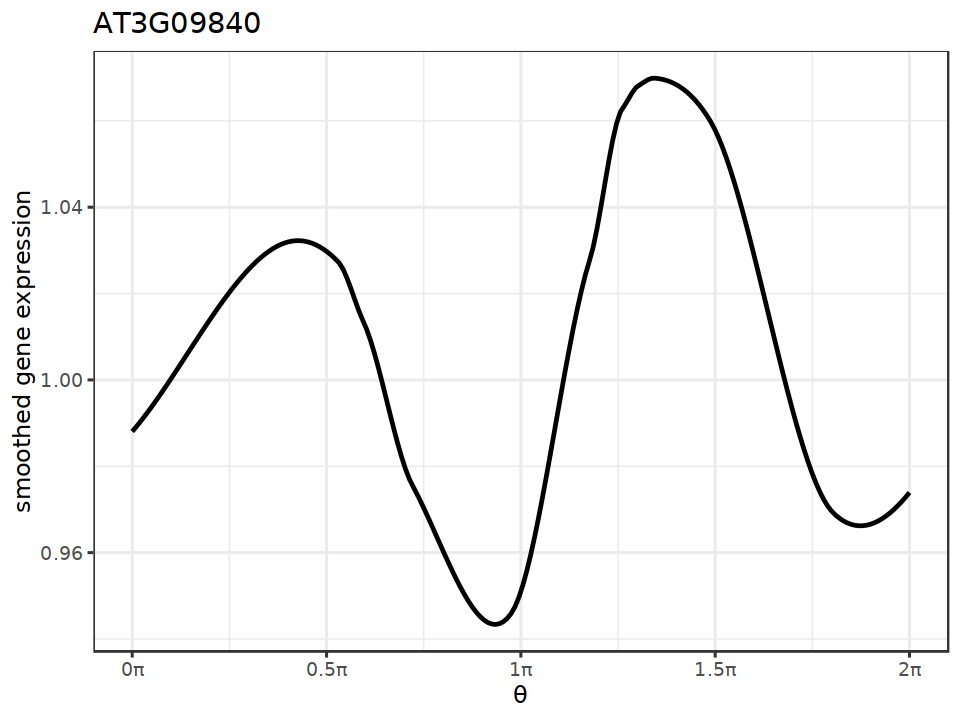

In [102]:
grDevices::cairo_pdf("Atrichoblast_CDC48A.pdf",width=8, height=6)
pltsg('AT3G09840')
dev.off()

pltsg('AT3G09840')

png 
  2

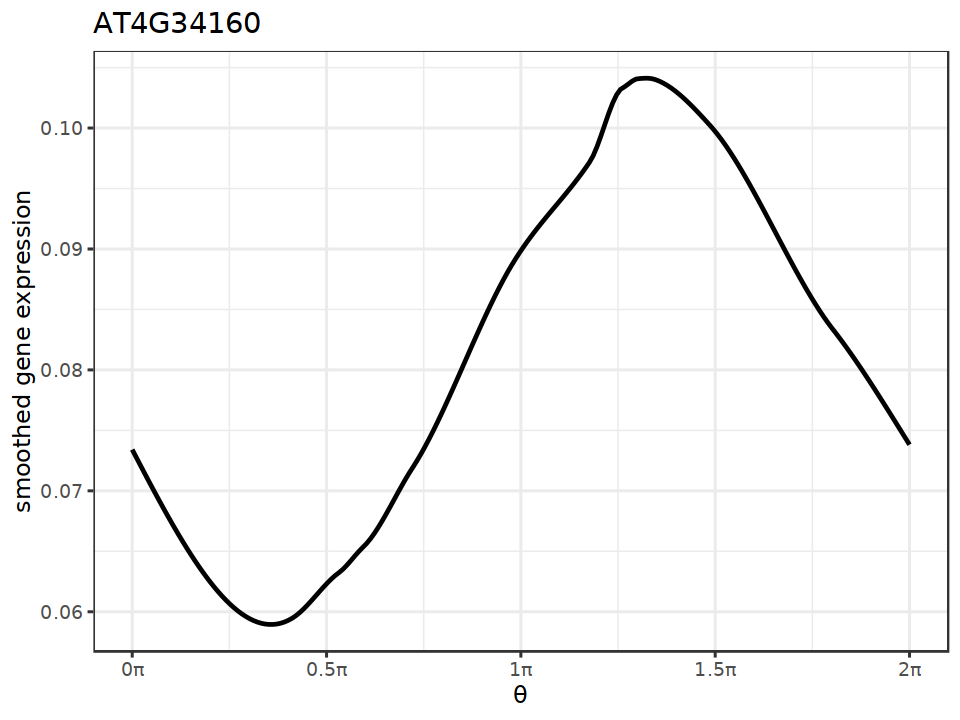

In [103]:
grDevices::cairo_pdf("Atrichoblast_CYCD3_1.pdf",width=8, height=6)
pltsg('AT4G34160')
dev.off()

pltsg('AT4G34160')

png 
  2

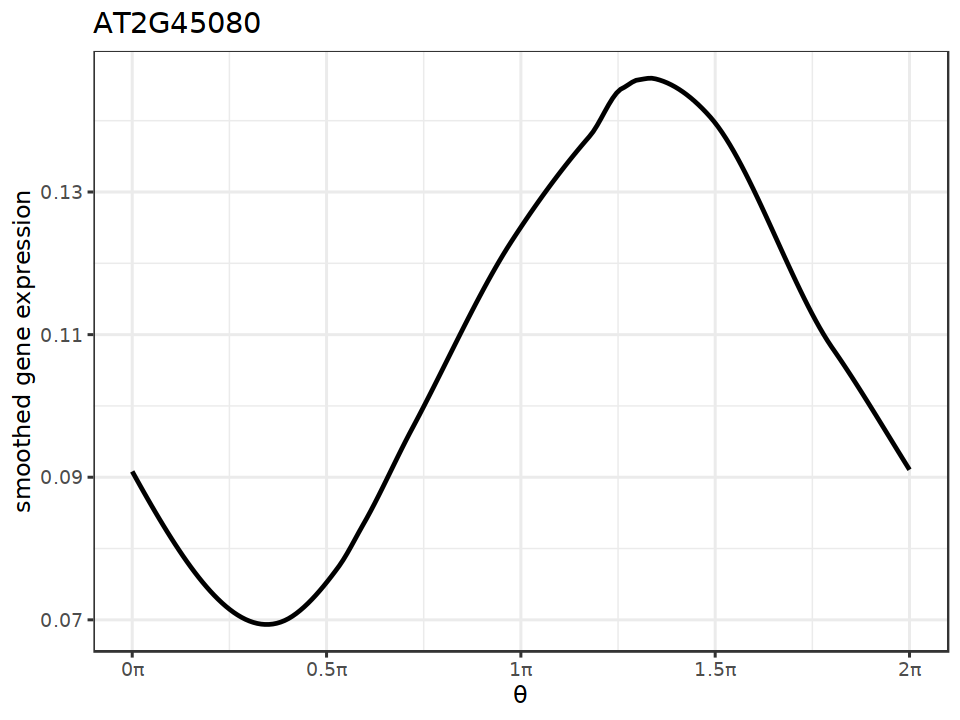

In [104]:
grDevices::cairo_pdf("Atrichoblast_CYCP3_1.pdf",width=8, height=6)
pltsg('AT2G45080')
dev.off()

pltsg('AT2G45080')

png 
  2

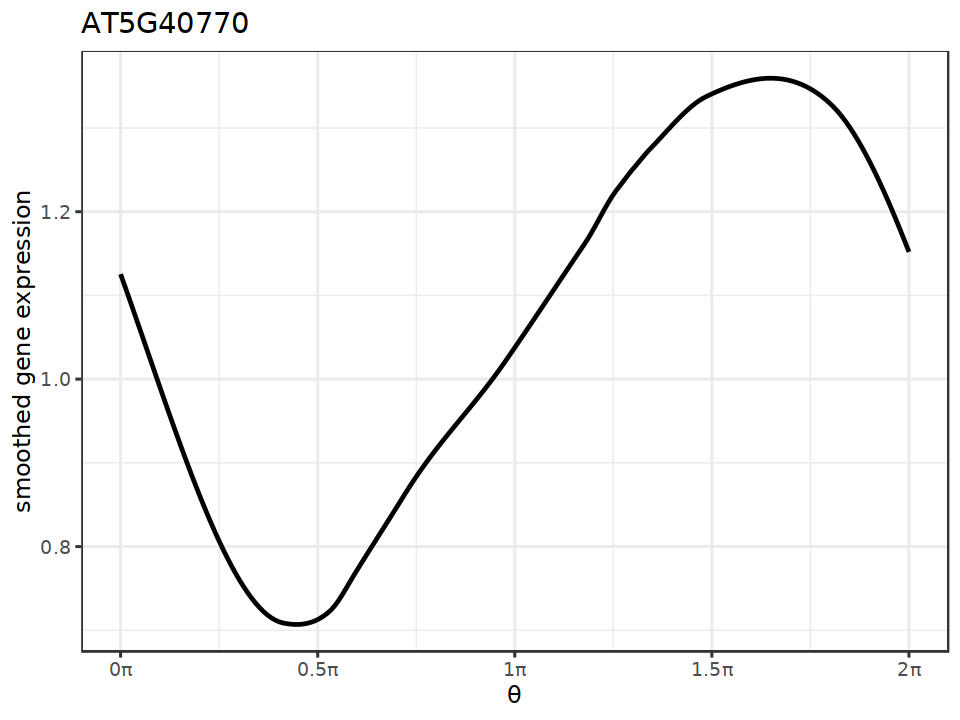

In [105]:
#PHB3 AT5G40770
grDevices::cairo_pdf("Atrichoblast_PHB3.pdf",width=8, height=6)
pltsg('AT5G40770')
dev.off()

pltsg('AT5G40770')

png 
  2

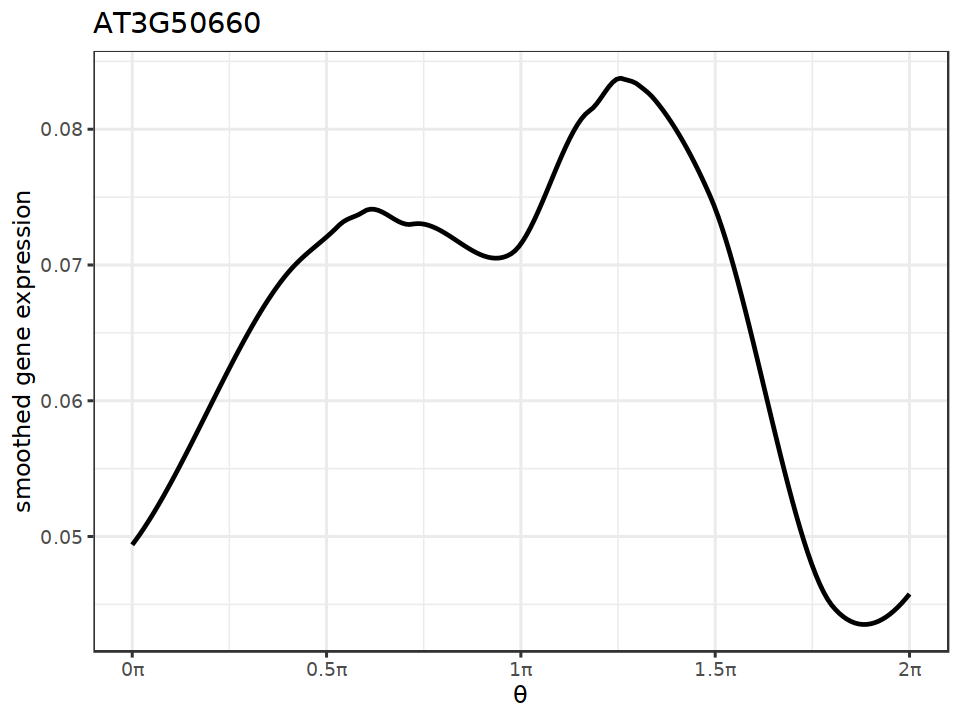

In [40]:
## Atrichoblast only
## DWF4 

grDevices::cairo_pdf("Atrichoblast_DWF4.pdf",width=8, height=6)
pltsg('AT3G50660')
dev.off()

pltsg('AT3G50660')

png 
  2

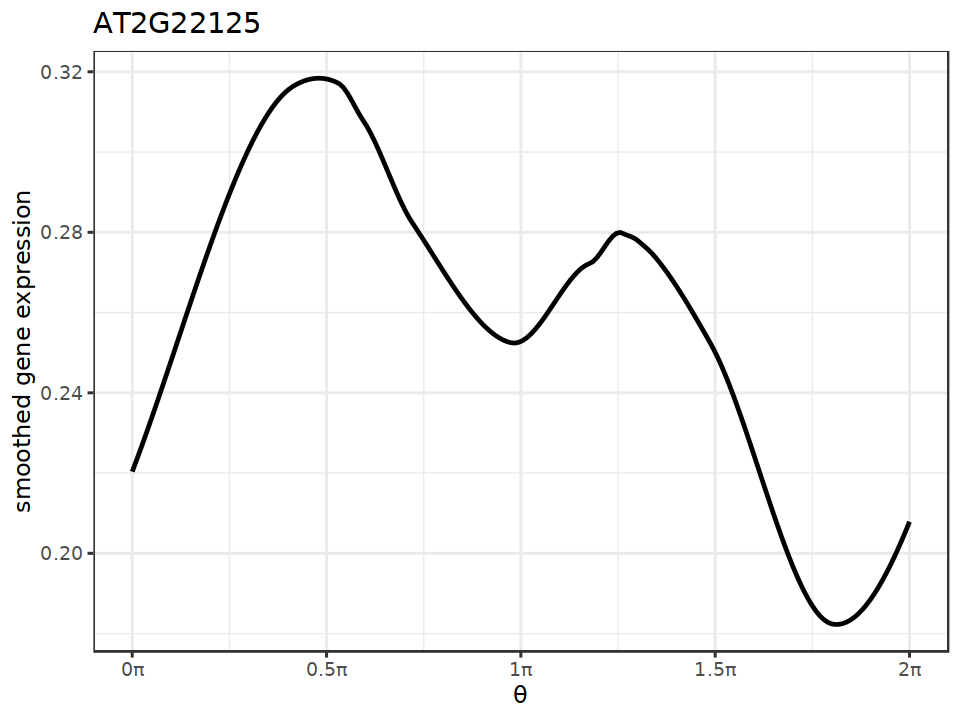

In [41]:
## CSI1
grDevices::cairo_pdf("Atrichoblast_CSI1.pdf",width=8, height=6)
pltsg('AT2G22125')
dev.off()

pltsg('AT2G22125')

png 
  2

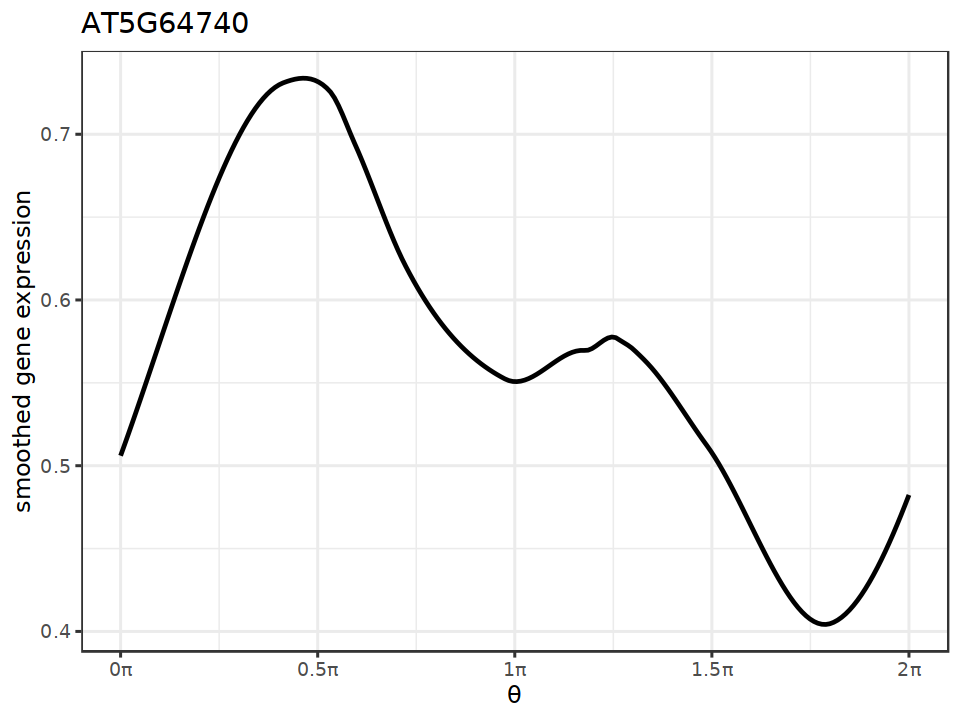

In [42]:
## CESA6 
grDevices::cairo_pdf("Atrichoblast_CESA6.pdf",width=8, height=6)
pltsg('AT5G64740')
dev.off()

pltsg('AT5G64740')

png 
  2

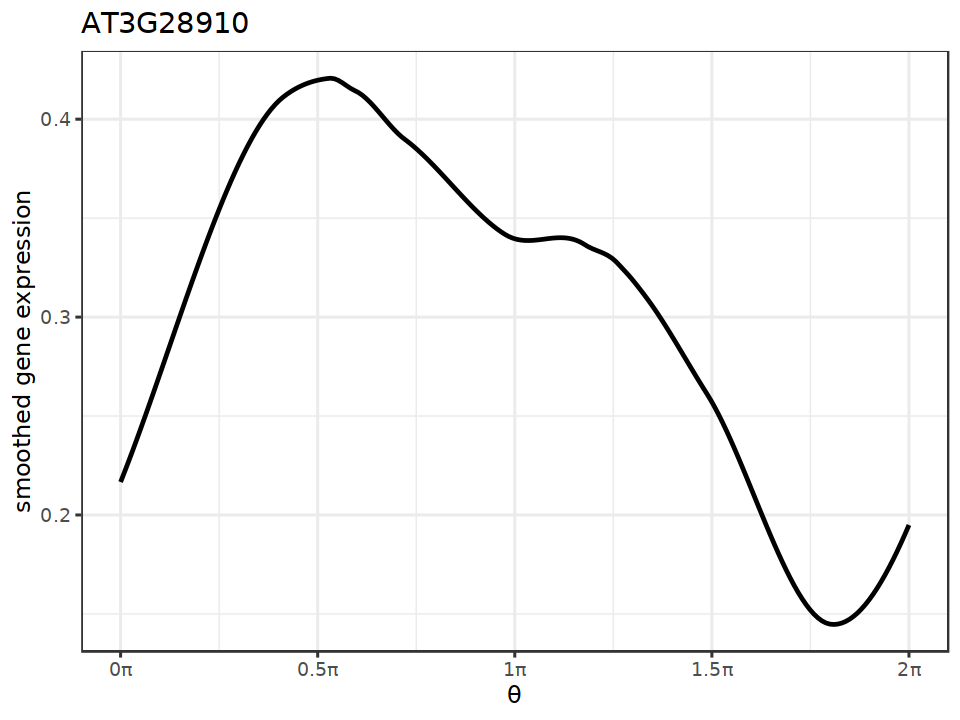

In [43]:
## MYB30 
grDevices::cairo_pdf("Atrichoblast_MYB30.pdf",width=8, height=6)
pltsg('AT3G28910')
dev.off()

pltsg('AT3G28910')

png 
  2

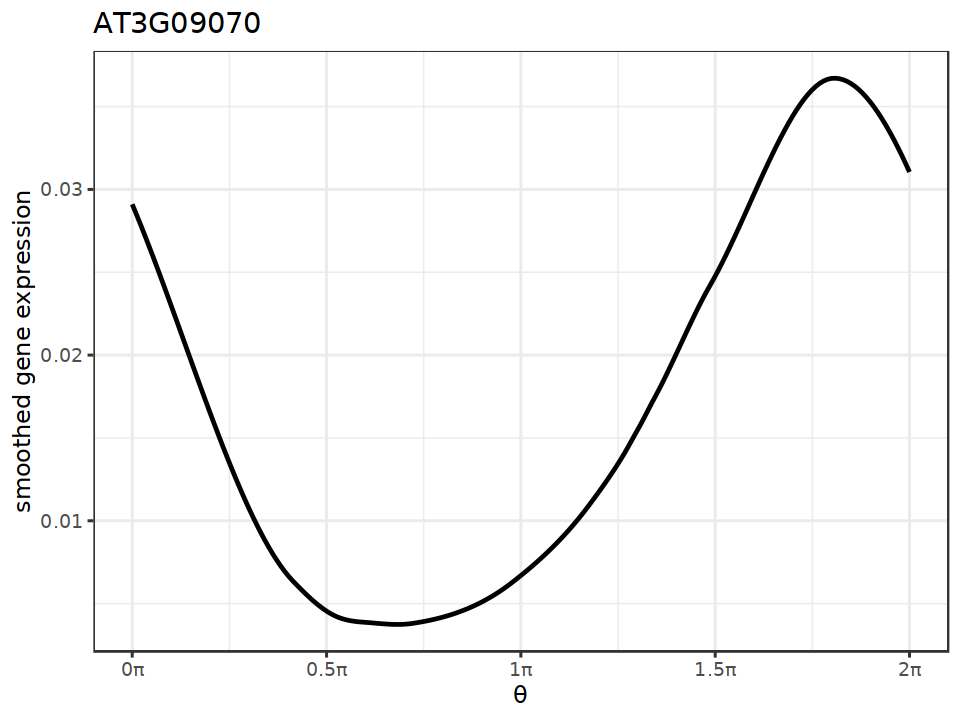

In [44]:
## OPS 
grDevices::cairo_pdf("Atrichoblast_OPS.pdf",width=8, height=6)
pltsg('AT3G09070')
dev.off()

pltsg('AT3G09070')

png 
  2

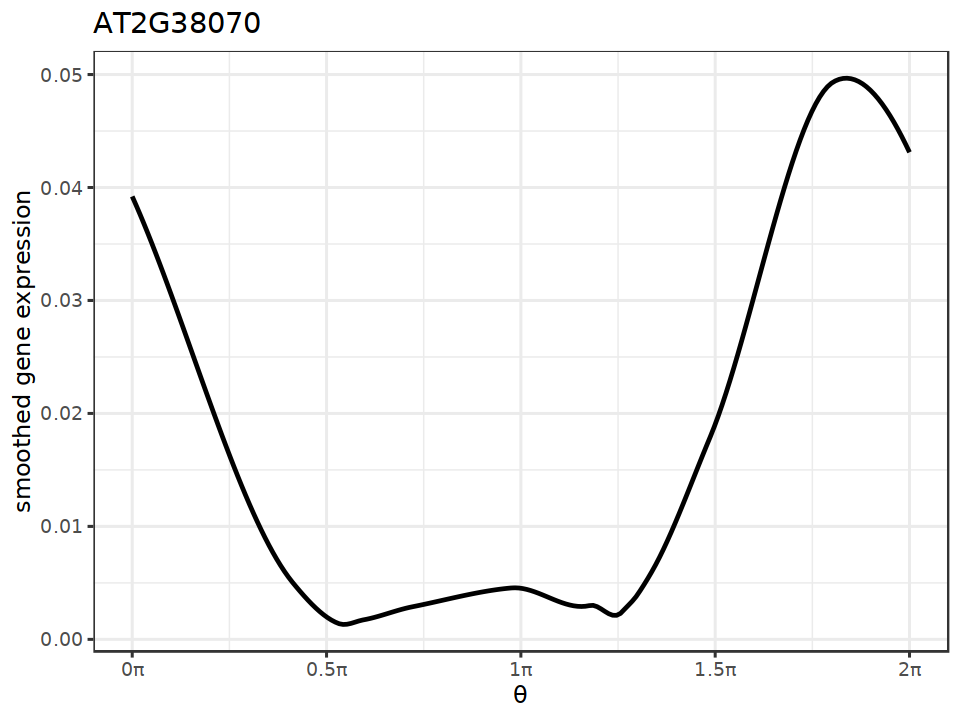

In [45]:
## OPL2 
grDevices::cairo_pdf("Atrichoblast_OPL2.pdf",width=8, height=6)
pltsg('AT2G38070')
dev.off()

pltsg('AT2G38070')

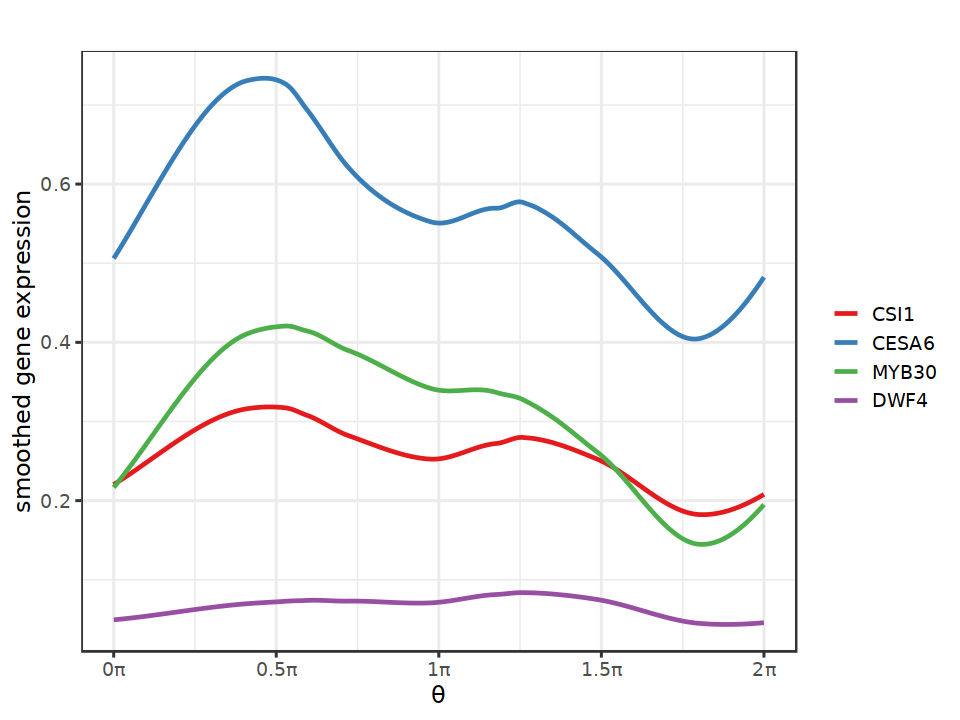

In [547]:
keygene.idx <- which(rownames(rc.integrated@assays$SCT@data) == "AT2G22125")
fit.l <- fit_periodic_loess(rc.integrated$tricyclePosition*pi,
                        rc.integrated@assays$SCT@data[keygene.idx,],
                        plot = FALSE, span=0.3,
                   x_lab = "Cell cycle position \u03b8", y_lab = "log2(keygene)")
fit <- fit.l$pred.df
keygene.idx <- which(rownames(rc.integrated@assays$SCT@data) == "AT5G64740")
fit.l <- fit_periodic_loess(rc.integrated$tricyclePosition*pi,
                        rc.integrated@assays$SCT@data[keygene.idx,],
                        plot = FALSE, span=0.3,
                   x_lab = "Cell cycle position \u03b8", y_lab = "log2(keygene)")
fit <- rbind(fit, fit.l$pred.df)
keygene.idx <- which(rownames(rc.integrated@assays$SCT@data) == "AT3G28910")
fit.l <- fit_periodic_loess(rc.integrated$tricyclePosition*pi,
                        rc.integrated@assays$SCT@data[keygene.idx,],
                        plot = FALSE, span=0.3,
                   x_lab = "Cell cycle position \u03b8", y_lab = "log2(keygene)")
fit <- rbind(fit, fit.l$pred.df)
keygene.idx <- which(rownames(rc.integrated@assays$SCT@data) == "AT3G50660")
fit.l <- fit_periodic_loess(rc.integrated$tricyclePosition*pi,
                        rc.integrated@assays$SCT@data[keygene.idx,],
                        plot = FALSE, span=0.3,
                   x_lab = "Cell cycle position \u03b8", y_lab = "log2(keygene)")
fit <- rbind(fit, fit.l$pred.df)
fit$treatment <- factor(c(rep("CSI1", 200),rep("CESA6", 200),rep("MYB30", 200),rep("DWF4", 200)), levels=c("CSI1","CESA6", "MYB30", "DWF4"))

options(repr.plot.width=8, repr.plot.height=6)
print(ggplot(fit, aes(x=x,y=y, color=treatment)) + geom_path(size = 1, alpha = 1)+ labs(x = "θ", y = "smoothed gene expression", title = "") + 
            scale_x_continuous(limits = c(0, 2 * pi), breaks = c(0, 
                pi/2, pi, 3 * pi/2, 2 * pi), labels = paste0(c(0, 
                0.5, 1, 1.5, 2), "π"), name = "θ")+
  #              scale_x_continuous(limits = c(0, 200), breaks = c(0, 
  #              50, 100, 150, 200), labels = paste0(c(0, 
  #              0.5, 1, 1.5, 2), "π"), name = "θ")+
      
  scale_color_brewer(palette="Set1")+
  theme_bw(base_size = 14)+
  theme(legend.title=element_blank()))

In [ ]:
y.list <- c()
for (gene in rownames(rc.integrated)){
keygene.idx <- which(rownames(rc.integrated) == gene)
fit.l <- fit_periodic_loess(rc.integrated$tricyclePosition*pi,
                            rc.integrated@assays$SCT@data[keygene.idx,],
                            plot = FALSE, span=0.3,
                       x_lab = "Cell cycle position \u03b8", y_lab = "log2(keygene)")
fit <- fit.l$pred.df

y.list <- cbind(y.list,fit$y)
}

In [ ]:
colnames(y.list) <- rownames(rc.integrated)

In [ ]:
write.csv(y.list, "./tradeseq/All_genes_Atrichoblast_tricycle.csv")

In [27]:
y.list <- read.csv("./tradeseq/All_genes_Atrichoblast_tricycle.csv", row.names=1)
y.list <- as.matrix(y.list)

In [28]:
head(y.list)

,AT1G01010,AT1G01020,AT1G01030,AT1G01040,AT1G01050,AT1G01060,AT1G01070,AT1G01080,AT1G01090,AT1G01100,...,AT3G06085,AT3G16525,AT3G28899,AT3G01165,AT3G26813,AT4G20250,AT5G12910,AT5G04175,AT5G48700,AT5G08765
1,0.03437418,0.1612505,0.01163936,0.02817155,1.138159,0.05939835,0.0010859504,0.01923415,0.6983683,2.797759,...,0,0,0,0,0,0,0,0,0,0
2,0.03445125,0.1593607,0.01141413,0.02762631,1.142304,0.05855187,0.0010508947,0.01876431,0.6959656,2.787630,...,0,0,0,0,0,0,0,0,0,0
3,0.03452833,0.1574618,0.01118563,0.02707317,1.146529,0.05769503,0.0010163139,0.01828790,0.6935609,2.777358,...,0,0,0,0,0,0,0,0,0,0
4,0.03460526,0.1555565,0.01095425,0.02651315,1.150827,0.05682911,0.0009822365,0.01780573,0.6911572,2.766962,...,0,0,0,0,0,0,0,0,0,0
5,0.03468185,0.1536477,0.01072038,0.02594726,1.155191,0.05595539,0.0009486914,0.01731861,0.6887573,2.756460,...,0,0,0,0,0,0,0,0,0,0
6,0.03475794,0.1517380,0.01048440,0.02537651,1.159612,0.05507514,0.0009157072,0.01682733,0.6863643,2.745869,...,0,0,0,0,0,0,0,0,0,0


In [29]:
nrow(y.list)

[1] 200

In [30]:
length(GL3)

[1] 165

In [31]:
length(intersect(colnames(y.list),GL3))

[1] 165

In [32]:
## Remove zeros in y.list()
y.list <- y.list[,-as.numeric(which(colSums(y.list)==0))]

## WGCNA

In [33]:
allowWGCNAThreads()

Allowing multi-threading with up to 94 threads.


In [34]:
# Choose a set of soft-thresholding powers
powers = c(c(1:100))

In [31]:
# Call the network topology analysis function
sft = pickSoftThreshold(
  y.list,             # <= Input data
  #blockSize = 30,
  powerVector = powers,
  verbose = 5,
  networkType="signed"
  )

pickSoftThreshold: will use block size 1835.
 pickSoftThreshold: calculating connectivity for given powers...
   ..working on genes 1 through 1835 of 24371
   ..working on genes 1836 through 3670 of 24371
   ..working on genes 3671 through 5505 of 24371
   ..working on genes 5506 through 7340 of 24371
   ..working on genes 7341 through 9175 of 24371
   ..working on genes 9176 through 11010 of 24371
   ..working on genes 11011 through 12845 of 24371
   ..working on genes 12846 through 14680 of 24371
   ..working on genes 14681 through 16515 of 24371
   ..working on genes 16516 through 18350 of 24371
   ..working on genes 18351 through 20185 of 24371
   ..working on genes 20186 through 22020 of 24371
   ..working on genes 22021 through 23855 of 24371
   ..working on genes 23856 through 24371 of 24371
    Power SFT.R.sq   slope truncated.R.sq mean.k. median.k. max.k.
1       1  0.26100  1.5800        0.86500   13800     15200  16700
2       2  0.29800  1.3300        0.13300   10600     11

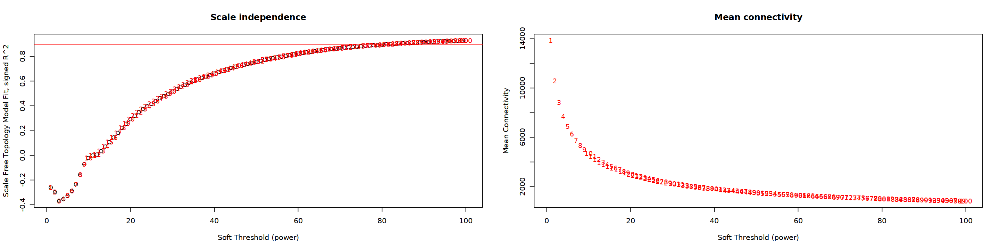

In [32]:
options(repr.plot.width=24, repr.plot.height=6)
par(mfrow = c(1,2));
cex1 = 0.9;

plot(sft$fitIndices[, 1],
     -sign(sft$fitIndices[, 3]) * sft$fitIndices[, 2],
     xlab = "Soft Threshold (power)",
     ylab = "Scale Free Topology Model Fit, signed R^2",
     main = paste("Scale independence")
)
text(sft$fitIndices[, 1],
     -sign(sft$fitIndices[, 3]) * sft$fitIndices[, 2],
     labels = powers, cex = cex1, col = "red"
)
abline(h = 0.90, col = "red")
plot(sft$fitIndices[, 1],
     sft$fitIndices[, 5],
     xlab = "Soft Threshold (power)",
     ylab = "Mean Connectivity",
     type = "n",
     main = paste("Mean connectivity")
)
text(sft$fitIndices[, 1],
     sft$fitIndices[, 5],
     labels = powers,
     cex = cex1, col = "red")

In [41]:
# Call the network topology analysis function
sft = pickSoftThreshold(
  y.list,             # <= Input data
  #blockSize = 30,
  powerVector = powers,
  verbose = 5
  )

pickSoftThreshold: will use block size 1835.
 pickSoftThreshold: calculating connectivity for given powers...
   ..working on genes 1 through 1835 of 24371
   ..working on genes 1836 through 3670 of 24371
   ..working on genes 3671 through 5505 of 24371
   ..working on genes 5506 through 7340 of 24371
   ..working on genes 7341 through 9175 of 24371
   ..working on genes 9176 through 11010 of 24371
   ..working on genes 11011 through 12845 of 24371
   ..working on genes 12846 through 14680 of 24371
   ..working on genes 14681 through 16515 of 24371
   ..working on genes 16516 through 18350 of 24371
   ..working on genes 18351 through 20185 of 24371
   ..working on genes 20186 through 22020 of 24371
   ..working on genes 22021 through 23855 of 24371
   ..working on genes 23856 through 24371 of 24371
    Power SFT.R.sq   slope truncated.R.sq mean.k. median.k. max.k.
1       1   0.9320  4.3800        0.94500   14900     16100  18000
2       2   0.8960  2.1500        0.91400   11300     12

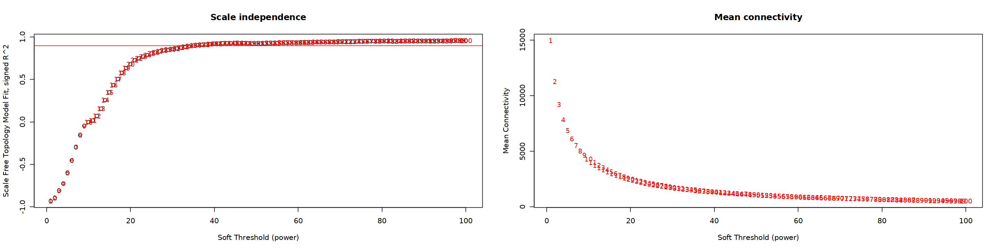

In [42]:
options(repr.plot.width=24, repr.plot.height=6)
par(mfrow = c(1,2));
cex1 = 0.9;

plot(sft$fitIndices[, 1],
     -sign(sft$fitIndices[, 3]) * sft$fitIndices[, 2],
     xlab = "Soft Threshold (power)",
     ylab = "Scale Free Topology Model Fit, signed R^2",
     main = paste("Scale independence")
)
text(sft$fitIndices[, 1],
     -sign(sft$fitIndices[, 3]) * sft$fitIndices[, 2],
     labels = powers, cex = cex1, col = "red"
)
abline(h = 0.90, col = "red")
plot(sft$fitIndices[, 1],
     sft$fitIndices[, 5],
     xlab = "Soft Threshold (power)",
     ylab = "Mean Connectivity",
     type = "n",
     main = paste("Mean connectivity")
)
text(sft$fitIndices[, 1],
     sft$fitIndices[, 5],
     labels = powers,
     cex = cex1, col = "red")

In [35]:
picked_power = 15
temp_cor <- cor       
cor <- WGCNA::cor         # Force it to use WGCNA cor function (fix a namespace conflict issue)
netwk <- blockwiseModules(y.list,                # <= input here

                          # == Adjacency Function ==
                          power = picked_power,                # <= power here
                          networkType = "signed",

                          # == Tree and Block Options ==
                          deepSplit = 2,
                          pamRespectsDendro = F,
                          # detectCutHeight = 0.75,
                          minModuleSize = 200,
                          maxBlockSize = 4000,

                          # == Module Adjustments ==
                          reassignThreshold = 0,
                          mergeCutHeight = 0.25,

                          # == TOM == Archive the run results in TOM file (saves time)
                          saveTOMs = T,
                          saveTOMFileBase = "ER",

                          # == Output Options
                          numericLabels = T,
                          verbose = 3)

 Calculating module eigengenes block-wise from all genes
   Flagging genes and samples with too many missing values...
    ..step 1
 ....pre-clustering genes to determine blocks..
   Projective K-means:
   ..k-means clustering..
   ..merging smaller clusters...
Block sizes:
gBlocks
   1    2    3    4    5    6    7    8 
3572 3502 3425 3390 3381 3052 2849 1200 
 ..Working on block 1 .
    TOM calculation: adjacency..
    ..will use 94 parallel threads.
     Fraction of slow calculations: 0.000000
    ..connectivity..
    ..matrix multiplication (system BLAS)..
    ..normalization..
    ..done.
   ..saving TOM for block 1 into file ER-block.1.RData
 ....clustering..
 ....detecting modules..
 ....calculating module eigengenes..
 ....checking kME in modules..
     ..removing 2 genes from module 3 because their KME is too low.
 ..Working on block 2 .
    TOM calculation: adjacency..
    ..will use 94 parallel threads.
     Fraction of slow calculations: 0.000000
    ..connectivity..
    .

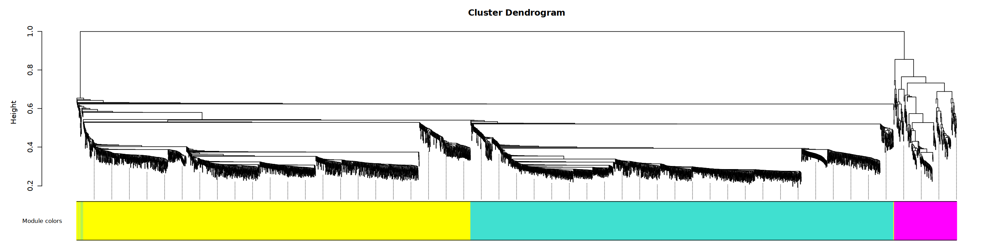

In [36]:
options(repr.plot.width=24, repr.plot.height=6)
# Convert labels to colors for plotting
mergedColors = labels2colors(netwk$colors)
# Plot the dendrogram and the module colors underneath
plotDendroAndColors(
  netwk$dendrograms[[1]],
  mergedColors[netwk$blockGenes[[1]]],
  "Module colors",
  dendroLabels = FALSE,
  hang = 0.03,
  addGuide = TRUE,
  guideHang = 0.05 )

In [37]:
head(netwk$colors[netwk$blockGenes[[1]]])

AT1G01070 AT1G01090 AT1G01220 AT1G01260 AT1G01305 AT1G01310 
        4         1         4         1         4         1

In [38]:
table(netwk$colors)


    0     1     2     3     4     5     6     7     8     9 
   60 12832  3748  2806  2148  1349   473   371   333   251 

In [39]:
module_df <- data.frame(
  gene_id = names(netwk$colors),
  colors = labels2colors(netwk$colors)
)

In [40]:
module_df[1:5,]

,gene_id,colors
,<chr>,<chr>
1,AT1G01010,pink
2,AT1G01020,turquoise
3,AT1G01030,turquoise
4,AT1G01040,turquoise
5,AT1G01050,blue


In [41]:
table(module_df$colors)


    black      blue     brown     green      grey   magenta      pink       red 
      371      3748      2806      1349        60       251       333       473 
turquoise    yellow 
    12832      2148 

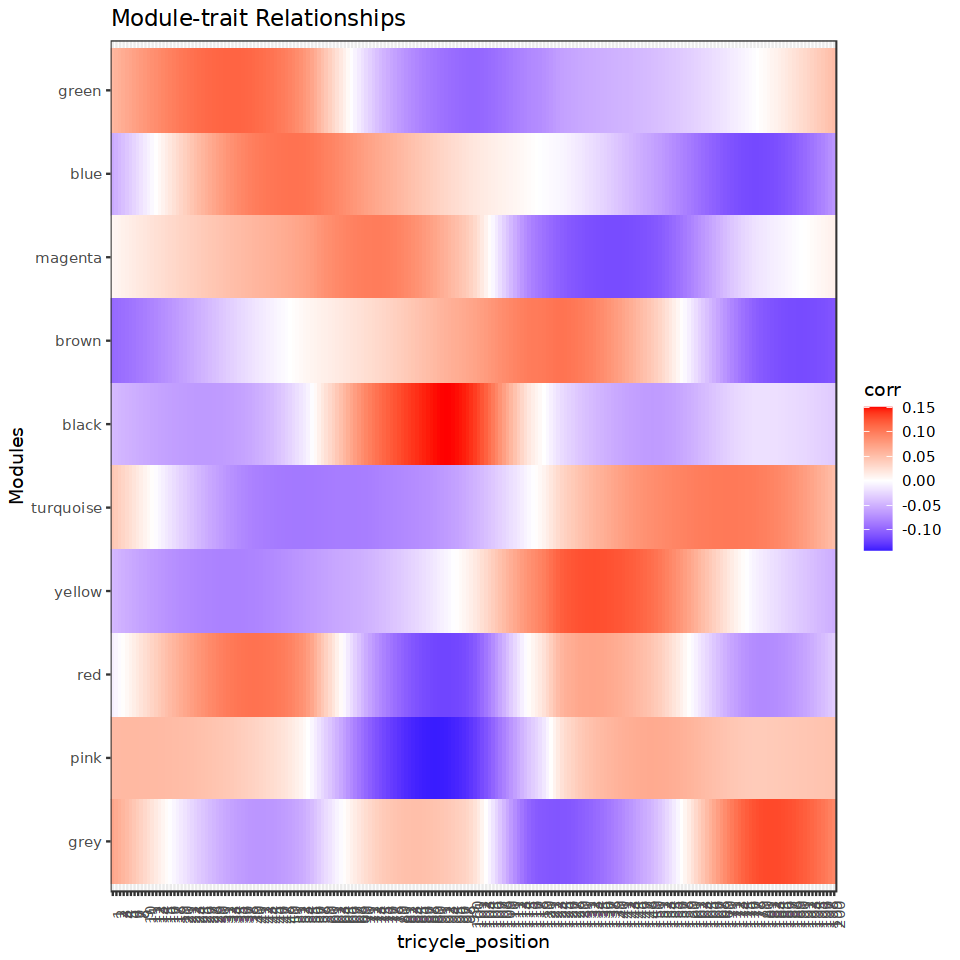

In [42]:
options(repr.plot.width=8, repr.plot.height=8)
# Get Module Eigengenes per cluster
MEs0 <- moduleEigengenes(y.list, mergedColors)$eigengenes

# Reorder modules so similar modules are next to each other
MEs0 <- orderMEs(MEs0)
module_order = names(MEs0) %>% gsub("ME","", .)

# Add treatment names
MEs0$treatment = row.names(MEs0)

# tidy & plot data
mME = MEs0 %>%
  pivot_longer(-treatment) %>%
  mutate(
    name = gsub("ME", "", name),
    name = factor(name, levels = module_order)
  )

#mME <- mME[-which(mME$name == "grey"),] 
mME$treatment <- factor(mME$treatment, levels = seq(1,200))
mME$tricycle_position <- mME$treatment
#mME$name <- factor(mME$name, levels = rev(c("green", "grey", "black", "blue", "brown", "turquoise", "yellow", "red", "pink", "magenta")))
mME$name <- factor(mME$name, levels = rev(c("green", "blue", "magenta", "brown", "black", "turquoise", "yellow", "red", "pink", "grey")))
mME$module <- as.character(mME$name)
#mME$module[which(mME$module=="green")]="G1-M1"
#mME$module[which(mME$module=="grey")]="G1-M2"
#mME$module[which(mME$module=="blue")]="G1-M3"
#mME$module[which(mME$module=="black")]="G1-M4"
#mME$module[which(mME$module=="brown")]="G1S-M5"
#mME$module[which(mME$module=="turquoise")]="G1S-M6"
#mME$module[which(mME$module=="yellow")]="S-M7"
#mME$module[which(mME$module=="magenta")]="G2M-M8"
#mME$module[which(mME$module=="red")]="G2MG1-M9"
#mME$module[which(mME$module=="pink")]="G1S-M10"
#mME$module[which(mME$module=="grey")]="Unassigned"
#mME$module <- factor(mME$module, levels = rev(c("G1-M1", "G1-M2", "G1-M3", "G1-M4", "G1S-M5", "G1S-M6", "S-M7", "G2M-M8", "G2MG1-M9", "G1S-M10", "Unassigned")))

mME %>% ggplot(., aes(x=tricycle_position, y=name, fill=value)) +
  geom_tile() +
  theme_bw() +
  scale_fill_gradient2(
    low = "blue",
    high = "red",
    mid = "white",
    midpoint = 0,
  #  limit = c(-1,1)
  ) +
  theme(axis.text.x = element_text(angle=90)) +
  labs(title = "Module-trait Relationships", y = "Modules", fill="corr")

## Module GO

In [43]:
## Prepare gene module list
module_sel <- select(module_df, gene_id, colors)
module_list <- split(module_sel, f=module_sel$colors)
#this makes list from long df of gene lists - TARGET is what we want to keep
module_list  <- lapply(module_list, function(x) x[names(x)=="gene_id"])
# convert each sublist into character and eliminate duplicates
module_list  <- lapply(module_list, function(x) as.character(unique(x$gene_id)))

In [44]:
length(module_list)

[1] 10

In [45]:
cluster_GO <- gost(module_list, organism = "athaliana", correction_method = "fdr", significant = F, multi_query = F)

cluster_GO_df <- cluster_GO[[1]]

cluster_GO_sig <- filter(cluster_GO_df, p_value<=0.01)

# top  terms for each cluster

cluster_GO_sig %>%
  filter(source=="GO:BP", intersection_size>=4) %>%
  group_by(query) %>%
  top_n(5, wt = -p_value) %>%
  arrange(desc(p_value)) -> top_GO

GO_n <- cluster_GO_sig %>%
  filter(source=="GO:BP", intersection_size>=4) %>%
  group_by(term_id) %>%
  tally() %>%
  arrange(desc(n))


GO_n <- dplyr::rename(GO_n, "n_clusters"=n)

cluster_GO_sig_n <- left_join(cluster_GO_sig, GO_n)

# get all terms for the top ones so that all clusters have values

top_GO_all <- filter(cluster_GO_df, term_id %in% top_GO$term_id)


#spread and plot


top_GO_sel <- select(top_GO_all, query, p_value, term_id, term_name)

spread_GO <- spread(top_GO_sel, key = query, p_value)

spread_GO[is.na(spread_GO)] <- 1

spread_GO_m <- as.matrix(-log10(spread_GO[3:ncol(spread_GO)]))
rownames(spread_GO_m) <- spread_GO$term_name

Joining with `by = join_by(term_id)`


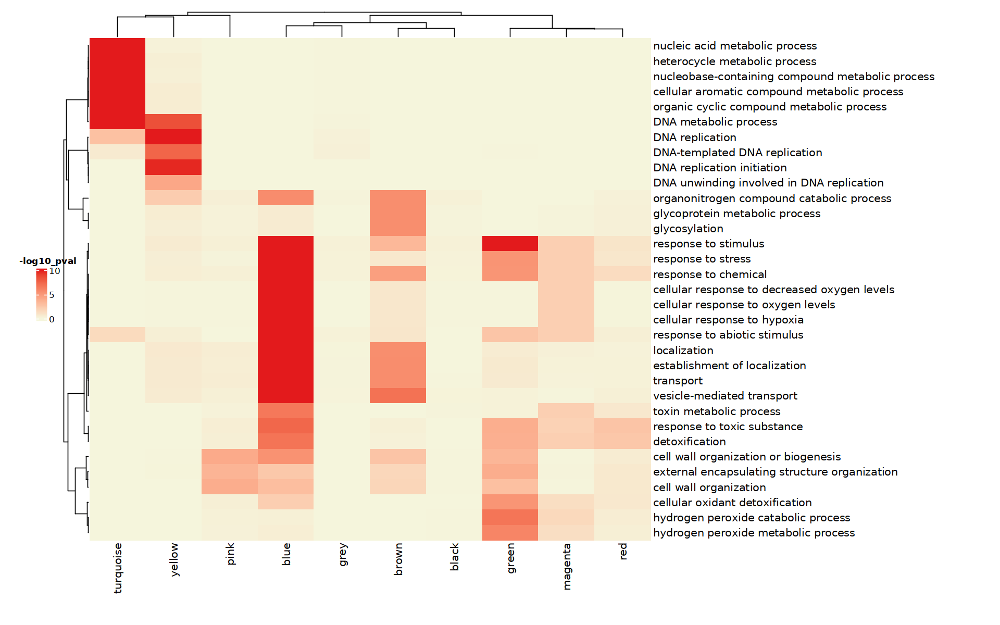

In [46]:
options(repr.plot.width = 16, repr.plot.height = 10)

GO_hm <- Heatmap(spread_GO_m, 
                 name = "-log10_pval", 
                 heatmap_legend_param = list(title_position="topcenter", color_bar = "continuous"), 
                 col = colorRamp2(c(0, 10), 
                                  c("beige", "#e31a1c")), 
                 cluster_rows = T,
                 cluster_columns = T, 
                 use_raster= FALSE, 
                 show_column_names = TRUE, 
                 show_row_names = TRUE, 
                 show_row_dend = TRUE, 
                 show_column_dend = TRUE, 
                 clustering_distance_rows = "pearson",
                 clustering_distance_columns = "pearson", 
                 row_names_gp = gpar(fontsize = 12)) 


# padding - bottom, left, top, right
draw(GO_hm, padding = unit(c(15, 15, 5, 80), "mm"), heatmap_legend_side = "left")

## Remove grey, black, red that have no significant GO terms

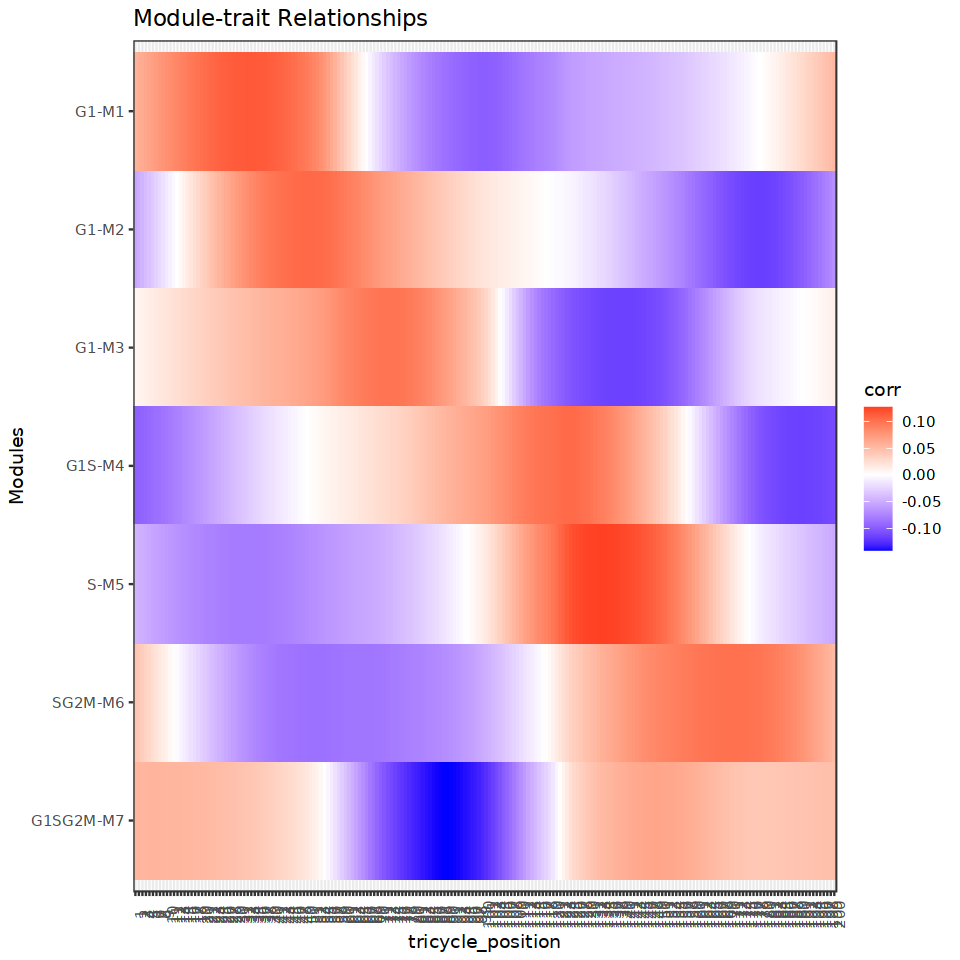

In [47]:
options(repr.plot.width=8, repr.plot.height=8)
# Get Module Eigengenes per cluster
MEs0 <- moduleEigengenes(y.list, mergedColors)$eigengenes

# Reorder modules so similar modules are next to each other
MEs0 <- orderMEs(MEs0)
module_order = names(MEs0) %>% gsub("ME","", .)

# Add treatment names
MEs0$treatment = row.names(MEs0)

# tidy & plot data
mME = MEs0 %>%
  pivot_longer(-treatment) %>%
  mutate(
    name = gsub("ME", "", name),
    name = factor(name, levels = module_order)
  )

mME <- mME[-which(mME$name == "grey"),] 
mME <- mME[-which(mME$name == "black"),] 
mME <- mME[-which(mME$name == "red"),] 
mME$treatment <- factor(mME$treatment, levels = seq(1,200))
mME$tricycle_position <- mME$treatment
#mME$name <- factor(mME$name, levels = rev(c("green", "grey", "black", "blue", "brown", "turquoise", "yellow", "red", "pink", "magenta")))
mME$name <- factor(mME$name, levels = rev(c("green", "blue", "magenta", "brown", "yellow", "turquoise", "pink")))
mME$module <- as.character(mME$name)
mME$module[which(mME$module=="green")]="G1-M1"
mME$module[which(mME$module=="blue")]="G1-M2"
mME$module[which(mME$module=="magenta")]="G1-M3"
mME$module[which(mME$module=="brown")]="G1S-M4"
mME$module[which(mME$module=="yellow")]="S-M5"
mME$module[which(mME$module=="turquoise")]="SG2M-M6"
mME$module[which(mME$module=="pink")]="G1SG2M-M7"
#mME$module[which(mME$module=="grey")]="Unassigned"
mME$module <- factor(mME$module, levels = rev(c("G1-M1", "G1-M2", "G1-M3", "G1S-M4", "S-M5", "SG2M-M6", "G1SG2M-M7")))

mME %>% ggplot(., aes(x=tricycle_position, y=module, fill=value)) +
  geom_tile() +
  theme_bw() +
  scale_fill_gradient2(
    low = "blue",
    high = "red",
    mid = "white",
    midpoint = 0,
  #  limit = c(-1,1)
  ) +
  theme(axis.text.x = element_text(angle=90)) +
  labs(title = "Module-trait Relationships", y = "Modules", fill="corr")

In [48]:
head(MEs0)

,MEblack,MEblue,MEmagenta,MEgreen,MEpink,MEred,MEturquoise,MEbrown,MEyellow,MEgrey,treatment
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,-0.04454885,-0.05452611,0.006843296,0.05611375,0.05428086,-0.010026208,0.04446282,-0.09775454,-0.04580734,0.06957692,1
2,-0.04576690,-0.05020672,0.008314627,0.05891169,0.05438284,-0.006207818,0.04070738,-0.09649222,-0.04771008,0.06551651,2
3,-0.04698306,-0.04581221,0.009782074,0.06168954,0.05446494,-0.002329031,0.03690319,-0.09514018,-0.04957618,0.06136249,3
4,-0.04819342,-0.04135042,0.011245116,0.06444308,0.05452621,0.001601661,0.03305646,-0.09370235,-0.05140420,0.05712475,4
5,-0.04939405,-0.03682921,0.012703230,0.06716811,0.05456574,0.005575763,0.02917340,-0.09218264,-0.05319266,0.05281320,5
6,-0.05058103,-0.03225641,0.014155894,0.06986039,0.05458258,0.009584780,0.02526021,-0.09058499,-0.05494012,0.04843774,6


In [49]:
module_df$colors <- factor(module_df$colors, levels=c("green", "blue", "magenta", "brown", "yellow", "turquoise", "pink"))
table(module_df$colors)


    green      blue   magenta     brown    yellow turquoise      pink 
     1349      3748       251      2806      2148     12832       333 

In [50]:
module_df$module <- as.character(module_df$colors)
module_df$module[which(module_df$module=="green")]="G1-M1"
module_df$module[which(module_df$module=="blue")]="G1-M2"
module_df$module[which(module_df$module=="magenta")]="G1-M3"
module_df$module[which(module_df$module=="brown")]="G1S-M4"
module_df$module[which(module_df$module=="yellow")]="S-M5"
module_df$module[which(module_df$module=="turquoise")]="SG2M-M6"
module_df$module[which(module_df$module=="pink")]="G1SG2M-M7"

module_df$module <- factor(module_df$module, levels = c("G1-M1", "G1-M2", "G1-M3", "G1S-M4", "S-M5", "SG2M-M6", "G1SG2M-M7"))

table(module_df$module)



    G1-M1     G1-M2     G1-M3    G1S-M4      S-M5   SG2M-M6 G1SG2M-M7 
     1349      3748       251      2806      2148     12832       333 

In [51]:
module_df$BES_up <- rep("No",nrow(module_df))
module_df$BES_up[match(GL2up, module_df$gene_id)[!is.na(match(GL2up, module_df$gene_id))]]="Yes"
module_df$BES_down <- rep("No",nrow(module_df))
module_df$BES_down[match(GL2down, module_df$gene_id)[!is.na(match(GL2down, module_df$gene_id))]]="Yes"
module_df$MYB3R4 <- rep("No",nrow(module_df))
module_df$MYB3R4[match(GL3, module_df$gene_id)[!is.na(match(GL3, module_df$gene_id))]]="Yes"

In [52]:
## BES_up
round((table(module_df$module,module_df$BES_up)/as.numeric(table(module_df$module)))[,2]/sum((table(module_df$module,module_df$BES_up)/as.numeric(table(module_df$module)))[,2]),2)

G1-M1     G1-M2     G1-M3    G1S-M4      S-M5   SG2M-M6 G1SG2M-M7 
     0.22      0.30      0.06      0.15      0.06      0.07      0.16

In [53]:
table(module_df$module,module_df$BES_up)

           
               No   Yes
  G1-M1      1272    77
  G1-M2      3454   294
  G1-M3       247     4
  G1S-M4     2696   110
  S-M5       2116    32
  SG2M-M6   12604   228
  G1SG2M-M7   319    14

In [54]:
## BES_down
round((table(module_df$module,module_df$BES_down)/as.numeric(table(module_df$module)))[,2]/sum((table(module_df$module,module_df$BES_down)/as.numeric(table(module_df$module)))[,2]),2)

G1-M1     G1-M2     G1-M3    G1S-M4      S-M5   SG2M-M6 G1SG2M-M7 
     0.15      0.20      0.14      0.14      0.10      0.11      0.15

In [55]:
table(module_df$module,module_df$BES_down)

           
               No   Yes
  G1-M1      1296    53
  G1-M2      3554   194
  G1-M3       242     9
  G1S-M4     2705   101
  S-M5       2092    56
  SG2M-M6   12460   372
  G1SG2M-M7   320    13

In [56]:
## MYB3R4
round((table(module_df$module,module_df$MYB3R4)/as.numeric(table(module_df$module)))[,2]/sum((table(module_df$module,module_df$MYB3R4)/as.numeric(table(module_df$module)))[,2]),2)

G1-M1     G1-M2     G1-M3    G1S-M4      S-M5   SG2M-M6 G1SG2M-M7 
     0.21      0.12      0.13      0.12      0.03      0.30      0.09

In [57]:
table(module_df$module,module_df$MYB3R4)

           
               No   Yes
  G1-M1      1340     9
  G1-M2      3734    14
  G1-M3       250     1
  G1S-M4     2795    11
  S-M5       2146     2
  SG2M-M6   12710   122
  G1SG2M-M7   332     1

In [58]:
write.csv(module_df, "./tradeseq/All_genes_Atrichoblast_tricycle_module_power15.csv")

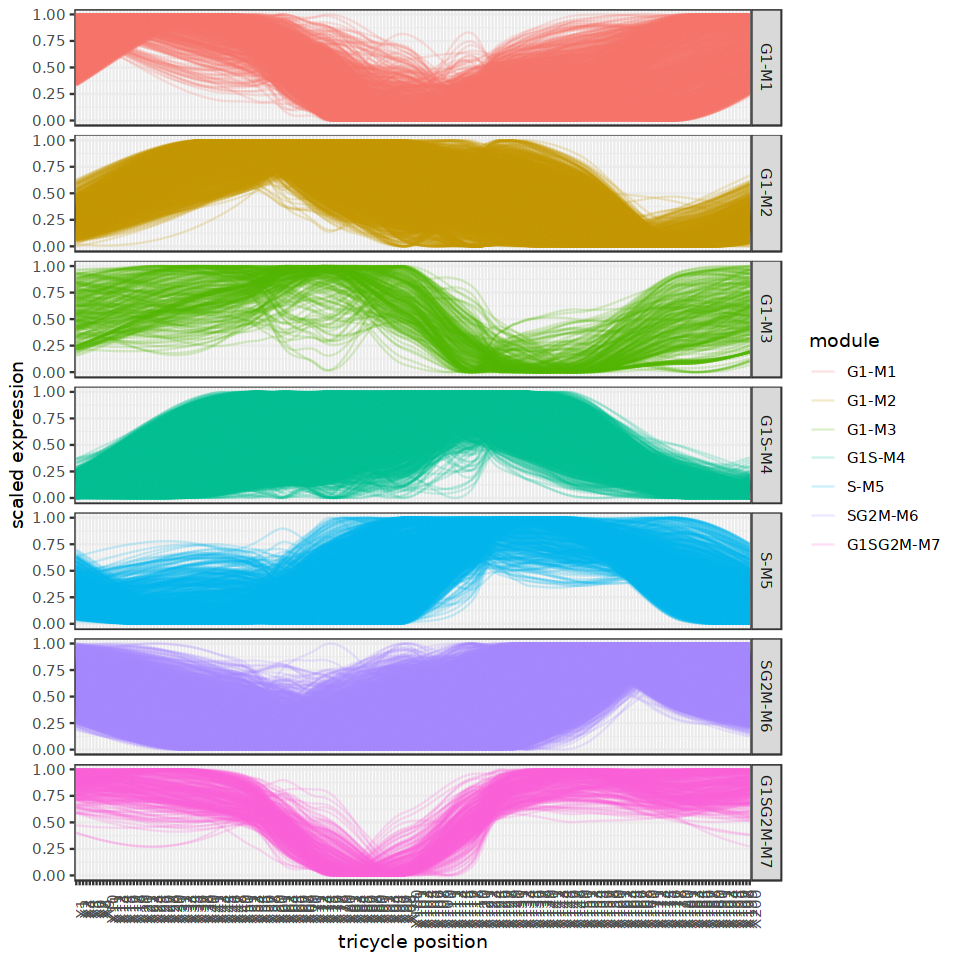

In [59]:
# pick out a few modules of interest here
modules_of_interest = c("G1-M1", "G1-M2", "G1-M3", "G1S-M4", "S-M5", "SG2M-M6", "G1SG2M-M7")

# Pull out list of genes in that module
submod = module_df %>%
  subset(module %in% modules_of_interest)

row.names(module_df) = module_df$gene_id

# Get normalized expression for those genes
expr_normalized <- t(apply(y.list,2, function(x){(x-min(x))/(max(x)-min(x))}))

subexpr = expr_normalized[submod$gene_id,]

submod_df = data.frame(subexpr) %>%
  mutate(
    gene_id = row.names(.)
  ) %>%
  pivot_longer(-gene_id) %>%
  mutate(
    module = module_df[gene_id,]$module
  )

submod_df$name <- factor(submod_df$name, levels = paste0("X",seq(1,200)))
submod_df$module <- factor(submod_df$module, levels =c("G1-M1", "G1-M2", "G1-M3", "G1S-M4", "S-M5", "SG2M-M6", "G1SG2M-M7"))

submod_df %>% ggplot(., aes(x=name, y=value, group=gene_id)) +
  geom_line(aes(color = module),
            alpha = 0.2) +
  theme_bw() +
  theme(
    axis.text.x = element_text(angle = 90)
  ) +
  facet_grid(rows = vars(module)) +
  labs(x = "tricycle position",
       y = "scaled expression")

In [60]:
## DWF4 (AT3G50660)
mds <- module_df %>% filter((BES_up == "Yes") & (module=="G1-M2") | (gene_id == "AT3G50660") )

In [61]:
length(mds$gene_id)

[1] 295

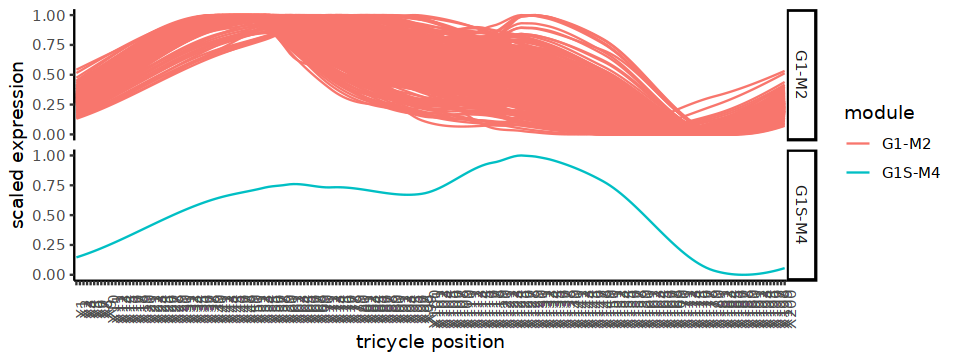

In [62]:
# Get normalized expression for those genes
expr_normalized <- t(apply(y.list,2, function(x){(x-min(x))/(max(x)-min(x))}))

subexpr = expr_normalized[mds$gene_id,]

submod_df = data.frame(subexpr) %>%
  mutate(
    gene_id = row.names(.)
  ) %>%
  pivot_longer(-gene_id) %>%
  mutate(
    module = mds[gene_id,]$module
  )

submod_df$name <- factor(submod_df$name, levels = paste0("X",seq(1,200)))
submod_df$module <- factor(submod_df$module, levels =c("G1-M1", "G1-M2", "G1-M3", "G1S-M4", "S-M5", "SG2M-M6", "G1SG2M-M7"))

options(repr.plot.width=8, repr.plot.height=3)
submod_df %>% ggplot(., aes(x=name, y=value, group=gene_id)) +
  geom_line(aes(color = module),
            alpha = 1) +
  theme_classic() +
  theme(
    axis.text.x = element_text(angle = 90)
  ) +
  facet_grid(rows = vars(module)) +
  labs(x = "tricycle position",
       y = "scaled expression")

## Module Membership

In [63]:
ME <- moduleEigengenes(y.list, mergedColors)$eigengenes

In [64]:
head(ME)

,MEblack,MEblue,MEbrown,MEgreen,MEgrey,MEmagenta,MEpink,MEred,MEturquoise,MEyellow
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,-0.04454885,-0.05452611,-0.09775454,0.05611375,0.06957692,0.006843296,0.05428086,-0.010026208,0.04446282,-0.04580734
2,-0.04576690,-0.05020672,-0.09649222,0.05891169,0.06551651,0.008314627,0.05438284,-0.006207818,0.04070738,-0.04771008
3,-0.04698306,-0.04581221,-0.09514018,0.06168954,0.06136249,0.009782074,0.05446494,-0.002329031,0.03690319,-0.04957618
4,-0.04819342,-0.04135042,-0.09370235,0.06444308,0.05712475,0.011245116,0.05452621,0.001601661,0.03305646,-0.05140420
5,-0.04939405,-0.03682921,-0.09218264,0.06716811,0.05281320,0.012703230,0.05456574,0.005575763,0.02917340,-0.05319266
6,-0.05058103,-0.03225641,-0.09058499,0.06986039,0.04843774,0.014155894,0.05458258,0.009584780,0.02526021,-0.05494012


In [65]:
ME <- ME[,c("MEgreen","MEblue","MEmagenta","MEbrown","MEyellow","MEturquoise","MEpink")]

In [66]:
colnames(ME)[which(colnames(ME)=="green")]="G1-M1"
colnames(ME)[which(colnames(ME)=="blue")]="G1-M2"
colnames(ME)[which(colnames(ME)=="magenta")]="G1-M3"
colnames(ME)[which(colnames(ME)=="brown")]="G1S-M4"
colnames(ME)[which(colnames(ME)=="yellow")]="S-M5"
colnames(ME)[which(colnames(ME)=="turquoise")]="SG2M-M6"
colnames(ME)[which(colnames(ME)=="pink")]="G1SG2M-M7"


In [67]:
head(ME)

,MEgreen,MEblue,MEmagenta,MEbrown,MEyellow,MEturquoise,MEpink
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.05611375,-0.05452611,0.006843296,-0.09775454,-0.04580734,0.04446282,0.05428086
2,0.05891169,-0.05020672,0.008314627,-0.09649222,-0.04771008,0.04070738,0.05438284
3,0.06168954,-0.04581221,0.009782074,-0.09514018,-0.04957618,0.03690319,0.05446494
4,0.06444308,-0.04135042,0.011245116,-0.09370235,-0.05140420,0.03305646,0.05452621
5,0.06716811,-0.03682921,0.012703230,-0.09218264,-0.05319266,0.02917340,0.05456574
6,0.06986039,-0.03225641,0.014155894,-0.09058499,-0.05494012,0.02526021,0.05458258


In [68]:
datKME = signedKME(y.list[,module_df$gene_id[which(module_df$module != "Unassigned")]], ME, outputColumnName = "kME")

In [69]:
colnames(datKME) <- paste0("kME_",c("G1-M1", "G1-M2", "G1-M3", "G1S-M4", "S-M5", "SG2M-M6", "G1SG2M-M7"))

In [70]:
head(datKME)

,kME_G1-M1,kME_G1-M2,kME_G1-M3,kME_G1S-M4,kME_S-M5,kME_SG2M-M6,kME_G1SG2M-M7
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AT1G01010,0.4446505,-0.2497083,-0.6220967,-0.15433043,0.2861951,0.4743865,0.9157921
AT1G01020,-0.5388701,-0.8698134,-0.9066985,0.09839597,0.8410181,0.9202853,0.3868128
AT1G01030,-0.3397021,-0.9816480,-0.7924996,-0.22593319,0.6174643,0.9842161,0.4952128
AT1G01040,-0.3463311,-0.9946677,-0.6863214,-0.30120903,0.5310670,0.9626965,0.4219701
AT1G01050,0.1312750,0.9800524,0.7104888,0.42277394,-0.4523316,-0.9839351,-0.6223718
AT1G01060,-0.1620868,-0.9286784,-0.8340280,-0.26976451,0.5949051,0.9946174,0.6871412


In [71]:
write.csv(left_join(rownames_to_column(datKME), rownames_to_column(module_df), by=c("rowname")), "./tradeseq/All_genes_Atrichoblast_tricycle_module_membership_power15.csv")

## Export Networks (Obsolete)

In [140]:
genes_of_interest = module_df %>%
  subset(module %in% modules_of_interest[-11])

expr_of_interest = t(y.list)[genes_of_interest$gene_id,]
expr_of_interest[1:5,1:5]
#>                       B-3      B-4      B-5      L-3      L-4
#> AC186512.3_FG001 6.901539 7.389644 6.975945 6.859593 7.370816
#> AC186512.3_FG007 7.919688 7.754506 7.670946 7.417760 7.988427
#> AC190623.3_FG001 6.575155 7.170788 7.438024 8.223261 8.008850
#> AC196475.3_FG004 6.054319 6.439899 6.424540 5.815344 6.565299
#> AC196475.3_FG005 6.194406 5.872273 6.207174 6.499828 6.314952

# Only recalculate TOM for modules of interest (faster, altho there's some online discussion if this will be slightly off)
TOM = TOMsimilarityFromExpr(t(expr_of_interest),
                            power = picked_power)
#> TOM calculation: adjacency..
#> ..will use 4 parallel threads.
#>  Fraction of slow calculations: 0.000000
#> ..connectivity..
#> ..matrix multiplication (system BLAS)..
#> ..normalization..
#> ..done.

# Add gene names to row and columns
row.names(TOM) = row.names(expr_of_interest)
colnames(TOM) = row.names(expr_of_interest)

AT1G01010,0.03437418,0.03445125,0.03452833,0.03460526,0.03468185
AT1G01020,0.16125047,0.15936069,0.15746179,0.15555653,0.15364767
AT1G01030,0.01163936,0.01141413,0.01118563,0.01095425,0.01072038
AT1G01040,0.02817155,0.02762631,0.02707317,0.02651315,0.02594726
AT1G01050,1.13815937,1.14230433,1.14652946,1.15082737,1.15519066


TOM calculation: adjacency..
..will use 94 parallel threads.
 Fraction of slow calculations: 0.000000
..connectivity..
..matrix multiplication (system BLAS)..
..normalization..
..done.


In [141]:
edge_list = data.frame(TOM) %>%
  mutate(
    gene1 = row.names(.)
  ) %>%
  pivot_longer(-gene1) %>%
  dplyr::rename(gene2 = name, correlation = value) %>%
  unique() %>%
  subset(!(gene1==gene2)) %>%
  mutate(
    module1 = module_df[gene1,]$module,
    module2 = module_df[gene2,]$module
  )

head(edge_list)
#> # A tibble: 6 x 5
#>   gene1            gene2            correlation module1   module2  
#>   <chr>            <chr>                  <dbl> <chr>     <chr>    
#> 1 AC186512.3_FG001 AC186512.3_FG007      0.0238 turquoise turquoise
#> 2 AC186512.3_FG001 AC190623.3_FG001      0.0719 turquoise turquoise
#> 3 AC186512.3_FG001 AC196475.3_FG004      0.143  turquoise turquoise
#> 4 AC186512.3_FG001 AC196475.3_FG005      0.0117 turquoise turquoise
#> 5 AC186512.3_FG001 AC196489.3_FG002      0.0181 turquoise turquoise
#> 6 AC186512.3_FG001 AC198481.3_FG004      0.0240 turquoise turquoise

# Export Network file to be read into Cytoscape, VisANT, etc
write_delim(edge_list,
            file = "./tradeseq/Module_network_edgelist.tsv",
            delim = "\t")

gene1,gene2,correlation,module1,module2
<chr>,<chr>,<dbl>,<fct>,<fct>
AT1G01010,AT1G01020,1.263899e-05,G2MG1-M9,S-M7
AT1G01010,AT1G01030,1.360577e-05,G2MG1-M9,S-M7
AT1G01010,AT1G01040,1.104410e-06,G2MG1-M9,S-M7
AT1G01010,AT1G01050,6.631369e-05,G2MG1-M9,G1-M2
AT1G01010,AT1G01060,7.753520e-04,G2MG1-M9,S-M7
AT1G01010,AT1G01070,3.555517e-08,G2MG1-M9,S-M7


In [142]:
## 30G too large
nrow(edge_list)

[1] 589639806

In [143]:
summary(edge_list$correlation)

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
0.0000000 0.0000138 0.0056340 0.0982158 0.1385098 0.6644113 

In [157]:
edge_list_cor04 <- edge_list %>% filter(correlation>=0.4)

In [158]:
## 2.6G acceptable
nrow(edge_list_cor04)

[1] 52641560

In [159]:
write_delim(edge_list_cor04,
            file = "./tradeseq/Module_network_edgelist_cor04.tsv",
            delim = "\t")

In [160]:
head(edge_list_cor04)

gene1,gene2,correlation,module1,module2
<chr>,<chr>,<dbl>,<fct>,<fct>
AT1G01020,AT1G01090,0.4742238,S-M7,S-M7
AT1G01020,AT1G01130,0.4721234,S-M7,S-M7
AT1G01020,AT1G01260,0.4529889,S-M7,S-M7
AT1G01020,AT1G01290,0.5408273,S-M7,S-M7
AT1G01020,AT1G01370,0.4995471,S-M7,S-M7
AT1G01020,AT1G01480,0.4947831,S-M7,S-M7


In [161]:
table(edge_list_cor04$module1)


     G1-M1      G1-M2      G1-M3      G1-M4     G1S-M5     G1S-M6       S-M7 
     60171    8334861     179501       4033    1002022      49934   40704082 
    G2M-M8   G2MG1-M9    G1S-M10 Unassigned 
   2295271      11613         72          0 

In [162]:
table(edge_list_cor04$module2)


     G1-M1      G1-M2      G1-M3      G1-M4     G1S-M5     G1S-M6       S-M7 
     60171    8334861     179501       4033    1002022      49934   40704082 
    G2M-M8   G2MG1-M9    G1S-M10 Unassigned 
   2295271      11613         72          0 

## GeneOverlap
## Modules vs. signal interested

In [72]:
module_df <- read.csv("./tradeseq/All_genes_Atrichoblast_tricycle_module_power15.csv", row.names=1)

In [73]:
#AR <- read.csv("./tradeseq/Auxin_responsive_genes.csv")
#AR <- AR[AR$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
#AR_up <- read.csv("./tradeseq/IAA_UP.csv")
AR_up <- read.csv("./tradeseq/IAA_UP_Mates_Fendrych.csv")
AR_up <- intersect(unique(gsub("..$","",AR_up$GeneID)), rownames(rc.integrated@assays$SCT@data))
#AR_up <- AR_up[AR_up$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
#AR_down <- read.csv("./tradeseq/IAA_DN.csv")
AR_down <- read.csv("./tradeseq/IAA_DN_Mates_fendrych.csv")
AR_down <- intersect(unique(gsub("..$","",AR_down$GeneID)), rownames(rc.integrated@assays$SCT@data))
#AR_down <- AR_down[AR_down$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
ABAR_up <- read.csv("./tradeseq/ABA_UP.csv")
ABAR_up <- ABAR_up[ABAR_up$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
ABAR_down <- read.csv("./tradeseq/ABA_DN.csv")
ABAR_down <- ABAR_down[ABAR_down$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
ACCR_up <- read.csv("./tradeseq/ACC_UP.csv")
ACCR_up <- ACCR_up[ACCR_up$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
ACCR_down <- read.csv("./tradeseq/ACC_DN.csv")
ACCR_down <- ACCR_down[ACCR_down$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
CR <- read.csv("./tradeseq/CK_response_genes_bert.csv")
CR <- CR[CR$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
CR_up <- CR %>% filter(Regulation == "Up")
CR_up <- CR_up$GeneID
CR_down <- CR %>% filter(Regulation == "Down")
CR_down <- CR_down$GeneID
GAR_up <- read.csv("./tradeseq/GA_UP.csv")
GAR_up <- GAR_up[GAR_up$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
GAR_down <- read.csv("./tradeseq/GA_DN.csv")
GAR_down <- GAR_down[GAR_down$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
SAR_up <- read.csv("./tradeseq/SA_UP.csv")
SAR_up <- SAR_up[SAR_up$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
SAR_down <- read.csv("./tradeseq/SA_DN.csv")
SAR_down <- SAR_down[SAR_down$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
#JAR <- read.csv("./tradeseq/Hickman_2017_JA.csv")
#JAR <- JAR[JAR$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
JAR_up <- read.csv("./tradeseq/JA_UP.csv")
JAR_up <- JAR_up[JAR_up$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
JAR_down <- read.csv("./tradeseq/JA_DN.csv")
JAR_down <- JAR_down[JAR_down$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
SALT <- read.csv("./tradeseq/salt.csv")
SALT <- SALT[SALT$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
DRUT <- read.csv("./tradeseq/Drought.csv")
DRUT <- DRUT[DRUT$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
HEAT <- read.csv("./tradeseq/heat.csv")
HEAT <- HEAT[HEAT$GeneID %in% rownames(rc.integrated@assays$SCT@data),]
COLD <- read.csv("./tradeseq/Thomashow_cold.csv")
COLD <- COLD[COLD$GeneID %in% rownames(rc.integrated@assays$SCT@data),]


In [74]:
module_df$AR_up <- rep("No",nrow(module_df))
module_df$AR_up[match(AR_up, module_df$gene_id)[!is.na(match(AR_up, module_df$gene_id))]]="Yes"
module_df$AR_down <- rep("No",nrow(module_df))
module_df$AR_down[match(AR_down, module_df$gene_id)[!is.na(match(AR_down, module_df$gene_id))]]="Yes"
module_df$CR_up <- rep("No",nrow(module_df))
module_df$CR_up[match(CR_up, module_df$gene_id)[!is.na(match(CR_up, module_df$gene_id))]]="Yes"
module_df$CR_down <- rep("No",nrow(module_df))
module_df$CR_down[match(CR_down, module_df$gene_id)[!is.na(match(CR_down, module_df$gene_id))]]="Yes"
module_df$ABAR_up <- rep("No",nrow(module_df))
module_df$ABAR_up[match(CR_up, module_df$gene_id)[!is.na(match(ABAR_up, module_df$gene_id))]]="Yes"
module_df$ABAR_down <- rep("No",nrow(module_df))
module_df$ABAR_down[match(ABAR_down, module_df$gene_id)[!is.na(match(ABAR_down, module_df$gene_id))]]="Yes"
module_df$ACCR_up <- rep("No",nrow(module_df))
module_df$ACCR_up[match(ACCR_up, module_df$gene_id)[!is.na(match(ACCR_up, module_df$gene_id))]]="Yes"
module_df$ACCR_down <- rep("No",nrow(module_df))
module_df$ACCR_down[match(ACCR_down, module_df$gene_id)[!is.na(match(ACCR_down, module_df$gene_id))]]="Yes"
module_df$GAR_up <- rep("No",nrow(module_df))
module_df$GAR_up[match(GAR_up, module_df$gene_id)[!is.na(match(GAR_up, module_df$gene_id))]]="Yes"
module_df$GAR_down <- rep("No",nrow(module_df))
module_df$GAR_down[match(GAR_down, module_df$gene_id)[!is.na(match(GAR_down, module_df$gene_id))]]="Yes"
module_df$SAR_up <- rep("No",nrow(module_df))
module_df$SAR_up[match(SAR_up, module_df$gene_id)[!is.na(match(SAR_up, module_df$gene_id))]]="Yes"
module_df$SAR_down <- rep("No",nrow(module_df))
module_df$SAR_down[match(SAR_down, module_df$gene_id)[!is.na(match(SAR_down, module_df$gene_id))]]="Yes"
#module_df$JAR <- rep("No",nrow(module_df))
#module_df$JAR[match(JAR, module_df$gene_id)[!is.na(match(JAR, module_df$gene_id))]]="Yes"
module_df$JAR_up <- rep("No",nrow(module_df))
module_df$JAR_up[match(JAR_up, module_df$gene_id)[!is.na(match(JAR_up, module_df$gene_id))]]="Yes"
module_df$JAR_down <- rep("No",nrow(module_df))
module_df$JAR_down[match(JAR_down, module_df$gene_id)[!is.na(match(JAR_down, module_df$gene_id))]]="Yes"
module_df$SALT <- rep("No",nrow(module_df))
module_df$SALT[match(SALT, module_df$gene_id)[!is.na(match(SALT, module_df$gene_id))]]="Yes"
module_df$DRUT <- rep("No",nrow(module_df))
module_df$DRUT[match(DRUT, module_df$gene_id)[!is.na(match(DRUT, module_df$gene_id))]]="Yes"
module_df$HEAT <- rep("No",nrow(module_df))
module_df$HEAT[match(HEAT, module_df$gene_id)[!is.na(match(HEAT, module_df$gene_id))]]="Yes"
module_df$COLD <- rep("No",nrow(module_df))
module_df$COLD[match(COLD, module_df$gene_id)[!is.na(match(COLD, module_df$gene_id))]]="Yes"


In [75]:
head(module_df)

,gene_id,colors,module,BES_up,BES_down,MYB3R4,AR_up,AR_down,CR_up,CR_down,...,GAR_up,GAR_down,SAR_up,SAR_down,JAR_up,JAR_down,SALT,DRUT,HEAT,COLD
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,AT1G01010,pink,G1SG2M-M7,No,No,No,No,No,No,No,...,No,No,Yes,No,No,No,No,No,Yes,No
2,AT1G01020,turquoise,SG2M-M6,No,No,No,No,No,No,No,...,No,No,No,No,No,No,No,No,No,No
3,AT1G01030,turquoise,SG2M-M6,No,No,No,No,No,No,No,...,No,No,No,No,No,No,No,No,Yes,No
4,AT1G01040,turquoise,SG2M-M6,No,No,No,No,No,No,No,...,No,No,No,No,No,No,No,No,No,No
5,AT1G01050,blue,G1-M2,No,No,No,No,No,No,No,...,No,No,No,No,No,Yes,No,No,No,No
6,AT1G01060,turquoise,SG2M-M6,No,No,No,Yes,No,No,No,...,No,No,No,No,No,No,Yes,Yes,Yes,Yes


In [76]:
## Prepare gene module list
module_sel <- select(module_df, gene_id, module)
module_list <- split(module_sel, f=module_sel$module)
#this makes list from long df of gene lists - TARGET is what we want to keep
module_list  <- lapply(module_list, function(x) x[names(x)=="gene_id"])
# convert each sublist into character and eliminate duplicates
module_list  <- lapply(module_list, function(x) as.character(unique(x$gene_id)))

In [77]:
module_list <- module_list[c("G1-M1", "G1-M2", "G1-M3", "G1S-M4", "S-M5", "SG2M-M6", "G1SG2M-M7")]

In [78]:
## Prepare gene lists to intersect with module
BES_up <- module_df$gene_id[which(module_df$BES_up=="Yes")]
BES_down <- module_df$gene_id[which(module_df$BES_down=="Yes")]
MYB3R4 <- module_df$gene_id[which(module_df$MYB3R4=="Yes")]
g_list <- list("BES_up"=BES_up, "BES_down"=BES_down, "MYB3R4"=MYB3R4)

In [79]:
## GeneOverlap 

# number of integrated features

genome_size <- 26058L

#compare all lists
gom.self <- newGOM(module_list, g_list, genome.size=genome_size)

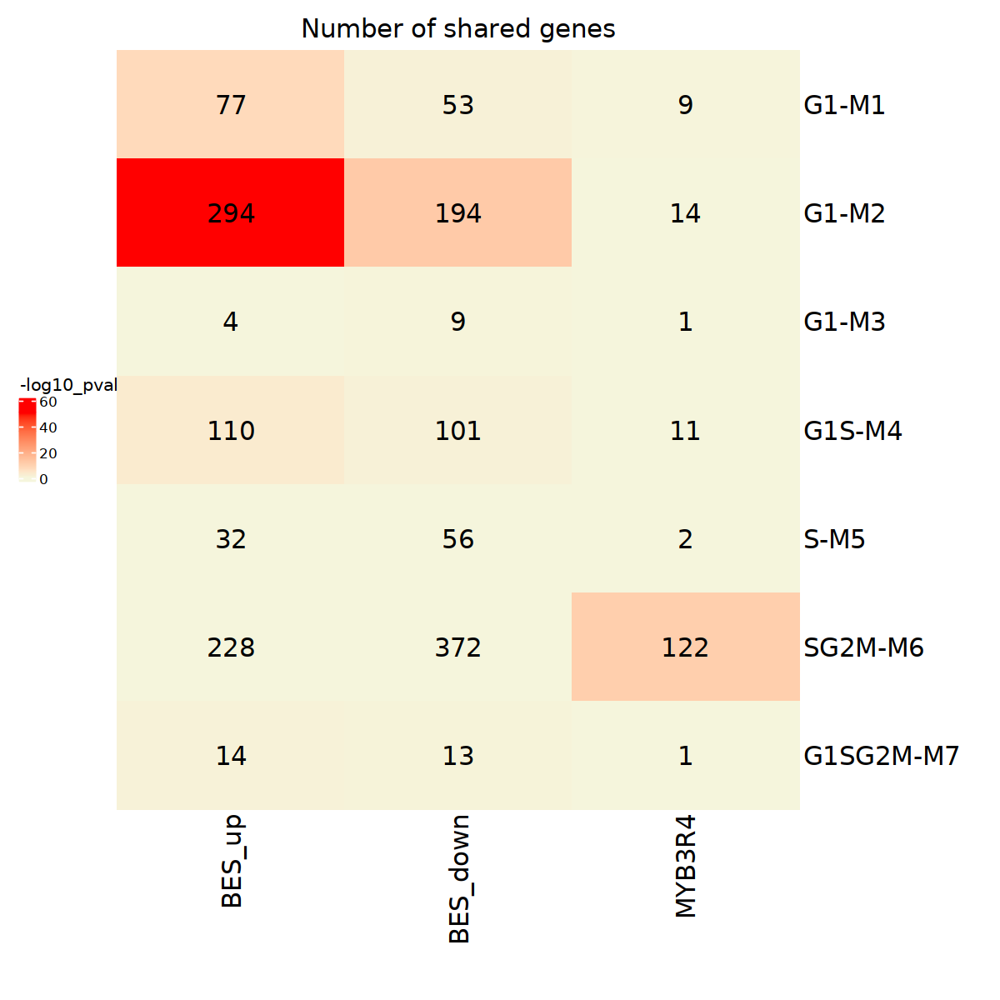

In [80]:
options(repr.plot.width = 10, repr.plot.height = 10)
 
int <- getNestedList(gom.self, "intersection")
int_matrix <- getMatrix(gom.self, "intersection")
p.val <- getMatrix(gom.self, "pval")
JC <- getMatrix(gom.self, "Jaccard")

# log of p.val for intersection
p.val_log <- -log10(p.val + 1e-200)
p.val_log <- p.val_log[c("G1-M1", "G1-M2", "G1-M3", "G1S-M4", "S-M5", "SG2M-M6", "G1SG2M-M7"),]

olap <- Heatmap(p.val_log, 
                name = "-log10_pval", 
                col = colorRamp2(c(0, 50), 
                                 c("beige", "red")), 
                column_title = "Number of shared genes", 
                cluster_rows = F,
                cluster_columns = F, 
                use_raster= FALSE, 
                show_column_names = TRUE, 
                show_row_names = TRUE, 
                show_row_dend = TRUE,
                heatmap_legend_param = list(title_gp = grid::gpar(fontsize = 12)),
                column_title_gp = grid::gpar(fontsize = 18),
                column_names_gp = grid::gpar(fontsize = 18),
                row_names_gp = grid::gpar(fontsize = 18),
                clustering_distance_rows = "pearson",
                clustering_distance_columns = "pearson", 
                show_column_dend = TRUE, cell_fun = function(j, i, x, y, width, height, fill) {grid.text(sprintf("%.0f", int_matrix[i, j]), x, y, gp = gpar(fontsize = 18))
}) 
                        
                        # padding - bottom, left, top, right
draw(olap, padding = unit(c(15, 5, 5, 10), "mm"), heatmap_legend_side = "left")
     

In [81]:
## Prepare gene module list
module_sel <- select(module_df, gene_id, module)
module_list <- split(module_sel, f=module_sel$module)
#this makes list from long df of gene lists - TARGET is what we want to keep
module_list  <- lapply(module_list, function(x) x[names(x)=="gene_id"])
# convert each sublist into character and eliminate duplicates
module_list  <- lapply(module_list, function(x) as.character(unique(x$gene_id)))

In [82]:
module_list <- module_list[c("G1-M1", "G1-M2", "G1-M3", "G1S-M4", "S-M5", "SG2M-M6", "G1SG2M-M7")]

In [83]:
## Prepare gene lists to intersect with module
BES_up <- module_df$gene_id[which(module_df$BES_up=="Yes")]
BES_down <- module_df$gene_id[which(module_df$BES_down=="Yes")]
IAA_up <- module_df$gene_id[which(module_df$AR_up=="Yes")]
IAA_down <- module_df$gene_id[which(module_df$AR_down=="Yes")]
ABA_up <- module_df$gene_id[which(module_df$ABAR_up=="Yes")]
ABA_down <- module_df$gene_id[which(module_df$ABAR_down=="Yes")]
ACC_up <- module_df$gene_id[which(module_df$ACCR_up=="Yes")]
ACC_down <- module_df$gene_id[which(module_df$ACCR_down=="Yes")]
GA_up <- module_df$gene_id[which(module_df$GAR_up=="Yes")]
GA_down <- module_df$gene_id[which(module_df$GAR_down=="Yes")]
SA_up <- module_df$gene_id[which(module_df$SAR_up=="Yes")]
SA_down <- module_df$gene_id[which(module_df$SAR_down=="Yes")]
CK_up <- module_df$gene_id[which(module_df$CR_up=="Yes")]
CK_down <- module_df$gene_id[which(module_df$CR_down=="Yes")]
JA_up <- module_df$gene_id[which(module_df$JAR_up=="Yes")]
JA_down <- module_df$gene_id[which(module_df$JAR_down=="Yes")]
MYB3R4 <- module_df$gene_id[which(module_df$MYB3R4=="Yes")]
SALT <- module_df$gene_id[which(module_df$SALT=="Yes")]
DRUT <- module_df$gene_id[which(module_df$DRUT=="Yes")]
HEAT <- module_df$gene_id[which(module_df$HEAT=="Yes")]
COLD <- module_df$gene_id[which(module_df$COLD=="Yes")]
g_list <- list("BES_up"=BES_up, "BES_down"=BES_down, "JA_up"=JA_up, "JA_down"=JA_down, "IAA_up"=IAA_up, "IAA_down"=IAA_down, "SA_up"=SA_up, "SA_down"=SA_down,
                "ACC_up"=ACC_up, "ACC_down"=ACC_down, "GA_up"=GA_up, "GA_down"=GA_down,"CK_up"=CK_up, "CK_down"=CK_down, "ABA_up"=ABA_up, "ABA_down"=ABA_down,
               "MYB3R4"=MYB3R4, "Salt" = SALT, "Draught" = DRUT, "Heat" = HEAT, "Cold"=COLD)

In [84]:
## GeneOverlap 

# number of integrated features

genome_size <- 26058L

#compare all lists
gom.self <- newGOM(module_list, g_list, genome.size=genome_size)

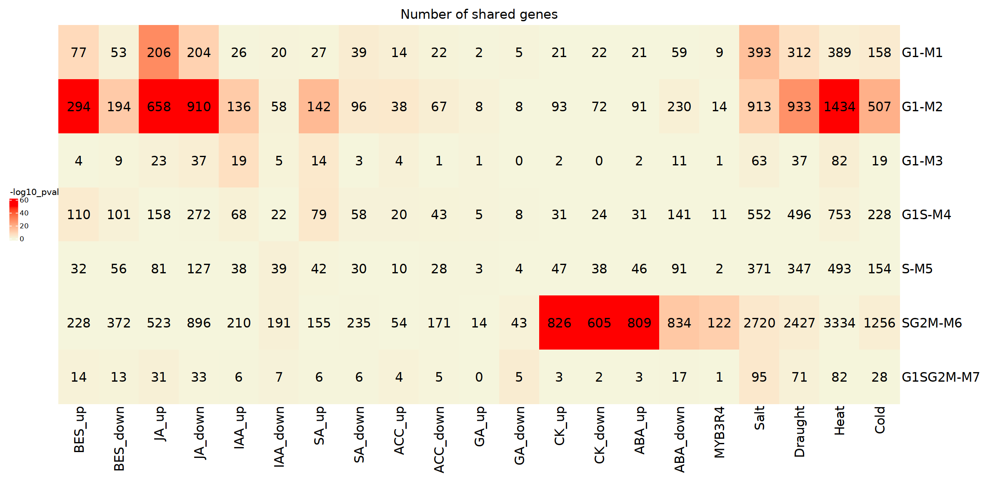

In [85]:
options(repr.plot.width = 20, repr.plot.height = 10)
 
int <- getNestedList(gom.self, "intersection")
int_matrix <- getMatrix(gom.self, "intersection")
p.val <- getMatrix(gom.self, "pval")
JC <- getMatrix(gom.self, "Jaccard")

# log of p.val for intersection
p.val_log <- -log10(p.val + 1e-200)
p.val_log <- p.val_log[c("G1-M1", "G1-M2", "G1-M3", "G1S-M4", "S-M5", "SG2M-M6", "G1SG2M-M7"),]

olap <- Heatmap(p.val_log, 
                name = "-log10_pval", 
                col = colorRamp2(c(0, 50), 
                                 c("beige", "red")), 
                column_title = "Number of shared genes", 
                cluster_rows = F,
                cluster_columns = F, 
                use_raster= FALSE, 
                show_column_names = TRUE, 
                show_row_names = TRUE, 
                show_row_dend = TRUE,
                heatmap_legend_param = list(title_gp = grid::gpar(fontsize = 12)),
                column_title_gp = grid::gpar(fontsize = 18),
                column_names_gp = grid::gpar(fontsize = 18),
                row_names_gp = grid::gpar(fontsize = 18),
                clustering_distance_rows = "pearson",
                clustering_distance_columns = "pearson", 
                show_column_dend = TRUE, cell_fun = function(j, i, x, y, width, height, fill) {grid.text(sprintf("%.0f", int_matrix[i, j]), x, y, gp = gpar(fontsize = 18))
}) 
                        
                        # padding - bottom, left, top, right
draw(olap, padding = unit(c(15, 5, 5, 10), "mm"), heatmap_legend_side = "left")
     

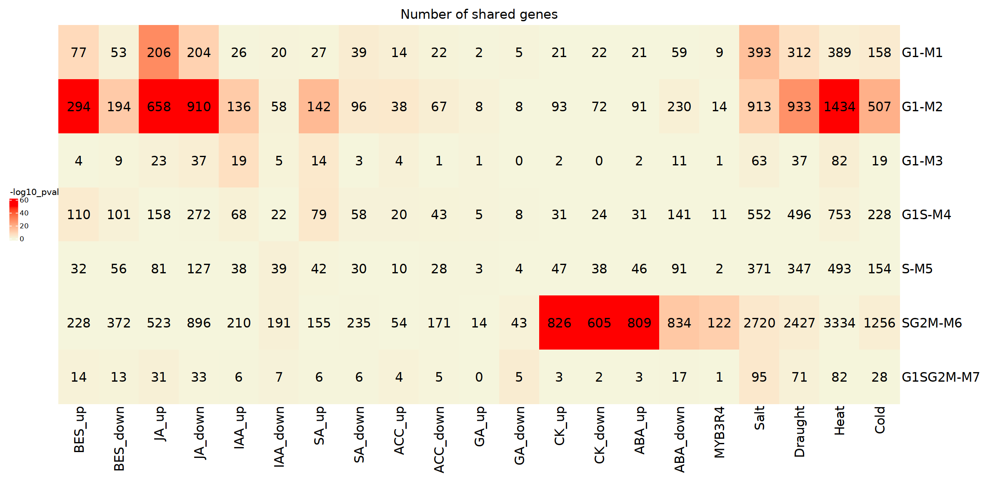

In [86]:
options(repr.plot.width = 20, repr.plot.height = 10)
 
int <- getNestedList(gom.self, "intersection")
int_matrix <- getMatrix(gom.self, "intersection")
p.val <- getMatrix(gom.self, "pval")
JC <- getMatrix(gom.self, "Jaccard")

# log of p.val for intersection
p.val_log <- -log10(p.val + 1e-200)
p.val_log <- p.val_log[c("G1-M1", "G1-M2", "G1-M3", "G1S-M4", "S-M5", "SG2M-M6", "G1SG2M-M7"),]

olap <- Heatmap(p.val_log, 
                name = "-log10_pval", 
                col = colorRamp2(c(0, 50), 
                                 c("beige", "red")), 
                column_title = "Number of shared genes", 
                cluster_rows = F,
                cluster_columns = F, 
                use_raster= FALSE, 
                show_column_names = TRUE, 
                show_row_names = TRUE, 
                show_row_dend = TRUE,
                heatmap_legend_param = list(title_gp = grid::gpar(fontsize = 12)),
                column_title_gp = grid::gpar(fontsize = 18),
                column_names_gp = grid::gpar(fontsize = 18),
                row_names_gp = grid::gpar(fontsize = 18),
                clustering_distance_rows = "pearson",
                clustering_distance_columns = "pearson", 
                show_column_dend = TRUE, cell_fun = function(j, i, x, y, width, height, fill) {grid.text(sprintf("%.0f", int_matrix[i, j]), x, y, gp = gpar(fontsize = 18))
}) 
                        
                        # padding - bottom, left, top, right
draw(olap, padding = unit(c(15, 5, 5, 10), "mm"), heatmap_legend_side = "left")
     